# Telecom Churn - Group Case Study

* __Problem Statement__
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.
 
For many incumbent operators, retaining high profitable customers is the number one business goal.
 
To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.
 
In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.


* __Business Goal__ 
The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.

# Approach of my analysis to the problem

__High Level Approach__
As business requirement, we follow the approach defined in the Objective

* The basis for different models is as follows:

Data Preparation
The following data preparation steps are crucial for this problem:
 
1. Derive new features
This is one of the most important parts of data preparation since good features are often the differentiators between good and bad models. Use your business understanding to derive features you think could be important indicators of churn.
 
2. Filter high-value customers
As mentioned above, you need to predict churn only for the high-value customers. Define high-value customers as follows: Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).
 
After filtering the high-value customers, you should get about 29.9k rows.
 
3. Tag churners and remove attributes of the churn phase
Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes you need to use to tag churners are:
•	total_ic_mou_9
•	total_og_mou_9
•	vol_2g_mb_9
•	vol_3g_mb_9

After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).
 
Modelling
Build models to predict churn. The predictive model that you’re going to build will serve two purposes:
1.	It will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.
2.	It will be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.
 
In some cases, both of the above-stated goals can be achieved by a single machine learning model. But here, you have a large number of attributes, and thus you should try using a dimensionality reduction technique such as PCA and then build a predictive model. After PCA, you can use any classification model.
 
Also, since the rate of churn is typically low (about 5-10%, this is called class-imbalance) - try using techniques to handle class imbalance. 
 
You can take the following suggestive steps to build the model:
1.	Preprocess data (convert columns to appropriate formats, handle missing values, etc.)
2.	Conduct appropriate exploratory analysis to extract useful insights (whether directly useful for business or for eventual modelling/feature engineering).
3.	Derive new features.
4.	Reduce the number of variables using PCA.
5.	Train a variety of models, tune model hyperparameters, etc. (handle class imbalance using appropriate techniques).
6.	Evaluate the models using appropriate evaluation metrics. Note that is is more important to identify churners than the non-churners accurately - choose an appropriate evaluation metric which reflects this business goal.
7.	Finally, choose a model based on some evaluation metric.
 
The above model will only be able to achieve one of the two goals - to predict customers who will churn. You can’t use the above model to identify the important features for churn. That’s because PCA usually creates components which are not easy to interpret.
 
Therefore, build another model with the main objective of identifying important predictor attributes which help the business understand indicators of churn. A good choice to identify important variables is a logistic regression model or a model from the tree family. In case of logistic regression, make sure to handle multi-collinearity.
 
After identifying important predictors, display them visually - you can use plots, summary tables etc. - whatever you think best conveys the importance of features.
 
Finally, recommend strategies to manage customer churn based on your observations.



# Model Evaluation Metrics


* It has been given that we have to predict the Churners to avoid business loss. With the given data it is possible to predict people who can be churned. As we have different models, we can choose following metrics for evaluation.
1.	The train and test scores should be high.
2.  There should not be much variation between train scores and test scores. High train and low test suggests that its a overfit model.
3.  We should target to 
       -  have high Recall and high Precision which suggest that model is able to predict True Churners correctly
       -  have high Recall and low Precision is ok model which suggest that model is able to predict True churners along with some non churners in it.
       -  We reject the model which having low Recall and Low Precision or low Recall and high Precision for obvious reasons

# Import Python Functions

In [1]:
# Local classes and Local flags

# Local Classes
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'
    
# Debug flag for investigative purpose
DEBUG = 0

# Default random_state
rndm_stat = 42

In [2]:
# Python libraries for Data processing and analysis
import time as time
strt = time.time()
import pandas as pd
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 100)
pd.options.mode.use_inf_as_na = True
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import glob
from matplotlib.pyplot import figure
import warnings
import math
import itertools
warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
from math import sqrt
import re
from prettytable import PrettyTable
from datetime import datetime

# ML Libraries
import statsmodels
import statsmodels.api as sm
import sklearn as sk
from sklearn.model_selection import train_test_split,GridSearchCV, KFold,cross_val_score,StratifiedKFold
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error, confusion_matrix,classification_report
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler,OrdinalEncoder,LabelEncoder,Normalizer,RobustScaler,PowerTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import AdaBoostClassifier,RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier

from sklearn import metrics

# ML Feature Engineering
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA as IPCA

# Local User Defined Functions

## Local functions for data overview and data cleaning

In [3]:
# local functions

# Function to read a file & Store it in Pandas
# read_file takes either csv or excel file as input and reuturns a pandas DF and
# also prints head, tail, description, info and shape of the DF
def read_file(l_fname,l_path,head=0):
    i = l_fname.split(".")
    f_path = l_path+'/'+l_fname
    print(f_path,i[0],i[1])
    if (i[1] == "xlsx"):
        l_df = pd.read_excel(f_path,header=head,encoding = "ISO-8859-1",infer_datetime_format=True)
    elif (i[1] == "csv"):
        l_df = pd.read_csv(f_path,header=head,encoding = "ISO-8859-1",infer_datetime_format=True)
    ov_df(l_df)
    return(l_df)

# Function to get the Overview of DataFrame
# take df as input and prints head, tail, description, info and shape of the DF
def ov_df(l_df):
    print(color.BOLD+color.PURPLE + 'Inspect and Explore the Dataset' + color.END)
    print("\n#####################  DataFrame Head  ######################")
    print(l_df.head(3))
    print("\n#####################  DataFrame Tail  ######################")
    print(l_df.tail(3))
    print("\n#####################  DataFrame Info  ######################")
    print(l_df.info())
    print("\n####################  DataFrame Columns  ####################")
    print(list(l_df.columns))
    print("\n####################  DataFrame Shape  ####################")
    print("No of Rows",l_df.shape[0])
    print("No of Columns",l_df.shape[1])

# Function per_col_null takes a df as input and prints summary of Null Values across Columns
def per_col_null(l_df):
    print("\n############  Missing Values of Columns in %  ############")
    col_null = round((l_df.isnull().sum().sort_values(ascending=False)/len(l_df))*100,4)
    print(col_null[col_null > 0])  

# Function to change the cast the column into different type
def col_cast(l_df,n_dtyp,*args):
    for l_c_name in args:
        l_df = l_df.astype({l_c_name:n_dtyp})
        print(l_df[l_c_name].describe())
    return(l_df)

## Functions to plot

In [4]:
# Function to plot 2 or more box plots
# m_box_plt takes a df, dimensions of subplot (no of rows and columns) and variable list of columns
# to plot multiple boxplots
def m_box_plt(l_df,n_r,n_c,*args):
    j=1
    fig_h = n_r * 4
    plt.figure(1,figsize=(13,fig_h))
    # set palette 
    palette = itertools.cycle(sns.color_palette())
    sns.set(style="whitegrid",font_scale=1,palette='RdYlGn')
    for i in args:
        plt.subplot(n_r,n_c,j)
        sns.boxplot(l_df[i],orient="v")
        #sns.swarmplot(l_df[i],color=".25",orient="v")
        plt.title('Central Tendency of {}'.format(i),fontsize=12)
        j+=1
    plt.show()
    
# Function to plot 2 or more Linear Regression plots
# reg_plt takes a df, dimensions of subplot (no of rows and columns), dependent variable and variable list of columns
# to plot multiple reg plots
def reg_plt(l_df,n_r,n_c,l_dep,*args):
    j=1
    plt.figure(1,figsize=(13,13))
    sns.set(style="whitegrid",font_scale=1,palette='Set1')
    for i in args:
        plt.subplot(n_r,n_c,j)
        ax = sns.regplot(x=i,y=l_dep,data=l_df,x_jitter=.1)
        plt.title('Linear Regression Plot of {} and {}'.format(i,l_dep),fontsize=12)
        plt.legend(loc=1)
        j+=1
    plt.show()

#  Function to plot 2 or more box plots
# comp_box_plt takes a df, dimensions of subplot (no of rows and columns), dependent variable and variable list of columns
# to plot multiple comparitive box plots
def comp_box_plt(l_df,n_r,n_c,l_dep,*args):
    j=1
    fig_h = n_r * 4
    plt.figure(1,figsize=(13,fig_h))
    # set palette 
    palette = itertools.cycle(sns.color_palette())
    sns.set(style="whitegrid",font_scale=1,palette='RdYlGn')
    for i in args:
        plt.subplot(n_r,n_c,j)
        sns.boxplot(l_df[i],orient="v")
        #sns.swarmplot(l_df[i],color=".25",orient="v")
        plt.title('Central Tendency of {}'.format(i),fontsize=12)
        j+=1
    plt.show()
    
    
#  Function to plot 2 or more box plots
# dist_plt takes a df, dimensions of subplot (no of rows and columns), variable list of columns
# to plot multiple comparitive distribution plots
def dist_plt(l_df,n_r,n_c,*args):
    j=1
    colrs = ["dummy","skyblue","red","olive","gold","teal","green","blue"]
    fig_h = n_r * 5
    plt.figure(1,figsize=(8,fig_h))
    sns.set(style="whitegrid",font_scale=0.8)
    for i in args:
        plt.subplot(n_r,n_c,j)
        ax = sns.distplot(l_df[i],bins=20,color=colrs[j])
        plt.title('Distribution of {}'.format(i),fontsize=10)
        j+=1
    plt.show()

# Function to plot 2 or more Seaborn count plots. 
# This function takes dataframe and variable no of arguments which are columns and do subplots based on the no of rows 
# and columns given
def cnt_plt(l_df,n_r,n_c,*args):
    j=1
    fig_h = n_r * 7
    plt.figure(1,figsize=(14,fig_h))
    sns.set(font_scale=1,palette='bright')
    rot = 25
    if n_c == 1:
        rot = 90
    for i in args:
        plt.subplot(n_r,n_c,j)
        ax = sns.countplot(l_df[i])
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=rot)
        total = len(l_df[i])
        plt.title('Univariate Analysis of variable {}'.format(i),fontsize=12)
        for p in ax.patches:
            percentage = '{:.1f}%'.format(100 * p.get_height()/total)
            x = p.get_x() + 0.3
            y = p.get_y() + p.get_height()
            ax.annotate(percentage, (x, y))
        j+=1
    plt.show()

# Sourcing the Data

## Read the train.csv

In [5]:
# Set the path and file name
folder=r"C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\ML2\Telecom_Churn_Case_Study"
file="telecom_churn_data.csv"

# Read file using local functions. read_file takes either csv or excel file as input and reuturns a pandas DF and
# also prints head, tail, description, info and shape of the DF
t_df = read_file(file,folder)

C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\ML2\Telecom_Churn_Case_Study/telecom_churn_data.csv telecom_churn_data csv
Inspect and Explore the Dataset

#####################  DataFrame Head  ######################
   mobile_number  circle_id  loc_og_t2o_mou  std_og_t2o_mou  loc_ic_t2o_mou  \
0     7000842753        109             0.0             0.0             0.0   
1     7001865778        109             0.0             0.0             0.0   
2     7001625959        109             0.0             0.0             0.0   

  last_date_of_month_6 last_date_of_month_7 last_date_of_month_8  \
0            6/30/2014            7/31/2014            8/31/2014   
1            6/30/2014            7/31/2014            8/31/2014   
2            6/30/2014            7/31/2014            8/31/2014   

  last_date_of_month_9   arpu_6   arpu_7   arpu_8   arpu_9  onnet_mou_6  \
0            9/30/2014  197.385  214.816  213.803   21.100          NaN   
1            9/30/2014   34

## Inspect the Column Data Types of c_df

In [6]:
# Analyze Categorical, Numerical and Date variables of Application Data
print(color.BOLD+"Categorical and Numerical Variables"+ color.END)
display(t_df.dtypes.value_counts())
print(color.BOLD+"Numerical Integer Variables"+ color.END)
display(t_df.select_dtypes(include='int64').dtypes)
print(color.BOLD+"Categorical Variables"+ color.END)
display(t_df.select_dtypes(include=object).dtypes)
print(color.BOLD+"Numerical Float Variables"+ color.END)
display(t_df.select_dtypes(include='float64').dtypes)

Categorical and Numerical Variables


float64    179
int64       35
object      12
dtype: int64

Numerical Integer Variables


mobile_number         int64
circle_id             int64
total_rech_num_6      int64
total_rech_num_7      int64
total_rech_num_8      int64
total_rech_num_9      int64
total_rech_amt_6      int64
total_rech_amt_7      int64
total_rech_amt_8      int64
total_rech_amt_9      int64
max_rech_amt_6        int64
max_rech_amt_7        int64
max_rech_amt_8        int64
max_rech_amt_9        int64
last_day_rch_amt_6    int64
last_day_rch_amt_7    int64
last_day_rch_amt_8    int64
last_day_rch_amt_9    int64
monthly_2g_6          int64
monthly_2g_7          int64
monthly_2g_8          int64
monthly_2g_9          int64
sachet_2g_6           int64
sachet_2g_7           int64
sachet_2g_8           int64
sachet_2g_9           int64
monthly_3g_6          int64
monthly_3g_7          int64
monthly_3g_8          int64
monthly_3g_9          int64
sachet_3g_6           int64
sachet_3g_7           int64
sachet_3g_8           int64
sachet_3g_9           int64
aon                   int64
dtype: object

Categorical Variables


last_date_of_month_6        object
last_date_of_month_7        object
last_date_of_month_8        object
last_date_of_month_9        object
date_of_last_rech_6         object
date_of_last_rech_7         object
date_of_last_rech_8         object
date_of_last_rech_9         object
date_of_last_rech_data_6    object
date_of_last_rech_data_7    object
date_of_last_rech_data_8    object
date_of_last_rech_data_9    object
dtype: object

Numerical Float Variables


loc_og_t2o_mou        float64
std_og_t2o_mou        float64
loc_ic_t2o_mou        float64
arpu_6                float64
arpu_7                float64
arpu_8                float64
arpu_9                float64
onnet_mou_6           float64
onnet_mou_7           float64
onnet_mou_8           float64
onnet_mou_9           float64
offnet_mou_6          float64
offnet_mou_7          float64
offnet_mou_8          float64
offnet_mou_9          float64
roam_ic_mou_6         float64
roam_ic_mou_7         float64
roam_ic_mou_8         float64
roam_ic_mou_9         float64
roam_og_mou_6         float64
roam_og_mou_7         float64
roam_og_mou_8         float64
roam_og_mou_9         float64
loc_og_t2t_mou_6      float64
loc_og_t2t_mou_7      float64
loc_og_t2t_mou_8      float64
loc_og_t2t_mou_9      float64
loc_og_t2m_mou_6      float64
loc_og_t2m_mou_7      float64
loc_og_t2m_mou_8      float64
loc_og_t2m_mou_9      float64
loc_og_t2f_mou_6      float64
loc_og_t2f_mou_7      float64
loc_og_t2f

In [7]:
# Create a list of numerical and categorical variables for future analysis
t_num_li = list(t_df.select_dtypes(include=np.number).columns)
t_cat_li = list(t_df.select_dtypes(exclude=np.number).columns)
print(color.BOLD+"\nNumerical Columns -"+color.END,t_num_li)
print(color.BOLD+"\nCategorical Columns -"+color.END,t_cat_li)


Numerical Columns - ['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2

In [8]:
# Inspect the Categorical columns
t_df[t_cat_li].head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/21/2014,7/16/2014,8/8/2014,9/28/2014,6/21/2014,7/16/2014,8/8/2014,NaN
1,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/29/2014,7/31/2014,8/28/2014,9/30/2014,NaN,7/25/2014,8/10/2014,NaN
2,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/24/2014,8/14/2014,9/29/2014,NaN,NaN,NaN,9/17/2014
3,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/28/2014,7/31/2014,8/31/2014,9/30/2014,NaN,NaN,NaN,NaN
4,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/26/2014,7/28/2014,8/9/2014,9/28/2014,6/4/2014,NaN,NaN,NaN


## Analyze Numerical Columns of the t_df

In [9]:
# Inspect the Numerical columns
t_df[t_num_li].head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,...,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,...,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.1

## Analyze Categorical Columns of the t_df

In [10]:
# Inspect the Numerical columns
t_df[t_cat_li].head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/21/2014,7/16/2014,8/8/2014,9/28/2014,6/21/2014,7/16/2014,8/8/2014,NaN
1,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/29/2014,7/31/2014,8/28/2014,9/30/2014,NaN,7/25/2014,8/10/2014,NaN
2,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/24/2014,8/14/2014,9/29/2014,NaN,NaN,NaN,9/17/2014
3,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/28/2014,7/31/2014,8/31/2014,9/30/2014,NaN,NaN,NaN,NaN
4,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/26/2014,7/28/2014,8/9/2014,9/28/2014,6/4/2014,NaN,NaN,NaN


# Business Requirements - Derived Metrics

## Derived Metrics based on Business Requirements

Define high-value customers as follows: Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

Given data columns for voice and data separately. Hence we have to find the combined recharge amount for data and voice services.

* Average Voice Recharge during Good Phase = __average of "total_rech_amt_6"+"total_rech_amt_7"__
* Average Data Recharge during Good Phase = __average of "av_rech_amt_data_6" * "total_rech_data_6" + "av_rech_amt_data_7" * "total_rech_data_7"__

* __Average Recharge amount = Average Voice Recharge during Good Phase + Average Data Recharge during Good Phase__
 


### Inspect the Null Values in t_df 

In [11]:
# Null values in the Application DF. 
# per_col_null is local function which returns the % of null columns which are non zero
per_col_null(t_df)


############  Missing Values of Columns in %  ############
count_rech_2g_6             74.8467
date_of_last_rech_data_6    74.8467
count_rech_3g_6             74.8467
av_rech_amt_data_6          74.8467
max_rech_data_6             74.8467
total_rech_data_6           74.8467
arpu_3g_6                   74.8467
arpu_2g_6                   74.8467
night_pck_user_6            74.8467
fb_user_6                   74.8467
arpu_3g_7                   74.4287
count_rech_2g_7             74.4287
fb_user_7                   74.4287
count_rech_3g_7             74.4287
arpu_2g_7                   74.4287
av_rech_amt_data_7          74.4287
max_rech_data_7             74.4287
night_pck_user_7            74.4287
total_rech_data_7           74.4287
date_of_last_rech_data_7    74.4287
night_pck_user_9            74.0777
date_of_last_rech_data_9    74.0777
fb_user_9                   74.0777
arpu_2g_9                   74.0777
max_rech_data_9             74.0777
arpu_3g_9                   74.0777
tota

### Inspect the Null Values in t_df wrt columns that are used for calculation of High Valued Customers

In [12]:
# Null values in the Application DF. 
# per_col_null is local function which returns the % of null columns which are non zero
t_df[["total_rech_amt_6","total_rech_amt_7","av_rech_amt_data_6","total_rech_data_6","av_rech_amt_data_7","total_rech_data_7"]].isnull().sum()

total_rech_amt_6          0
total_rech_amt_7          0
av_rech_amt_data_6    74846
total_rech_data_6     74846
av_rech_amt_data_7    74428
total_rech_data_7     74428
dtype: int64

__Observations__
* There are null values across the columns "av_rech_amt_data_6","total_rech_data_6","av_rech_amt_data_7","total_rech_data_7".
* We might need to impute them to derive the high valued customers

## Segregate the Columns into Data and Non Data Columns

In [13]:
# all the features
all_c_lis = list(t_df.columns)
len(all_c_lis)

# derive list of features related to churn phase
pattern = (r'3g|2g|vbc|fb|data')
data_li = list(filter(lambda x : re.search(pattern,x) ,all_c_lis))
print(data_li,len(data_li))

['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9', 'vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_2g_mb_9', 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8', 'vol_3g_mb_9', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_2g_9', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'monthly_2g_9', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'sachet_2g_9', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'sachet_3g_9', 'fb_user_6', 'f

In [14]:
# Devide the columns wrt month of the year
jun_data_li = list(filter(lambda x : re.search(r'_6|jun',x),data_li))
jul_data_li = list(filter(lambda x : re.search(r'_7|jul',x),data_li))
aug_data_li = list(filter(lambda x : re.search(r'_8|aug',x),data_li))
sep_data_li = list(filter(lambda x : re.search(r'_9|sep',x),data_li))

# Inspect the lists
print(jun_data_li)
print(jul_data_li)
print(aug_data_li)
print(sep_data_li)

['date_of_last_rech_data_6', 'total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6', 'vol_2g_mb_6', 'vol_3g_mb_6', 'arpu_3g_6', 'arpu_2g_6', 'monthly_2g_6', 'sachet_2g_6', 'monthly_3g_6', 'sachet_3g_6', 'fb_user_6', 'jun_vbc_3g']
['date_of_last_rech_data_7', 'total_rech_data_7', 'max_rech_data_7', 'count_rech_2g_7', 'count_rech_3g_7', 'av_rech_amt_data_7', 'vol_2g_mb_7', 'vol_3g_mb_7', 'arpu_3g_7', 'arpu_2g_7', 'monthly_2g_7', 'sachet_2g_7', 'monthly_3g_7', 'sachet_3g_7', 'fb_user_7', 'jul_vbc_3g']
['date_of_last_rech_data_8', 'total_rech_data_8', 'max_rech_data_8', 'count_rech_2g_8', 'count_rech_3g_8', 'av_rech_amt_data_8', 'vol_2g_mb_8', 'vol_3g_mb_8', 'arpu_3g_8', 'arpu_2g_8', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'sachet_3g_8', 'fb_user_8', 'aug_vbc_3g']
['date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9', 'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_

### Explore the Data columns for June having Null values

In [15]:
# explore null values across June data services
t_df[jun_data_li].isnull().sum()

date_of_last_rech_data_6    74846
total_rech_data_6           74846
max_rech_data_6             74846
count_rech_2g_6             74846
count_rech_3g_6             74846
av_rech_amt_data_6          74846
vol_2g_mb_6                     0
vol_3g_mb_6                     0
arpu_3g_6                   74846
arpu_2g_6                   74846
monthly_2g_6                    0
sachet_2g_6                     0
monthly_3g_6                    0
sachet_3g_6                     0
fb_user_6                   74846
jun_vbc_3g                      0
dtype: int64

__Observations__
  * 'date_of_last_rech_data_6', 'total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6',  'arpu_3g_6', 'arpu_2g_6', 'fb_user_6' have equal no of null values
  * 'vol_2g_mb_6',  'vol_3g_mb_6','monthly_2g_6', 'sachet_2g_6',
 'monthly_3g_6', 'sachet_3g_6' and jun_vbc_3g do not have null values                     

In [16]:
# Explore the columns and unique values 
{col:len(t_df[t_df[jun_data_li].isnull().sum(axis=1) > 0][col].unique()) for col in ['vol_2g_mb_6',  'vol_3g_mb_6','monthly_2g_6', 'sachet_2g_6',
 'monthly_3g_6', 'sachet_3g_6','jun_vbc_3g']}

{'vol_2g_mb_6': 1,
 'vol_3g_mb_6': 1,
 'monthly_2g_6': 1,
 'sachet_2g_6': 1,
 'monthly_3g_6': 1,
 'sachet_3g_6': 1,
 'jun_vbc_3g': 2929}

In [17]:
# explore the columns 
{col:list(t_df[t_df[jun_data_li].isnull().sum(axis=1) > 0][col].value_counts().index) for col in ['vol_2g_mb_6',  'vol_3g_mb_6','monthly_2g_6', 'sachet_2g_6',
 'monthly_3g_6', 'sachet_3g_6']}

{'vol_2g_mb_6': [0.0],
 'vol_3g_mb_6': [0.0],
 'monthly_2g_6': [0],
 'sachet_2g_6': [0],
 'monthly_3g_6': [0],
 'sachet_3g_6': [0]}

__Observations__
  * From the above inspection, it is clear that there is no much variation in the columns - 'vol_2g_mb_6',  'vol_3g_mb_6','monthly_2g_6', 'sachet_2g_6',
 'monthly_3g_6', 'sachet_3g_6' and the value is 0. 
  * 'date_of_last_rech_data_6', 'total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6',  'arpu_3g_6', 'arpu_2g_6', 'fb_user_6' are not actually might not be nulls but __they are missing due to the fact that user might not have actually recharged for the data  services__.
  * Hence we would impute these columns with 0

In [18]:
# Imputate the NULLS with 0
t_df["date_of_last_rech_data_6"] = t_df["date_of_last_rech_data_6"].fillna("01/01/2015")
t_df[jun_data_li] = t_df[jun_data_li].fillna(0)
t_df[jun_data_li].isnull().sum()

date_of_last_rech_data_6    0
total_rech_data_6           0
max_rech_data_6             0
count_rech_2g_6             0
count_rech_3g_6             0
av_rech_amt_data_6          0
vol_2g_mb_6                 0
vol_3g_mb_6                 0
arpu_3g_6                   0
arpu_2g_6                   0
monthly_2g_6                0
sachet_2g_6                 0
monthly_3g_6                0
sachet_3g_6                 0
fb_user_6                   0
jun_vbc_3g                  0
dtype: int64

### Explore the Data columns for July having Null values

In [19]:
# explore null values across June data services
t_df[jul_data_li].isnull().sum()

date_of_last_rech_data_7    74428
total_rech_data_7           74428
max_rech_data_7             74428
count_rech_2g_7             74428
count_rech_3g_7             74428
av_rech_amt_data_7          74428
vol_2g_mb_7                     0
vol_3g_mb_7                     0
arpu_3g_7                   74428
arpu_2g_7                   74428
monthly_2g_7                    0
sachet_2g_7                     0
monthly_3g_7                    0
sachet_3g_7                     0
fb_user_7                   74428
jul_vbc_3g                      0
dtype: int64

__Observations__
  * 'date_of_last_rech_data_7', 'total_rech_data_7', 'max_rech_data_7',
 'count_rech_2g_7', 'count_rech_3g_7', 'av_rech_amt_data_7','arpu_3g_7', 'arpu_2g_7', 'fb_user_7' have equal no of null values
  * 'vol_2g_mb_7',  'vol_3g_mb_7','monthly_2g_7', 'sachet_2g_7',
 'monthly_3g_7', 'sachet_3g_7' and jul_vbc_3g do not have null values                     

In [20]:
# Explore the columns and unique values 
{col:len(t_df[t_df[jul_data_li].isnull().sum(axis=1) > 0][col].unique()) for col in ['vol_2g_mb_7',  'vol_3g_mb_7','monthly_2g_7', 'sachet_2g_7',
 'monthly_3g_7', 'sachet_3g_7','jul_vbc_3g']}

{'vol_2g_mb_7': 1,
 'vol_3g_mb_7': 1,
 'monthly_2g_7': 1,
 'sachet_2g_7': 1,
 'monthly_3g_7': 1,
 'sachet_3g_7': 1,
 'jul_vbc_3g': 3167}

In [21]:
# explore the columns 
{col:list(t_df[t_df[jul_data_li].isnull().sum(axis=1) > 0][col].value_counts().index) for col in ['vol_2g_mb_7',  'vol_3g_mb_7','monthly_2g_7', 'sachet_2g_7',
 'monthly_3g_7', 'sachet_3g_7']}

{'vol_2g_mb_7': [0.0],
 'vol_3g_mb_7': [0.0],
 'monthly_2g_7': [0],
 'sachet_2g_7': [0],
 'monthly_3g_7': [0],
 'sachet_3g_7': [0]}

__Observations__
  * From the above inspection, it is clear that there is no much variation in the columns - 'vol_2g_mb_7',  'vol_3g_mb_7','monthly_2g_7', 'sachet_2g_7',
 'monthly_3g_7', 'sachet_3g_7' and the value is 0. 
  * 'date_of_last_rech_data_7', 'total_rech_data_7', 'max_rech_data_7', 'count_rech_2g_7', 'count_rech_3g_7', 'av_rech_amt_data_7',  'arpu_3g_7', 'arpu_2g_7', 'fb_user_7' are not actually might not be nulls but __they are missing due to the fact that user might not have actually recharged for the data  services__.
  * Hence we would impute these columns with 0

In [22]:
# Imputate the NULLS with 0
t_df["date_of_last_rech_data_7"] = t_df["date_of_last_rech_data_7"].fillna("01/01/2015")
t_df[jul_data_li] = t_df[jul_data_li].fillna(0)
t_df[jul_data_li].isnull().sum()

date_of_last_rech_data_7    0
total_rech_data_7           0
max_rech_data_7             0
count_rech_2g_7             0
count_rech_3g_7             0
av_rech_amt_data_7          0
vol_2g_mb_7                 0
vol_3g_mb_7                 0
arpu_3g_7                   0
arpu_2g_7                   0
monthly_2g_7                0
sachet_2g_7                 0
monthly_3g_7                0
sachet_3g_7                 0
fb_user_7                   0
jul_vbc_3g                  0
dtype: int64

### Explore the Data columns for August having Null values

In [23]:
# explore null values across August data services
t_df[aug_data_li].isnull().sum()

date_of_last_rech_data_8    73660
total_rech_data_8           73660
max_rech_data_8             73660
count_rech_2g_8             73660
count_rech_3g_8             73660
av_rech_amt_data_8          73660
vol_2g_mb_8                     0
vol_3g_mb_8                     0
arpu_3g_8                   73660
arpu_2g_8                   73660
monthly_2g_8                    0
sachet_2g_8                     0
monthly_3g_8                    0
sachet_3g_8                     0
fb_user_8                   73660
aug_vbc_3g                      0
dtype: int64

__Observations__
  * 'date_of_last_rech_data_8', 'total_rech_data_8', 'max_rech_data_8',
 'count_rech_2g_8', 'count_rech_3g_8', 'av_rech_amt_data_8',  'arpu_3g_8', 'arpu_2g_8', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'sachet_3g_8', 'fb_user_8', 'aug_vbc_3g' have equal no of null values
  * 'vol_2g_mb_8',  'vol_3g_mb_8','monthly_2g_8', 'sachet_2g_8',
 'monthly_3g_8', 'sachet_3g_8' and aug_vbc_3g do not have null values                     

In [24]:
# Explore the columns and unique values 
{col:len(t_df[t_df[aug_data_li].isnull().sum(axis=1) > 0][col].unique()) for col in ['vol_2g_mb_8',  'vol_3g_mb_8','monthly_2g_8', 'sachet_2g_8',
 'monthly_3g_8', 'sachet_3g_8','aug_vbc_3g']}

{'vol_2g_mb_8': 1,
 'vol_3g_mb_8': 1,
 'monthly_2g_8': 1,
 'sachet_2g_8': 1,
 'monthly_3g_8': 1,
 'sachet_3g_8': 1,
 'aug_vbc_3g': 3307}

In [25]:
# explore the columns 
{col:list(t_df[t_df[aug_data_li].isnull().sum(axis=1) > 0][col].value_counts().index) for col in ['vol_2g_mb_8',  'vol_3g_mb_8','monthly_2g_8', 'sachet_2g_8',
 'monthly_3g_8', 'sachet_3g_8']}

{'vol_2g_mb_8': [0.0],
 'vol_3g_mb_8': [0.0],
 'monthly_2g_8': [0],
 'sachet_2g_8': [0],
 'monthly_3g_8': [0],
 'sachet_3g_8': [0]}

__Observations__
  * From the above inspection, it is clear that there is no much variation in the columns - 'vol_2g_mb_8',  'vol_3g_mb_8','monthly_2g_8', 'sachet_2g_8',
 'monthly_3g_8', 'sachet_3g_8' the value is 0. 
  * 'date_of_last_rech_data_8', 'total_rech_data_8', 'max_rech_data_8', 'count_rech_2g_8', 'count_rech_3g_8', 'av_rech_amt_data_8',  'arpu_3g_8', 'arpu_2g_8', 'fb_user_8' are not actually might not be nulls but __they are missing due to the fact that user might not have actually recharged for the data  services__.
  * Hence we would impute these columns with 0

In [26]:
# Imputate the NULLS with 0
t_df["date_of_last_rech_data_8"] = t_df["date_of_last_rech_data_8"].fillna("01/01/2015")
t_df[aug_data_li] = t_df[aug_data_li].fillna(0)
t_df[aug_data_li].isnull().sum()

date_of_last_rech_data_8    0
total_rech_data_8           0
max_rech_data_8             0
count_rech_2g_8             0
count_rech_3g_8             0
av_rech_amt_data_8          0
vol_2g_mb_8                 0
vol_3g_mb_8                 0
arpu_3g_8                   0
arpu_2g_8                   0
monthly_2g_8                0
sachet_2g_8                 0
monthly_3g_8                0
sachet_3g_8                 0
fb_user_8                   0
aug_vbc_3g                  0
dtype: int64

### Explore the Data columns for September having Null values

In [27]:
# explore null values across June data services
t_df[sep_data_li].isnull().sum()

date_of_last_rech_data_9    74077
total_rech_data_9           74077
max_rech_data_9             74077
count_rech_2g_9             74077
count_rech_3g_9             74077
av_rech_amt_data_9          74077
vol_2g_mb_9                     0
vol_3g_mb_9                     0
arpu_3g_9                   74077
arpu_2g_9                   74077
monthly_2g_9                    0
sachet_2g_9                     0
monthly_3g_9                    0
sachet_3g_9                     0
fb_user_9                   74077
sep_vbc_3g                      0
dtype: int64

__Observations__
  * 'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9',
 'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'arpu_3g_9', 'arpu_2g_9', 'fb_user_9' have equal no of null values
  * 'vol_2g_mb_9',  'vol_3g_mb_9','monthly_2g_9', 'sachet_2g_9',
 'monthly_3g_9', 'sachet_3g_9' and 'sep_vbc_3g' do not have null values                     

In [28]:
# Explore the columns and unique values 
{col:len(t_df[t_df[sep_data_li].isnull().sum(axis=1) > 0][col].unique()) for col in ['vol_2g_mb_9', 'vol_3g_mb_9','monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9','sep_vbc_3g']}

{'vol_2g_mb_9': 1,
 'vol_3g_mb_9': 1,
 'monthly_2g_9': 1,
 'sachet_2g_9': 1,
 'monthly_3g_9': 1,
 'sachet_3g_9': 1,
 'sep_vbc_3g': 1128}

In [29]:
# explore the columns 
{col:list(t_df[t_df[sep_data_li].isnull().sum(axis=1) > 0][col].value_counts().index) for col in ['vol_2g_mb_9', 'vol_3g_mb_9','monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9']}

{'vol_2g_mb_9': [0.0],
 'vol_3g_mb_9': [0.0],
 'monthly_2g_9': [0],
 'sachet_2g_9': [0],
 'monthly_3g_9': [0],
 'sachet_3g_9': [0]}

__Observations__
  * From the above inspection, it is clear that there is no much variation in the columns - 'vol_2g_mb_9', 'vol_3g_mb_9','monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9' the value is 0. 
  * 'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9',
 'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'arpu_3g_9', 'arpu_2g_9', 'fb_user_9' are not actually might not be nulls but __they are missing due to the fact that user might not have actually recharged for the data  services__.
  * Hence we would impute these columns with 0

In [30]:
# Imputate the NULLS with 0
t_df["date_of_last_rech_data_9"] = t_df["date_of_last_rech_data_9"].fillna("01/01/2015")
t_df[sep_data_li] = t_df[sep_data_li].fillna(0)
t_df[sep_data_li].isnull().sum()

date_of_last_rech_data_9    0
total_rech_data_9           0
max_rech_data_9             0
count_rech_2g_9             0
count_rech_3g_9             0
av_rech_amt_data_9          0
vol_2g_mb_9                 0
vol_3g_mb_9                 0
arpu_3g_9                   0
arpu_2g_9                   0
monthly_2g_9                0
sachet_2g_9                 0
monthly_3g_9                0
sachet_3g_9                 0
fb_user_9                   0
sep_vbc_3g                  0
dtype: int64

## Derive high valued customers

In [31]:
# Check and drop the duplicates if any
t_df.drop_duplicates(inplace=True)
t_df.shape

(99999, 226)

In [32]:
# Create a list with quantiles
q_li = [0.01,0.05,0.25,0.70,0.75,0.95,0.99,0.995]

In [33]:
# derive high valued customers
t_df["av_voice_rech"] = (t_df["total_rech_amt_6"]+t_df["total_rech_amt_7"])/2
t_df["av_data_rech"] = ((t_df["av_rech_amt_data_6"] * t_df["total_rech_data_6"]) + (t_df["av_rech_amt_data_7"] * t_df["total_rech_data_7"]))/2
t_df["hvc_avg_rech"] = t_df["av_voice_rech"] + t_df["av_data_rech"]
t_df[["hvc_avg_rech"]].describe(q_li)

,hvc_avg_rech
count,99999.000000
mean,485.328068
std,869.423594
min,0.000000
1%,0.000000
5%,32.500000
25%,128.000000
50%,275.000000
70%,478.000000
75%,553.000000


In [34]:
# high value customers are the customers above 70th percentile wrt avg recharge amount during the good phase 
hvc_df = t_df[t_df["hvc_avg_rech"]>=t_df.hvc_avg_rech.quantile([0.7]).values[0]]

In [35]:
# Inspect high valued customers
ov_df(hvc_df)

Inspect and Explore the Dataset

#####################  DataFrame Head  ######################
   mobile_number  circle_id  loc_og_t2o_mou  std_og_t2o_mou  loc_ic_t2o_mou  \
0     7000842753        109             0.0             0.0             0.0   
7     7000701601        109             0.0             0.0             0.0   
8     7001524846        109             0.0             0.0             0.0   

  last_date_of_month_6 last_date_of_month_7 last_date_of_month_8  \
0            6/30/2014            7/31/2014            8/31/2014   
7            6/30/2014            7/31/2014            8/31/2014   
8            6/30/2014            7/31/2014            8/31/2014   

  last_date_of_month_9    arpu_6    arpu_7    arpu_8   arpu_9  onnet_mou_6  \
0            9/30/2014   197.385   214.816   213.803   21.100          NaN   
7            9/30/2014  1069.180  1349.850  3171.480  500.000        57.84   
8            9/30/2014   378.721   492.223   137.362  166.787       413.69   

  

In [36]:
# drop the columns which were created to derive HVC
hvc_df.drop(["av_voice_rech","av_data_rech","hvc_avg_rech"],axis=1,inplace=True)

* Using the definition given in Business Objective derive the target variable if the customer can Churn In or Churn Out

### Derive Target Column

In [37]:
# list of features used to calculate customer churn
ch_li = ["total_ic_mou_9","total_og_mou_9","vol_2g_mb_9","vol_3g_mb_9"]

In [38]:
# Check if there are any nulls in the columns with which we derive target variable
per_col_null(hvc_df[ch_li])


############  Missing Values of Columns in %  ############
Series([], dtype: float64)


In [39]:
# Function to validate and generate the customer will churn or not
def churn(row):
    if(((row.total_ic_mou_9==0) | (row.total_og_mou_9==0)) & ((row.vol_2g_mb_9==0) & (row.vol_3g_mb_9==0))):
        return 1
    else:
        return 0

hvc_df["Churn"] = hvc_df[ch_li].apply(lambda x: churn(x),axis=1)

In [40]:
# Target variable and value counts
hvc_df.Churn.value_counts(dropna=False)

0    27167
1     2834
Name: Churn, dtype: int64

### Drop the features related to churn phase

In [41]:
# all the features
cols_lis = list(hvc_df.columns)
len(cols_lis)

# derive list of features related to churn phase
pattern = r'_9|sep'
churn_li = list(filter(lambda x : re.search(pattern,x) ,cols_lis))
print(churn_li,len(churn_li))

# drop the features realted to month of September
hvc_df.drop(churn_li,axis=1,inplace=True)

['last_date_of_month_9', 'arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_t2o_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9', 'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9', 'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9', 'night_pck_user_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'fb_user_9', 'sep_vbc_3g'] 55


In [42]:
# Explore the shape of the df
hvc_df.shape

(30001, 172)

# Exploratary Data Analysis

### Inspecting the data pre-clean up


#### % of Churn Rate

In [43]:
# % Churn rate
100*(sum(hvc_df['Churn'] == 0)/len(hvc_df['Churn']))

90.55364821172628

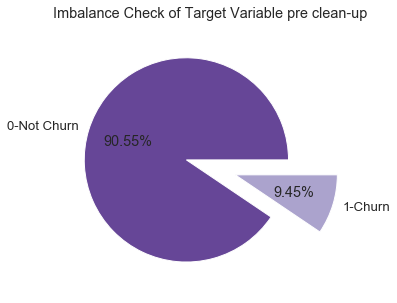

In [44]:
# plot Lead conversion variable Non conversion
plt.figure(figsize=(5,5))
sns.set(font_scale=1.2,palette='PuOr_r')
explode = (0.5,0.0)
labels = '0-Not Churn', '1-Churn'
plt.pie(hvc_df['Churn'].value_counts(),autopct='%1.2f%%',explode=explode,labels=labels)
plt.title("Imbalance Check of Target Variable pre clean-up")
plt.axis('equal')
plt.show()

## Inspect the Null Values in t_df

In [45]:
# Null values in the Application DF. 
# per_col_null is local function which returns the % of null columns which are non zero
per_col_null(hvc_df)


############  Missing Values of Columns in %  ############
night_pck_user_8        46.8251
night_pck_user_6        44.1485
night_pck_user_7        43.1452
std_ic_t2f_mou_8         3.9132
spl_og_mou_8             3.9132
loc_og_t2f_mou_8         3.9132
loc_og_t2c_mou_8         3.9132
loc_og_mou_8             3.9132
std_og_t2t_mou_8         3.9132
std_og_t2m_mou_8         3.9132
std_og_t2f_mou_8         3.9132
std_og_mou_8             3.9132
isd_og_mou_8             3.9132
ic_others_8              3.9132
loc_og_t2t_mou_8         3.9132
isd_ic_mou_8             3.9132
spl_ic_mou_8             3.9132
og_others_8              3.9132
std_ic_mou_8             3.9132
std_ic_t2o_mou_8         3.9132
std_ic_t2m_mou_8         3.9132
std_ic_t2t_mou_8         3.9132
loc_ic_mou_8             3.9132
loc_ic_t2f_mou_8         3.9132
loc_ic_t2m_mou_8         3.9132
loc_ic_t2t_mou_8         3.9132
loc_og_t2m_mou_8         3.9132
std_og_t2c_mou_8         3.9132
offnet_mou_8             3.9132
roam_og_mou_

In [46]:
col_null = round((hvc_df.isnull().sum().sort_values(ascending=False)/len(hvc_df))*100,4)
null_cols_drop = list(col_null[col_null>40].index)

__Observations__
  *  As we can see clearly, 

In [47]:
hvc_df.drop(null_cols_drop,axis=1,inplace=True)

In [48]:
# Null values in the HVC DF. 
# per_col_null is local function which returns the % of null columns which are non zero
per_col_null(hvc_df)


############  Missing Values of Columns in %  ############
std_ic_t2f_mou_8        3.9132
loc_og_t2m_mou_8        3.9132
std_og_t2t_mou_8        3.9132
std_ic_mou_8            3.9132
roam_og_mou_8           3.9132
std_og_t2c_mou_8        3.9132
loc_og_t2t_mou_8        3.9132
std_ic_t2m_mou_8        3.9132
std_og_t2f_mou_8        3.9132
og_others_8             3.9132
loc_og_t2f_mou_8        3.9132
isd_ic_mou_8            3.9132
loc_og_t2c_mou_8        3.9132
std_og_t2m_mou_8        3.9132
std_ic_t2o_mou_8        3.9132
loc_og_mou_8            3.9132
std_ic_t2t_mou_8        3.9132
roam_ic_mou_8           3.9132
offnet_mou_8            3.9132
loc_ic_mou_8            3.9132
loc_ic_t2t_mou_8        3.9132
ic_others_8             3.9132
loc_ic_t2m_mou_8        3.9132
spl_og_mou_8            3.9132
loc_ic_t2f_mou_8        3.9132
spl_ic_mou_8            3.9132
isd_og_mou_8            3.9132
onnet_mou_8             3.9132
std_og_mou_8            3.9132
date_of_last_rech_8     1.9433
std_og_t2c

In [49]:
# drop the rows which have null values
hvc_df.dropna(inplace=True)

In [50]:
# Null values in the HVC DF. 
# per_col_null is local function which returns the % of null columns which are non zero
per_col_null(hvc_df)


############  Missing Values of Columns in %  ############
Series([], dtype: float64)


In [51]:
# Overview of the df
ov_df(hvc_df)

Inspect and Explore the Dataset

#####################  DataFrame Head  ######################
    mobile_number  circle_id  loc_og_t2o_mou  std_og_t2o_mou  loc_ic_t2o_mou  \
7      7000701601        109             0.0             0.0             0.0   
8      7001524846        109             0.0             0.0             0.0   
21     7002124215        109             0.0             0.0             0.0   

   last_date_of_month_6 last_date_of_month_7 last_date_of_month_8    arpu_6  \
7             6/30/2014            7/31/2014            8/31/2014  1069.180   
8             6/30/2014            7/31/2014            8/31/2014   378.721   
21            6/30/2014            7/31/2014            8/31/2014   514.453   

      arpu_7    arpu_8  onnet_mou_6  onnet_mou_7  onnet_mou_8  offnet_mou_6  \
7   1349.850  3171.480        57.84        54.68        52.29        453.43   
8    492.223   137.362       413.69       351.03        35.08         94.66   
21   597.753   637.760       1

In [52]:
# Update the list of numerical and categorical variables for future analysis
h_num_li = list(hvc_df.select_dtypes(include=np.number).columns)
h_cat_li = list(hvc_df.select_dtypes(exclude=np.number).columns)
print(color.BOLD+"\nNumerical Columns -"+color.END,h_num_li)
print(color.BOLD+"\nCategorical Columns -"+color.END,h_cat_li)


Numerical Columns - ['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8

In [53]:
# Inspect the Numerical columns
hvc_df[h_num_li].head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn
7,7000701601,109,0.0,0.0,0.0,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74,1
8,7001524846,109,0.0,0.0,0.0,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.0,0.0,0.0,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,2.0,3.0,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,177.0,69.0,0.00,356.00,0.03,0.0,750.95,11.94,0.0,0.00,19.83,0.00,0.00,0.00,0,1,0,0,1,3,0,0,0,0,0,0,0.0,1.0,1.0,315,21.03,910.65,122.16,0
21,7002124215,109,0.0,0.0,0.0,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.6

In [54]:
# Inspect the Categorical columns
hvc_df[h_cat_li].head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8
7,6/30/2014,7/31/2014,8/31/2014,6/27/2014,7/25/2014,8/26/2014,01/01/2015,01/01/2015,01/01/2015
8,6/30/2014,7/31/2014,8/31/2014,6/25/2014,7/31/2014,8/30/2014,01/01/2015,7/31/2014,8/23/2014
21,6/30/2014,7/31/2014,8/31/2014,6/30/2014,7/31/2014,8/31/2014,01/01/2015,01/01/2015,01/01/2015
23,6/30/2014,7/31/2014,8/31/2014,6/18/2014,7/7/2014,8/24/2014,01/01/2015,7/7/2014,8/6/2014
33,6/30/2014,7/31/2014,8/31/2014,6/30/2014,7/30/2014,8/26/2014,6/30/2014,7/28/2014,8/26/2014


In [55]:
list(h_cat_li)

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8']

### Transformations of columns with Date

* 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'date_of_last_rech_6', 'date_of_last_rech_7',
 'date_of_last_rech_8' have date with same year but different month and date.
* As there is no variance across 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8' - we can drop these columns after extracting the number of days and recharge day of the month

In [56]:
# Extract the day from the data frame
hvc_df[h_cat_li] = hvc_df[h_cat_li].applymap(lambda x: datetime.strptime(x,"%m/%d/%Y").strftime("%d"))

In [57]:
# converting the categorical column to numerical type
hvc_df[h_cat_li] = col_cast(hvc_df[h_cat_li],int,*h_cat_li)

count    28163.0
mean        30.0
std          0.0
min         30.0
25%         30.0
50%         30.0
75%         30.0
max         30.0
Name: last_date_of_month_6, dtype: float64
count    28163.0
mean        31.0
std          0.0
min         31.0
25%         31.0
50%         31.0
75%         31.0
max         31.0
Name: last_date_of_month_7, dtype: float64
count    28163.0
mean        31.0
std          0.0
min         31.0
25%         31.0
50%         31.0
75%         31.0
max         31.0
Name: last_date_of_month_8, dtype: float64
count    28163.000000
mean        26.656180
std          4.431272
min          1.000000
25%         26.000000
50%         28.000000
75%         30.000000
max         30.000000
Name: date_of_last_rech_6, dtype: float64
count    28163.000000
mean        27.547456
std          4.248509
min          1.000000
25%         26.000000
50%         29.000000
75%         31.000000
max         31.000000
Name: date_of_last_rech_7, dtype: float64
count    28163.000000
mean 

In [58]:
# derive no of days after which reacharge is performed.
hvc_df["date_of_last_rech_6"] = hvc_df["last_date_of_month_6"] - hvc_df["date_of_last_rech_6"]
hvc_df["date_of_last_rech_7"] = hvc_df["last_date_of_month_7"] - hvc_df["date_of_last_rech_7"]
hvc_df["date_of_last_rech_8"] = hvc_df["last_date_of_month_8"] - hvc_df["date_of_last_rech_8"]

In [59]:
# derive the columns where there is no much variance
cols2drop = [col for col in hvc_df.columns if len(hvc_df[col].unique()) == 1]
cols2drop

['circle_id',
 'loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_ic_t2o_mou_6',
 'std_ic_t2o_mou_7',
 'std_ic_t2o_mou_8']

In [60]:
# drop the columns which do not have any variance
hvc_df.drop(cols2drop,axis=1,inplace=True)

In [61]:
# store the mobile number into different df
m_no_df = hvc_df.pop("mobile_number")

In [62]:
# Inspect the data frame
print(m_no_df.head())
ov_df(hvc_df)

7     7000701601
8     7001524846
21    7002124215
23    7000887461
33    7000149764
Name: mobile_number, dtype: int64
Inspect and Explore the Dataset

#####################  DataFrame Head  ######################
      arpu_6    arpu_7    arpu_8  onnet_mou_6  onnet_mou_7  onnet_mou_8  \
7   1069.180  1349.850  3171.480        57.84        54.68        52.29   
8    378.721   492.223   137.362       413.69       351.03        35.08   
21   514.453   597.753   637.760       102.41       132.11        85.14   

    offnet_mou_6  offnet_mou_7  offnet_mou_8  roam_ic_mou_6  roam_ic_mou_7  \
7         453.43        567.16        325.91          16.23          33.49   
8          94.66         80.63        136.48           0.00           0.00   
21        757.93        896.68        983.39           0.00           0.00   

    roam_ic_mou_8  roam_og_mou_6  roam_og_mou_7  roam_og_mou_8  \
7           31.64          23.74          12.59          38.06   
8            0.00           0.00        

In [63]:
hvc_df = col_cast(hvc_df,"object",*['monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'Churn'])
hvc_df.head()

count     28163
unique        5
top           0
freq      23736
Name: monthly_2g_6, dtype: int64
count     28163
unique        6
top           0
freq      23552
Name: monthly_2g_7, dtype: int64
count     28163
unique        6
top           0
freq      24099
Name: monthly_2g_8, dtype: int64
count     28163
unique        2
top           0
freq      26311
Name: Churn, dtype: int64


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,3,6,5,0,0,779,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,5,0,1,50,0,10,1,31,23,0.0,2.0,3.0,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,177.0,69.0,0.00,356.00,0.03,0.0,750.95,11.94,0.0,0.00,19.83,0.00,0.00,0.00,0,1,0,0,1,3,0,0,0,0,0,0,0.0,1.0,1.0,315,21.03,910.65,122.16,0
21,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79

In [64]:
# Update the list of numerical and categorical variables for future analysis
h_num_li = list(hvc_df.select_dtypes(include=np.number).columns)
h_cat_li = list(hvc_df.select_dtypes(exclude=np.number).columns)
print(color.BOLD+"\nNumerical Columns -"+color.END,h_num_li)
print(color.BOLD+"\nCategorical Columns -"+color.END,h_cat_li)


Numerical Columns - ['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'l

In [65]:
# Inspect the Numerical columns
display(hvc_df.shape)
hvc_df[h_num_li].head(20)

(28163, 155)

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.00,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.00,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,3,6,5,0,0,779,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.00,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.00,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,5,0,1,50,0,10,1,31,23,0.0,2.0,3.0,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,177.0,69.0,0.00,356.00,0.03,0.00,750.95,11.94,0.00,0.00,19.83,0.00,0.00,0.00,0,1,3,0,0,0,0,0,0,0.0,1.0,1.0,315,21.03,910.65,122.16
21,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.00,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,0.00,763.29,93

## Outlier detection in Numerical Variables

In [66]:
# Create a list with quantiles
q_li = [0.01,0.05,0.25,0.75,0.95,0.99,0.995,0.999,0.9995]

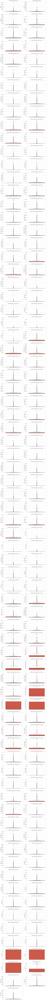

In [67]:
# m_box_plt is local function which takes a df, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# Part-1
m_box_plt(hvc_df,80,2,*list(h_num_li[0:155]))

In [68]:
# Inspect the columns more in detail for outliers
hvc_df[h_num_li].describe(q_li)

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
count,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,28163.000000,2816

In [69]:
# dorp the rows beyond 99.995 percentile
hvc_df = hvc_df[(hvc_df.arpu_6 < 3774) & (hvc_df.arpu_7 < 4122) & (hvc_df.arpu_8 < 3926) & (hvc_df.onnet_mou_6 < 4151) & (hvc_df.offnet_mou_6 < 4173) & (hvc_df.offnet_mou_7 < 4569) & (hvc_df.offnet_mou_8 < 4433) & (hvc_df.onnet_mou_7 < 4350) & (hvc_df.onnet_mou_8 < 4240) & (hvc_df.roam_ic_mou_6 < 920) & (hvc_df.roam_ic_mou_7 < 1016) & (hvc_df.roam_ic_mou_8 < 930) & (hvc_df.roam_og_mou_6 < 1457) & (hvc_df.roam_og_mou_7 < 1257) & (hvc_df.roam_og_mou_8 < 1380) & (hvc_df.loc_og_t2t_mou_6 < 3021) & (hvc_df.loc_og_t2t_mou_7 < 3143 ) & (hvc_df.loc_og_t2t_mou_8 < 2841 ) & (hvc_df.loc_og_t2m_mou_6 < 2570 ) & (hvc_df.loc_og_t2m_mou_7 < 2185 ) & (hvc_df.loc_og_t2m_mou_8 < 2415 )  & (hvc_df.loc_og_t2f_mou_6 < 353) & ( hvc_df.loc_og_t2f_mou_7 < 317) & ( hvc_df.loc_og_t2f_mou_8 < 286 ) & ( hvc_df.loc_og_t2c_mou_6 < 103) & ( hvc_df.loc_og_t2c_mou_7 < 120) & ( hvc_df.loc_og_t2c_mou_8 < 125) & ( hvc_df.loc_og_mou_6 < 3527) & ( hvc_df.loc_og_mou_7 < 3600) & ( hvc_df.loc_og_mou_8 < 3344 ) & (hvc_df.jun_vbc_3g < 4920) & (hvc_df.jul_vbc_3g < 5140) & (hvc_df.aug_vbc_3g < 4740) & (hvc_df.total_rech_num_6 < 89 ) & ( hvc_df.total_rech_num_7 < 85  ) & ( hvc_df.total_rech_num_8 < 82 ) & ( hvc_df.total_rech_amt_6 < 3867 ) & ( hvc_df.total_rech_amt_7 < 3867 ) & ( hvc_df.total_rech_amt_8 < 4020 ) & ( hvc_df.max_rech_amt_6 < 2001  ) & ( hvc_df.max_rech_amt_7 < 2101 ) & ( hvc_df.max_rech_amt_8 < 2101 )]

In [70]:
ov_df(hvc_df)

Inspect and Explore the Dataset

#####################  DataFrame Head  ######################
      arpu_6    arpu_7    arpu_8  onnet_mou_6  onnet_mou_7  onnet_mou_8  \
7   1069.180  1349.850  3171.480        57.84        54.68        52.29   
8    378.721   492.223   137.362       413.69       351.03        35.08   
21   514.453   597.753   637.760       102.41       132.11        85.14   

    offnet_mou_6  offnet_mou_7  offnet_mou_8  roam_ic_mou_6  roam_ic_mou_7  \
7         453.43        567.16        325.91          16.23          33.49   
8          94.66         80.63        136.48           0.00           0.00   
21        757.93        896.68        983.39           0.00           0.00   

    roam_ic_mou_8  roam_og_mou_6  roam_og_mou_7  roam_og_mou_8  \
7           31.64          23.74          12.59          38.06   
8            0.00           0.00           0.00           0.00   
21           0.00           0.00           0.00           0.00   

    loc_og_t2t_mou_6  loc_

__Observations__
  * As we observe, across all the columns there is sharp rise more than a standard deviation after 99.5th percentile. Hence I tried to drop all the rows beyond 99.5th percentile

### Inspecting the data pre-clean up


#### % of Churn Rate

In [71]:
# % Churn rate
100*(sum(hvc_df['Churn'] == 1)/len(hvc_df['Churn']))

6.471929634053643

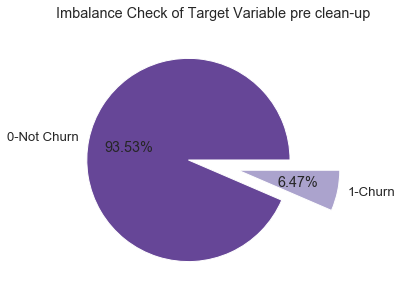

In [72]:
# plot Lead conversion variable Non conversion
plt.figure(figsize=(5,5))
sns.set(font_scale=1.2,palette='PuOr_r')
explode = (0.5,0.0)
labels = '0-Not Churn', '1-Churn'
plt.pie(hvc_df['Churn'].value_counts(),autopct='%1.2f%%',explode=explode,labels=labels)
plt.title("Imbalance Check of Target Variable pre clean-up")
plt.axis('equal')
plt.show()

## Univariate analysis

### Univariate Analysis of Categorical Variables

In [73]:
# Inspect list of categorical variables
print(h_cat_li) 

['monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'Churn']


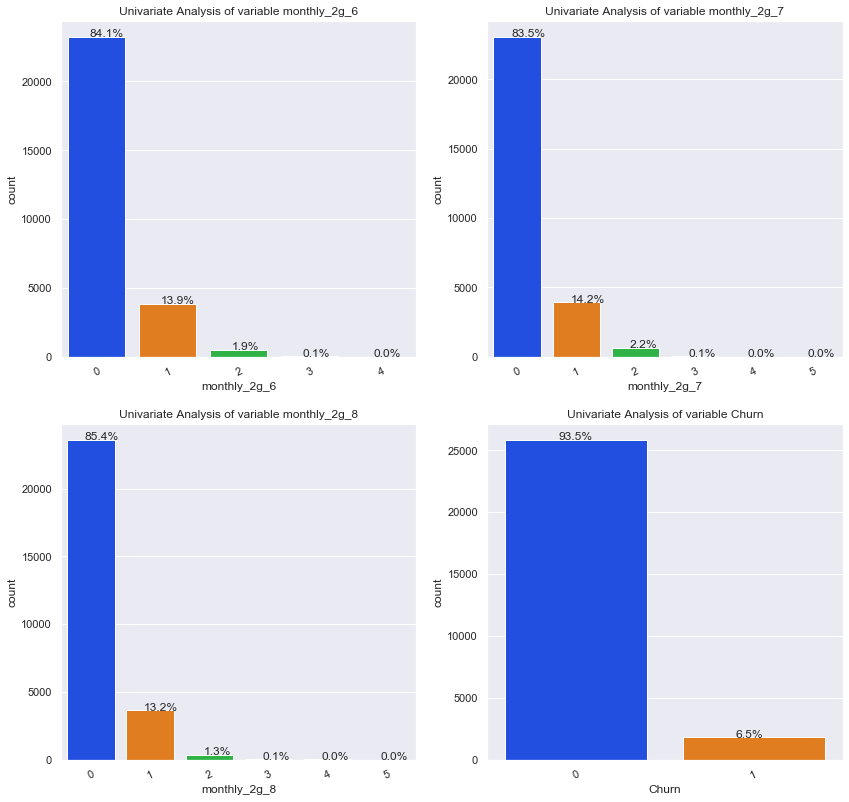

In [74]:
# cnt_plt is local function which takes a df, rows, columns of subplot and name of columns as an argument and 
# plots frequency  plots
# Part-1
cnt_plt(hvc_df,3,2,*h_cat_li[0:6])

__Inferences__
1. Majority of the houses are 1-STORY 1946 & NEWER ALL STYLES. 
2. 80% of the houses are in Residential Low Density
3. 99% of the houses can be accessed by Pavement. Hence this is not very important feature and this would be dropped.
4. Very few houses are accessed by Alley and need to check the correlation before dropping this feature.
5. 65% of the houses have regular shaping while 34% have irregular shaping
6. 91% of the flats are built with flat surface and very few have irregular surface.

## Bivariate analysis

### Correlation of the numerical variables

In [75]:
# create a df with correlation matrix
hvs_df_corr = round(hvc_df.drop("Churn",axis=1).corr(),2)
hvs_df_corr

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
arpu_6,1.00,0.63,0.54,0.42,0.27,0.24,0.58,0.39,0.35,0.12,0.09,0.11,0.18,0.13,0.13,0.23,0.18,0.17,0.43,0.33,0.30,0.19,0.16,0.15,0.06,-0.00,0.01,0.43,0.34,0.31,0.33,0.20,0.17,0.37,0.23,0.19,0.09,0.07,0.06,0.47,0.28,0.24,0.17,0.12,0.11,0.13,0.05,0.05,0.06,0.01,-0.00,0.66,0.44,0.37,0.10,0.08,0.08,0.25,0.20,0.17,0.07,0.05,0.05,0.24,0.19,0.17,0.10,0.08,0.07,0.12,0.09,0.08,0.04,0.04,0.03,0.15,0.11,0.11,0.27,0.22,0.20,0.04,-0.04,-0.01,0.05,0.04,0.04,0.02,0.01,0.01,0.38,0.14,0.13,0.94,0.60,0.52,0.32,0.24,0.26,-0.21,-0.06,-0.09,0.25,0.19,0.19,-0.13,-0.23,-0.14,-0.14,-0.22,-0.16,0.08,-0.02,0.03,-0.20,-0.26,-0.21,0.11,0.03,0.04,0.11,-0.04,0.02,-0.08,-0.12,-0.10,0.16,0.07,0.08,0.28,0.15,0.16,0.25,0.12,0.14,-0.20,-0.24,-0.20,0.21,0.11,0.13,0.00,-0.04,-0.02,-0.14,-0.22,-0.17,0.06,0.05,0.06,0.12
arpu_7,0.63,1.00,0.69,0.28,0.42,0.35,0.41,0.57,0.46,0.11,0.11,0.11,0.14,0.16,0.15,0.16,0.23,0.20,0.29,0.40,0.33,0.15,0.18,0.16,0.01,0.05,0.03,0.30,0.41,0.35,0.22,0.33,0.28,0.26,0.38,0.30,0.07,0.09,0.08,0.32,0.48,0.38,0.12,0.17,0.12,0.05,0.11,0.07,0.02,0.02,0.00,0.45,0.66,0.52,0.07,0.10,0.09,0.16,0.22,0.19,0.04,0.06,0.05,0.15,0.21,0.19,0.08,0.10,0.11,0.09,0.12,0.11,0.04,0.05,0.04,0.12,0.15,0.15,0.18,0.25,0.23,0.01,-0.02,-0.01,0.03,0.04,0.04,0.01,0.02,0.02,0.18,0.34,0.23,0.62,0.94,0.67,0.24,0.33,0.32,-0.15,-0.21,-0.12,0.22,0.27,0.23,-0.22,-0.14,-0.12,-0.21,-0.14,-0.14,-0.03,0.08,0.05,-0.26,-0.22,-0.20,0.03,0.12,0.07,-0.04,0.10,0.05,-0.12,-0.08,-0.08,0.07,0.16,0.12,0.14,0.28,0.19,0.11,0.25,0.17,-0.24,-0.21,-0.19,0.11,0.22,0.16,-0.03,0.01,-0.00,-0.23,-0.16,-0.15,0.05,0.07,0.09,0.05
arpu_8,0.54,0.69,1.00,0.20,0.29,0.44,0.31,0.41,0.60,0.10,0.08,0.11,0.14,0.12,0.18,0.14,0.19,0.26,0.28,0.35,0.46,0.16,0.18,0.21,0.00,0.01,0.07,0.28,0.35,0.47,0.13,0.22,0.34,0.15,0.24,0.38,0.07,0.08,0

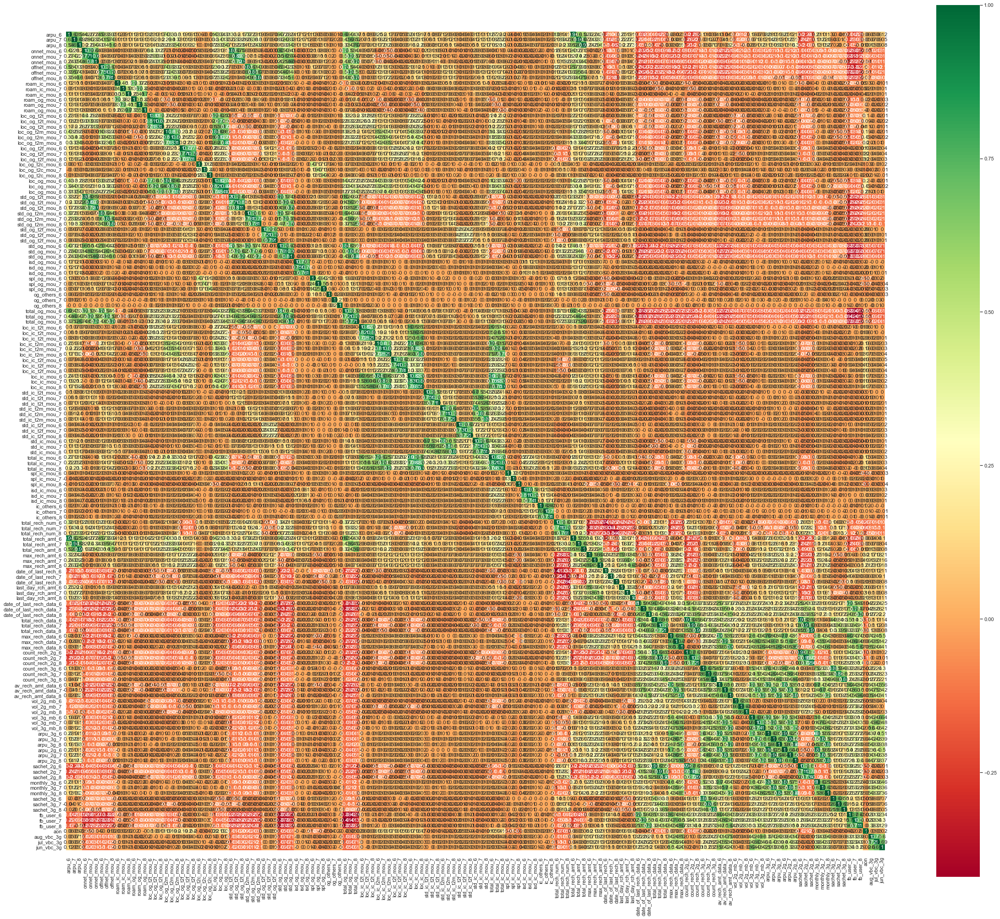

In [322]:
# Plot the heatmap
plt.figure(figsize=(40,35))
ax = sns.heatmap(round(hvs_df_corr,2),cmap="RdYlGn", annot=True,square=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

In [76]:
corr = list()
corrmat = round(hvc_df[h_num_li].corr(),2)
corrmat = corrmat[((corrmat>=0.75) & (corrmat<1)) |(corrmat<=-0.75)]
for col in corrmat:
    temp = list()
    pos_corr = corrmat[col].argmax()
    neg_corr = corrmat[col].argmin()
    if (pd.isna(pos_corr)==False):
        if (pos_corr == neg_corr):
            temp.append(col)
            temp.append(pos_corr)
            corr.append(temp)
        elif (pos_corr != neg_corr):
            temp.append(col)
            temp.append(pos_corr)
            temp.append(neg_corr)
            corr.append(temp)
corr_df = pd.DataFrame()
col=[]
corrltd_col=[]
for each in corr:
    #print(each)
    t1 = each.pop(0)
    corrltd_col.append(each)
    col.append(t1)
    #corrltd_col.append(each)
corr_df['col'] = col
corr_df['correlated_col'] = corrltd_col
corr_df.head(10)

,col,correlated_col
0,arpu_6,[total_rech_amt_6]
1,arpu_7,[total_rech_amt_7]
2,arpu_8,[total_rech_amt_8]
3,onnet_mou_6,"[std_og_t2t_mou_6, onnet_mou_7]"
4,onnet_mou_7,"[std_og_t2t_mou_7, onnet_mou_6]"
5,onnet_mou_8,"[std_og_t2t_mou_8, onnet_mou_7]"
6,offnet_mou_6,"[std_og_t2m_mou_6, offnet_mou_7]"
7,offnet_mou_7,"[std_og_t2m_mou_7, offnet_mou_6]"
8,offnet_mou_8,"[std_og_t2m_mou_8, total_og_mou_8]"
9,loc_og_t2t_mou_6,[loc_og_t2t_mou_7]


In [77]:
from collections import Counter
tem = []
for each in corr_df['correlated_col']:
    for val in each:
        tem.append(val)
Counter(tem).most_common(50)

[('loc_ic_mou_8', 4),
 ('av_rech_amt_data_8', 4),
 ('onnet_mou_7', 3),
 ('total_og_mou_8', 3),
 ('loc_og_t2m_mou_7', 3),
 ('std_og_mou_6', 3),
 ('std_og_mou_7', 3),
 ('std_og_mou_8', 3),
 ('total_ic_mou_6', 3),
 ('std_ic_mou_7', 3),
 ('av_rech_amt_data_6', 3),
 ('av_rech_amt_data_7', 3),
 ('arpu_2g_6', 3),
 ('arpu_3g_6', 3),
 ('arpu_2g_7', 3),
 ('arpu_2g_8', 3),
 ('arpu_3g_7', 3),
 ('std_og_t2t_mou_6', 2),
 ('std_og_t2t_mou_7', 2),
 ('onnet_mou_6', 2),
 ('offnet_mou_7', 2),
 ('offnet_mou_6', 2),
 ('std_og_t2m_mou_8', 2),
 ('loc_og_t2t_mou_7', 2),
 ('loc_og_t2m_mou_8', 2),
 ('loc_og_t2m_mou_6', 2),
 ('loc_og_mou_8', 2),
 ('loc_og_t2f_mou_7', 2),
 ('loc_og_mou_7', 2),
 ('offnet_mou_8', 2),
 ('isd_og_mou_7', 2),
 ('loc_ic_t2t_mou_7', 2),
 ('loc_ic_mou_6', 2),
 ('loc_ic_mou_7', 2),
 ('loc_ic_t2m_mou_6', 2),
 ('total_ic_mou_8', 2),
 ('total_ic_mou_7', 2),
 ('std_ic_mou_6', 2),
 ('count_rech_2g_6', 2),
 ('count_rech_2g_7', 2),
 ('sachet_2g_7', 2),
 ('count_rech_2g_8', 2),
 ('total_rech_data_

In [78]:
'''for each in hvc_df[h_num_li].columns:
    print("Correlation for Column - ", each)
    corrmat = round(hvc_df[h_num_li].corr(),1)
    k = 5
    cols = corrmat.nlargest(k, each)[each].index 
    cm = np.corrcoef(hvc_df[h_num_li][cols].values.T) 
    f, ax = plt.subplots(figsize =(3, 3)) 
    sns.heatmap(cm, ax = ax, cmap ="coolwarm", linewidths = 0.1, annot=True, square=True, yticklabels = cols.values,  xticklabels = cols.values)
    plt.show()
    corrmat = round(hvc_df[h_num_li].corr(),1)
    k = 5 
    cols = corrmat.nsmallest(k, each)[each].index 
    cm = np.corrcoef(hvc_df[h_num_li][cols].values.T)
    f, ax = plt.subplots(figsize =(3,3)) 
    sns.heatmap(cm, ax = ax, cmap ="coolwarm", linewidths = 0.1, annot=True, square=True, yticklabels = cols.values, xticklabels = cols.values)
    plt.show()
    
    print("*"*50)'''

'for each in hvc_df[h_num_li].columns:\n    print("Correlation for Column - ", each)\n    corrmat = round(hvc_df[h_num_li].corr(),1)\n    k = 5\n    cols = corrmat.nlargest(k, each)[each].index \n    cm = np.corrcoef(hvc_df[h_num_li][cols].values.T) \n    f, ax = plt.subplots(figsize =(3, 3)) \n    sns.heatmap(cm, ax = ax, cmap ="coolwarm", linewidths = 0.1, annot=True, square=True, yticklabels = cols.values,  xticklabels = cols.values)\n    plt.show()\n    corrmat = round(hvc_df[h_num_li].corr(),1)\n    k = 5 \n    cols = corrmat.nsmallest(k, each)[each].index \n    cm = np.corrcoef(hvc_df[h_num_li][cols].values.T)\n    f, ax = plt.subplots(figsize =(3,3)) \n    sns.heatmap(cm, ax = ax, cmap ="coolwarm", linewidths = 0.1, annot=True, square=True, yticklabels = cols.values, xticklabels = cols.values)\n    plt.show()\n    \n    print("*"*50)'

In [79]:
# The most positively and negatively corelated features with the below columns 
# * arpu_6 are (total_rech_amt_6) and (count_rech_2g_7,sachet_2g_7) respectively.
# 

### Correlation of the categorical variables with respect to Target variable "Churn"

#### Create a features list with Voice Usage, Data Usage, Voice Revenue and Data Revenue

In [80]:
len(hvc_df.columns)

155

In [81]:
# derive list of features related to voice usage
pattern = (r'loc|std|ic|og|mou')
voice_usg = list(filter(lambda x : re.search(pattern,x) , list(hvc_df.columns)))
print(voice_usg)
print("Length of Voice Usage Features",len(voice_usg))

['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_m

In [82]:
# derive list of features related to data usage
pattern = (r'vol|vbc|fb_user|monthly|sachet')
data_usg = list(filter(lambda x : re.search(pattern,x) , list(hvc_df.columns)))
print(data_usg)
print("Length of Data Usage Features",len(data_usg))

['vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g']
Length of Data Usage Features 24


In [83]:
# derive list of features related to voice revenue
pattern = (r'rech_amt_(6|7|8)|arpu_(6|7|8)|rech_num|rch_amt|last_rech')
voice_rev = list(filter(lambda x : re.search(pattern,x) , list(hvc_df.columns)))
print(voice_rev)
print("Length of Data Usage Features",len(voice_rev))

['arpu_6', 'arpu_7', 'arpu_8', 'total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8']
Length of Data Usage Features 21


In [84]:
# derive list of features related to data revenue
pattern = (r'rech_amt_data|rech_data|arpu_(2g|3g)|count_rech')
data_rev = list(filter(lambda x : re.search(pattern,x) , list(hvc_df.columns)))
print(data_rev)
print("Length of Data Usage Features",len(data_rev))

['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8']
Length of Data Usage Features 24


In [85]:
# Misc features
misc_fea = list(set(hvc_df.columns).difference(set(voice_usg).union(set(data_usg).union(set(voice_rev).union(set(data_rev))))))
print(misc_fea)
print("Length of Data Usage Features",len(misc_fea))

['aon', 'Churn']
Length of Data Usage Features 2


In [86]:
#  Function to plot 2 or more box plots
def comp_box_plt(l_df,n_r,n_c,l_dep,*args):
    j=1
    rot = 0
    if n_c == 1 and n_r == 1:
        rot = 90
    fig_h = n_r * 5
    plt.figure(1,figsize=(20,fig_h))
    # set palette 
    palette = itertools.cycle(sns.color_palette())
    sns.set(style="whitegrid",font_scale=1,palette='Set2')

    for i in args:
        plt.subplot(n_r,n_c,j)
        sns.boxplot(x=l_dep,y=i,orient="v",data=l_df,hue=l_dep)
        plt.title('{} spread across {}'.format(l_dep,i),fontsize=12)
        j+=1
    plt.show()

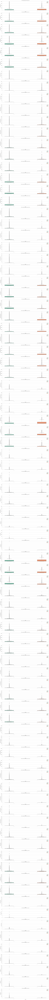

In [87]:
# comp_box_plt is local function which takes a df,target column, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# correlation of price with other categorical variables
# Part-I
comp_box_plt(hvc_df,88,1,"Churn",*voice_usg)

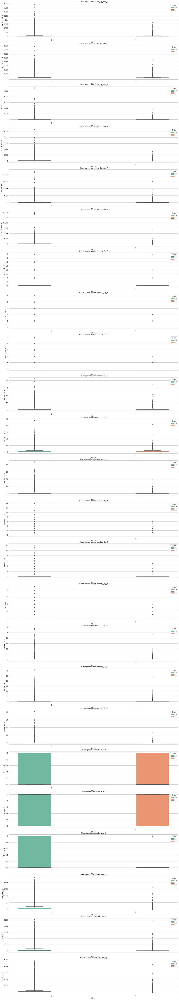

In [88]:
# comp_box_plt is local function which takes a df,target column, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# correlation of price with other categorical variables
# Part-I
comp_box_plt(hvc_df,25,1,"Churn",*data_usg)

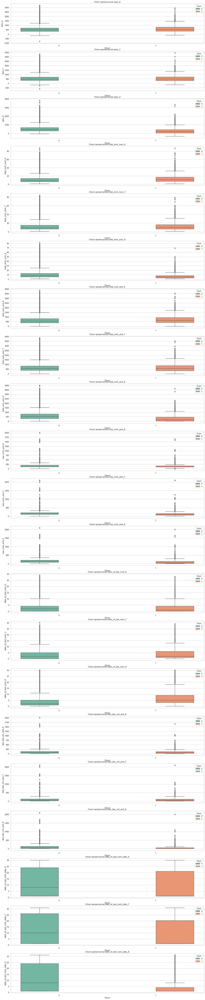

In [89]:
# comp_box_plt is local function which takes a df,target column, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# correlation of price with other categorical variables
# Part-III
comp_box_plt(hvc_df,22,1,"Churn",*voice_rev)

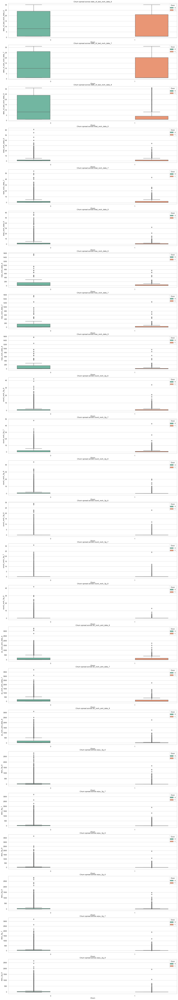

In [90]:
# comp_box_plt is local function which takes a df,target column, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# correlation of price with other categorical variables
# Part-IV
comp_box_plt(hvc_df,25,1,"Churn",*data_rev)

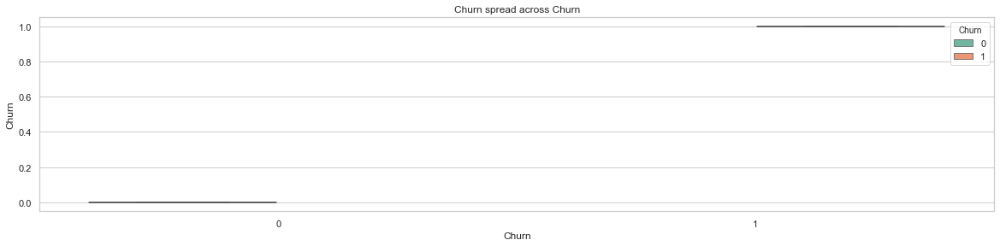

In [91]:
# comp_box_plt is local function which takes a df,target column, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# correlation of price with other categorical variables
# Part-V
comp_box_plt(hvc_df,88,1,"Churn",misc_fea[1])

# Preparing the data for modelling(encoding,train-test split, rescaling etc)

## Split the target variable from the data

In [92]:
# Split the target variable
X = hvc_df.drop("Churn",axis=1)
y = hvc_df.Churn

y=y.astype('int')

# Check the shape of X and y
display(X.shape)
display(y.shape)

(27627, 154)

(27627,)

## Splitting the data into train and test

In [93]:
MX_train,MX_test, my_train, my_test = train_test_split(X,y,random_state=rndm_stat,test_size=0.3)

## Handling Imbalance

In [94]:
# % Churn rate before imbalance
100*(my_train.value_counts()/my_train.shape[0])

0    93.732547
1     6.267453
Name: Churn, dtype: float64

In [95]:
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN

# define oversample strategy
#smot = SMOTE(random_state=rndm_stat,n_jobs=4,sampling_strategy=1)
smot = SMOTEENN(random_state=rndm_stat,n_jobs=4,sampling_strategy=0.7)

# fit and apply the transform
MX_train_sm, my_train_sm = smot.fit_resample(MX_train, my_train)

In [96]:
# % Churn rate after imbalance
100*(my_train_sm.value_counts()/my_train_sm.shape[0])

0    52.380952
1    47.619048
Name: Churn, dtype: float64

In [97]:
# explore the shape of Target and independent variables after imbalance
display(MX_train_sm.shape)
display(my_train_sm.shape)

(26355, 154)

(26355,)

## Rescaling of the variables

__Rescaling the Features__

As we know, scaling doesn't impact your model. So it is extremely important to rescale the variables so that they have a comparable scale. If we don't have comparable scales, then some of the coefficients as obtained by fitting the regression model might be very large or very small as compared to the other coefficients. This might become very annoying at the time of model evaluation. So it is advised to use standardization or normalization so that the units of the coefficients obtained are all on the same scale. As you know, there are two common ways of rescaling:

1. Min-Max scaling 
2. Standardisation (mean-0, sigma-1) 

__Approach__

My approach is to have 3 different models and see how the results vary and choose the best model. So I decide to use Standardization with 2 models and MinMaxScaler for other model.

1. M1 - Will have scaling using Standardisation
2. M2 - Will have scaling using MinMaxScaler
3. M3 - Will have scaling using Standardisation

In [98]:
print(MX_train.shape)
print(my_train.shape)
print(MX_train_sm.shape)
print(my_train_sm.shape)
print(MX_test.shape)
print(my_test.shape)

(19338, 154)
(19338,)
(26355, 154)
(26355,)
(8289, 154)
(8289,)


In [99]:
# 2 Models are created and hence 2 copies of df_train and test to perform the analysis
MX1_train = MX_train_sm.copy()
MX2_train = MX_train_sm.copy()
MX3_train = MX_train_sm.copy()

my1_train = my_train_sm.copy()
my2_train = my_train_sm.copy()
my3_train = my_train_sm.copy()

MX1_test = MX_test.copy()
MX2_test = MX_test.copy()
MX3_test = MX_test.copy()

my1_test = my_test.copy()
my2_test = my_test.copy()
my3_test = my_test.copy()


# Some models dont need scaling and hence copy into df
X_train = MX_train_sm.copy()
y_train = my_train_sm.copy()

X_test = MX_test.copy()
y_test = my_test.copy()

In [100]:
# Combining the X_sm and y_sm to make a Balanced dataframe
Balanced_df = X_train.copy()
print(Balanced_df.shape)
Balanced_df['Churn'] = y_train
print(Balanced_df.shape)
Balanced_df.head()

(26355, 154)
(26355, 155)


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn
0,532.210,474.402,486.904,161.74,145.24,214.69,417.24,392.43,347.46,19.81,0.0,0.0,33.51,0.0,0.0,147.13,145.24,214.69,393.33,389.26,347.16,4.84,3.16,0.30,0.00,0.0,0.00,545.31,537.68,562.16,0.16,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.16,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,545.48,537.68,562.16,384.18,298.36,329.06,317.13,295.79,426.21,61.18,0.00,2.51,762.49,594.16,757.79,0.13,0.0,0.0,0.40,0.00,4.61,0.00,0.00,0.00,0.53,0.00,4.61,763.03,594.16,762.41,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,6,5,3,490,480,630,250,250,250,2,3,9,120,110,250,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2151,0.00,0.00,0.00,0
1,315.617,406.634,361.981,43.64,31.16,49.56,141.41,152.21,258.89,0.00,0.0,0.0,0.00,0.0,0.0,40.08,31.16,49.56,133.76,148.79,247.54,7.64,3.41,11.34,0.00,0.0,0.00,181.49,183.38,308.46,3.56,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,3.56,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,185.06,183.38,308.46,81.79,53.56,70.29,187.53,196.61,316.94,10.44,6.54,17.98,279.78,256.73,405.23,5.76,0.0,0.4,0.00,0.00,2.46,0.00,0.00,0.00,5.76,0.00,2.86,291.71,256.78,408.09,0.00,0.0,0.0,6.16,0.00,0.00,0.00,0.05,0.0,5,3,2,554,404,250,250,250,250,13,15,18,250,250,250,17,16,13,1.0,1.0,1.0,154.0,154.0,154.0,1.0,1.0,1.0,0.0,0.0,0.0,154.0,154.0,154.0,64.40,55.79,50.83,251.30,201.45,190.21,8.47,50.67,0.28,10.90,34.1,0.00,1,1,1,0,0,0,0,0,0,0,0,0,1.0,1.0,1.0,1519,216.24,251.75,289.60,0
2,582.958,553.462,921.201,99.78,187.13,103.24,667.43,394.83,416.46,0.00,0.0,0.0,0.00,0.0,0.0,99.78,187.13,103.24,448.14,269.98,165.26,31.69,35.14,117.21,1.46,3.4,14.63,579.63,492.26,385.73,0.00,0.0,0.0,60.86,60.46,79.28,0.0,0.0,0.0,

In [101]:
# List of features that need to be scaled
# add other columns to h_num_li which needs to be scaled
scl_li = list(MX_train.columns)
print(scl_li)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'lo

### Scaling of Transform Data LR Model 1 and Model 2 using Standardization

In [102]:
# This can be achieved using sklearn MinMaxScaler
# 1. Initiate an object
m1_scaler = StandardScaler()
m3_scaler = StandardScaler()

# 2. Fit and transform on data
MX1_train[scl_li] = m1_scaler.fit_transform(MX1_train[scl_li])
MX3_train[scl_li] = m3_scaler.fit_transform(MX2_train[scl_li])

display(MX1_train.head())
display(MX3_train.head())

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,-0.073150,-0.211924,0.193527,-0.293456,-0.302605,0.057413,0.042783,0.009882,0.194375,0.081600,-0.261095,-0.287548,0.066586,-0.295154,-0.309764,0.488618,0.449755,1.059281,1.183289,1.213796,1.177909,-0.008598,-0.113096,-0.291967,-0.329552,-0.306729,-0.294818,1.083831,1.062816,1.346702,-0.498465,-0.479103,-0.378166,-0.516872,-0.491096,-0.406435,-0.147547,-0.134282,-0.134001,-0.692600,-0.664987,-0.519019,-0.093542,-0.079741,-0.069354,-0.390115,-0.390116,-0.319342,-0.359417,-0.018286,-0.010392,-0.181435,-0.159386,0.211049,2.195713,1.606096,1.996331,0.923038,0.794862,1.607539,1.215151,-0.313138,-0.239148,1.944369,1.333359,2.093860,-0.187210,-0.185779,-0.175232,-0.315675,-0.291206,-0.184919,-0.135837,-0.140068,-0.117005,-0.345848,-0.334321,-0.244332,1.504019,0.958637,1.651339,-0.339059,-0.111501,-0.214738,-0.160771,-0.163174,-0.152525,-0.085995,-0.087249,-0.082559,-0.767107,-0.823945,-0.709503,-0.421027,-0.388092,0.361161,0.761613,0.717475,0.835683,-0.231189,-0.108703,0.683983,0.274309,0.206483,1.568470,-0.902749,-0.906400,-0.765716,-0.584977,-0.596848,-0.490239,-0.670358,-0.662420,-0.580907,-0.501835,-0.515035,-0.442921,-0.356623,-0.357578,-0.288712,-0.654035,-0.658225,-0.553752,-0.382485,-0.362725,-0.298493,-0.378215,-0.399365,-0.363493,-0.361251,-0.368010,-0.325648,-0.390454,-0.392139,-0.338206,-0.370933,-0.374629,-0.330222,-0.417121,-0.432031,-0.364908,-0.286785,-0.288914,-0.27561,-0.201160,-0.209259,-0.156528,-0.958757,-0.969743,-0.820136,1.146869,-0.376483,-0.386130,-0.374132
1,-0.720632,-0.413635,-0.152294,-0.551371,-0.556118,-0.389512,-0.539746,-0.490244,-0.035525,-0.259342,-0.261095,-0.287548,-0.286363,-0.295154,-0.309764,-0.176632,-0.221394,-0.045301,-0.047010,0.035429,0.668580,0.172309,-0.096570,0.505428

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,-0.073150,-0.211924,0.193527,-0.293456,-0.302605,0.057413,0.042783,0.009882,0.194375,0.081600,-0.261095,-0.287548,0.066586,-0.295154,-0.309764,0.488618,0.449755,1.059281,1.183289,1.213796,1.177909,-0.008598,-0.113096,-0.291967,-0.329552,-0.306729,-0.294818,1.083831,1.062816,1.346702,-0.498465,-0.479103,-0.378166,-0.516872,-0.491096,-0.406435,-0.147547,-0.134282,-0.134001,-0.692600,-0.664987,-0.519019,-0.093542,-0.079741,-0.069354,-0.390115,-0.390116,-0.319342,-0.359417,-0.018286,-0.010392,-0.181435,-0.159386,0.211049,2.195713,1.606096,1.996331,0.923038,0.794862,1.607539,1.215151,-0.313138,-0.239148,1.944369,1.333359,2.093860,-0.187210,-0.185779,-0.175232,-0.315675,-0.291206,-0.184919,-0.135837,-0.140068,-0.117005,-0.345848,-0.334321,-0.244332,1.504019,0.958637,1.651339,-0.339059,-0.111501,-0.214738,-0.160771,-0.163174,-0.152525,-0.085995,-0.087249,-0.082559,-0.767107,-0.823945,-0.709503,-0.421027,-0.388092,0.361161,0.761613,0.717475,0.835683,-0.231189,-0.108703,0.683983,0.274309,0.206483,1.568470,-0.902749,-0.906400,-0.765716,-0.584977,-0.596848,-0.490239,-0.670358,-0.662420,-0.580907,-0.501835,-0.515035,-0.442921,-0.356623,-0.357578,-0.288712,-0.654035,-0.658225,-0.553752,-0.382485,-0.362725,-0.298493,-0.378215,-0.399365,-0.363493,-0.361251,-0.368010,-0.325648,-0.390454,-0.392139,-0.338206,-0.370933,-0.374629,-0.330222,-0.417121,-0.432031,-0.364908,-0.286785,-0.288914,-0.27561,-0.201160,-0.209259,-0.156528,-0.958757,-0.969743,-0.820136,1.146869,-0.376483,-0.386130,-0.374132
1,-0.720632,-0.413635,-0.152294,-0.551371,-0.556118,-0.389512,-0.539746,-0.490244,-0.035525,-0.259342,-0.261095,-0.287548,-0.286363,-0.295154,-0.309764,-0.176632,-0.221394,-0.045301,-0.047010,0.035429,0.668580,0.172309,-0.096570,0.505428

### Scaling of Test Data LR Model 1 and Model 2 using Standardization

In [103]:
# Transform test data
MX1_test[scl_li] = m1_scaler.transform(MX1_test[scl_li])
MX3_test[scl_li] = m3_scaler.transform(MX2_test[scl_li])

display(MX1_test.head())
display(MX3_test.head())

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
48098,5.904353,5.964476,6.264212,-0.597036,-0.551496,-0.461018,1.329360,1.576572,2.084211,-0.259342,-0.261095,-0.287548,-0.286363,-0.295154,-0.309764,-0.288802,-0.354647,-0.296479,-0.151522,0.526436,0.227353,-0.289004,-0.129622,-0.021113,-0.022025,-0.306729,-0.294818,-0.273883,0.148981,-0.000501,-0.497222,-0.420487,-0.344841,-0.417453,-0.396049,-0.351160,-0.147547,-0.134282,-0.134001,-0.624183,-0.559373,-0.460927,61.964848,66.572444,72.594016,-0.022593,0.402781,0.130886,4.024769,-0.018286,-0.010392,0.585007,0.812043,1.157048,-0.033946,-0.140831,-0.098634,-0.192221,0.036975,-0.133263,-0.292600,-0.300928,-0.300744,-0.190613,-0.091631,-0.181511,-0.140336,-0.185779,-0.175232,-0.319293,-0.245787,-0.037711,-0.101937,0.131706,-0.117005,-0.314568,-0.270187,-0.131627,-0.238505,0.306323,0.079926,-0.339059,-0.111501,-0.214738,0.060611,2.618897,1.404794,1.150032,0.422093,1.164113,3.441183,2.970045,4.134945,5.755609,5.498003,6.156578,-0.310426,-0.019017,0.109655,-0.727723,-0.593085,-0.802084,0.178643,0.578261,-0.366192,-0.070255,-0.906400,-0.765716,-0.219744,-0.596848,-0.490239,-0.489159,-0.662420,-0.580907,-0.093533,-0.515035,-0.442921,-0.356623,-0.357578,-0.288712,-0.550181,-0.658225,-0.553752,-0.359519,-0.362725,-0.298493,-0.378215,-0.399365,-0.363493,-0.361251,-0.368010,-0.325648,-0.381269,-0.392139,-0.338206,-0.370933,-0.374629,-0.330222,0.000999,-0.432031,-0.364908,-0.286785,-0.288914,-0.275610,-0.20116,-0.209259,-0.156528,1.107470,-0.969743,-0.820136,0.614325,-0.376483,-0.386130,-0.374132
69125,0.643710,1.346374,2.405359,1.087602,1.022229,5.499173,0.180057,-0.420332,1.148209,-0.259342,-0.261095,-0.287548,-0.286363,-0.295154,-0.309764,4.509323,3.957103,14.080876,1.528107,0.102171,0.939248,-0.321309,0.762800,1.396719,

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
48098,5.904353,5.964476,6.264212,-0.597036,-0.551496,-0.461018,1.329360,1.576572,2.084211,-0.259342,-0.261095,-0.287548,-0.286363,-0.295154,-0.309764,-0.288802,-0.354647,-0.296479,-0.151522,0.526436,0.227353,-0.289004,-0.129622,-0.021113,-0.022025,-0.306729,-0.294818,-0.273883,0.148981,-0.000501,-0.497222,-0.420487,-0.344841,-0.417453,-0.396049,-0.351160,-0.147547,-0.134282,-0.134001,-0.624183,-0.559373,-0.460927,61.964848,66.572444,72.594016,-0.022593,0.402781,0.130886,4.024769,-0.018286,-0.010392,0.585007,0.812043,1.157048,-0.033946,-0.140831,-0.098634,-0.192221,0.036975,-0.133263,-0.292600,-0.300928,-0.300744,-0.190613,-0.091631,-0.181511,-0.140336,-0.185779,-0.175232,-0.319293,-0.245787,-0.037711,-0.101937,0.131706,-0.117005,-0.314568,-0.270187,-0.131627,-0.238505,0.306323,0.079926,-0.339059,-0.111501,-0.214738,0.060611,2.618897,1.404794,1.150032,0.422093,1.164113,3.441183,2.970045,4.134945,5.755609,5.498003,6.156578,-0.310426,-0.019017,0.109655,-0.727723,-0.593085,-0.802084,0.178643,0.578261,-0.366192,-0.070255,-0.906400,-0.765716,-0.219744,-0.596848,-0.490239,-0.489159,-0.662420,-0.580907,-0.093533,-0.515035,-0.442921,-0.356623,-0.357578,-0.288712,-0.550181,-0.658225,-0.553752,-0.359519,-0.362725,-0.298493,-0.378215,-0.399365,-0.363493,-0.361251,-0.368010,-0.325648,-0.381269,-0.392139,-0.338206,-0.370933,-0.374629,-0.330222,0.000999,-0.432031,-0.364908,-0.286785,-0.288914,-0.275610,-0.20116,-0.209259,-0.156528,1.107470,-0.969743,-0.820136,0.614325,-0.376483,-0.386130,-0.374132
69125,0.643710,1.346374,2.405359,1.087602,1.022229,5.499173,0.180057,-0.420332,1.148209,-0.259342,-0.261095,-0.287548,-0.286363,-0.295154,-0.309764,4.509323,3.957103,14.080876,1.528107,0.102171,0.939248,-0.321309,0.762800,1.396719,

In [104]:
#  Data for Part II
X1_train = MX1_train.copy()
y1_train = my1_train.copy()

X1_test = MX1_test.copy()
y1_test = my1_test.copy()

# Feature Engineering

## Feature Engineering using PCA

In [105]:
# Inspect the target and independent variables
display(my1_train.value_counts())
display(my1_train.head())
display(MX1_train.head())

0    13805
1    12550
Name: Churn, dtype: int64

0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int32

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,-0.073150,-0.211924,0.193527,-0.293456,-0.302605,0.057413,0.042783,0.009882,0.194375,0.081600,-0.261095,-0.287548,0.066586,-0.295154,-0.309764,0.488618,0.449755,1.059281,1.183289,1.213796,1.177909,-0.008598,-0.113096,-0.291967,-0.329552,-0.306729,-0.294818,1.083831,1.062816,1.346702,-0.498465,-0.479103,-0.378166,-0.516872,-0.491096,-0.406435,-0.147547,-0.134282,-0.134001,-0.692600,-0.664987,-0.519019,-0.093542,-0.079741,-0.069354,-0.390115,-0.390116,-0.319342,-0.359417,-0.018286,-0.010392,-0.181435,-0.159386,0.211049,2.195713,1.606096,1.996331,0.923038,0.794862,1.607539,1.215151,-0.313138,-0.239148,1.944369,1.333359,2.093860,-0.187210,-0.185779,-0.175232,-0.315675,-0.291206,-0.184919,-0.135837,-0.140068,-0.117005,-0.345848,-0.334321,-0.244332,1.504019,0.958637,1.651339,-0.339059,-0.111501,-0.214738,-0.160771,-0.163174,-0.152525,-0.085995,-0.087249,-0.082559,-0.767107,-0.823945,-0.709503,-0.421027,-0.388092,0.361161,0.761613,0.717475,0.835683,-0.231189,-0.108703,0.683983,0.274309,0.206483,1.568470,-0.902749,-0.906400,-0.765716,-0.584977,-0.596848,-0.490239,-0.670358,-0.662420,-0.580907,-0.501835,-0.515035,-0.442921,-0.356623,-0.357578,-0.288712,-0.654035,-0.658225,-0.553752,-0.382485,-0.362725,-0.298493,-0.378215,-0.399365,-0.363493,-0.361251,-0.368010,-0.325648,-0.390454,-0.392139,-0.338206,-0.370933,-0.374629,-0.330222,-0.417121,-0.432031,-0.364908,-0.286785,-0.288914,-0.27561,-0.201160,-0.209259,-0.156528,-0.958757,-0.969743,-0.820136,1.146869,-0.376483,-0.386130,-0.374132
1,-0.720632,-0.413635,-0.152294,-0.551371,-0.556118,-0.389512,-0.539746,-0.490244,-0.035525,-0.259342,-0.261095,-0.287548,-0.286363,-0.295154,-0.309764,-0.176632,-0.221394,-0.045301,-0.047010,0.035429,0.668580,0.172309,-0.096570,0.505428

### Create an instance of PCA and explore the components

In [106]:
# Create an instance of PCA
pca_m1 = PCA(random_state=rndm_stat)

# finding the covariance matrix,  doing an eigendecomposition of it to obtain the eigenvectors which are Principal Components
pca_m1.fit(MX1_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [107]:
# Inspect the principal components created by PCA
print("Print Principal Components",pca_m1.components_.shape)
pca_m1.components_

Print Principal Components (154, 154)


array([[-5.68392436e-02, -4.73719369e-02,  4.12708898e-03, ...,
         1.24751566e-01,  1.24827991e-01,  1.22419983e-01],
       [ 1.40525686e-01,  1.63158207e-01,  1.77586419e-01, ...,
         5.48928294e-02,  4.62610784e-02,  4.35818650e-02],
       [-1.03538897e-01, -1.21615512e-01, -7.77263243e-02, ...,
        -7.15636870e-02, -7.49901156e-02, -7.56036338e-02],
       ...,
       [-3.01760609e-16,  1.13079885e-16,  1.69938337e-16, ...,
         4.83407803e-18,  1.24385129e-16, -1.39110145e-16],
       [-0.00000000e+00,  1.76833714e-16, -3.81650068e-16, ...,
        -1.15325660e-16,  3.64104593e-17,  3.97322757e-18],
       [ 0.00000000e+00, -1.50972209e-16, -3.24837581e-16, ...,
        -1.84915143e-17,  2.62641453e-17, -2.87948074e-17]])

In [108]:
# Explore the variance explained by PC in each direction
print("Variance of each PC in each of its direction\n",pca_m1.explained_variance_ratio_)

# Create a cumulative sum of variance
m1_varcum = np.cumsum(pca_m1.explained_variance_ratio_)

Variance of each PC in each of its direction
 [1.24452908e-01 1.00410530e-01 6.26329984e-02 5.28292752e-02
 3.62071090e-02 3.02181167e-02 2.91056842e-02 2.59755866e-02
 2.21712280e-02 2.18598422e-02 1.99407836e-02 1.86111530e-02
 1.72791015e-02 1.69242934e-02 1.63854766e-02 1.59678538e-02
 1.52495760e-02 1.50495306e-02 1.47329065e-02 1.34788719e-02
 1.30816524e-02 1.20211729e-02 1.11893211e-02 1.05323956e-02
 9.96792916e-03 9.21509386e-03 8.92966250e-03 8.56283854e-03
 8.37507810e-03 7.82772942e-03 7.59051457e-03 6.97921543e-03
 6.91126692e-03 6.43343215e-03 6.18765876e-03 6.12889624e-03
 5.92322518e-03 5.83422317e-03 5.74789124e-03 5.60562940e-03
 5.46867808e-03 5.30871674e-03 5.22052047e-03 5.18615324e-03
 5.01424631e-03 4.89027463e-03 4.80710893e-03 4.60654069e-03
 4.41623933e-03 4.33468763e-03 4.09216506e-03 3.93958328e-03
 3.88995526e-03 3.79970800e-03 3.63557471e-03 3.55752743e-03
 3.48427985e-03 3.25086274e-03 3.15951346e-03 2.90187528e-03
 2.79923216e-03 2.70662251e-03 2.681490

### Explore the variance and select the no of PC's

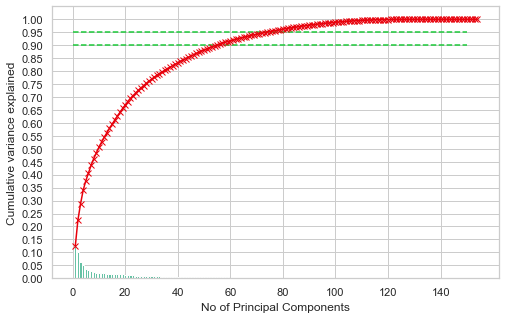

In [109]:
# Explore the variance using Scree plots to select the no of PC's
# Plot Scree plots
plt.figure(figsize=[8,5])
plt.bar(range(1,len(pca_m1.explained_variance_ratio_)+1),pca_m1.explained_variance_ratio_)
plt.plot(range(1,len(m1_varcum)+1),m1_varcum,c="r",marker='x')
plt.xlabel("No of Principal Components")
plt.ylabel("Cumulative variance explained")
plt.yticks(np.arange(0,10.5,0.5)/10)
plt.xticks(np.arange(0,150,20))
plt.hlines(y=0.95,xmin=0,xmax=150,colors="g",linestyles="--")
plt.hlines(y=0.90,xmin=0,xmax=150,colors="g",linestyles="--")
plt.show()

### Fit and Transform using the PC's using the no of components selected on Training Data

In [110]:
comp=60

In [111]:
# Fit the model and apply the dimensionality reduction to 3 PC's on the data
pca_m1_90 = PCA(n_components=comp,random_state=rndm_stat)

In [112]:
pc_name = list("PC"+str(i) for i in range(1,comp+1))

In [113]:
# Create a DF with Principal Components which explains variance of 90%
pca_m1_trn = pd.DataFrame(pca_m1_90.fit_transform(MX1_train),columns=pc_name)

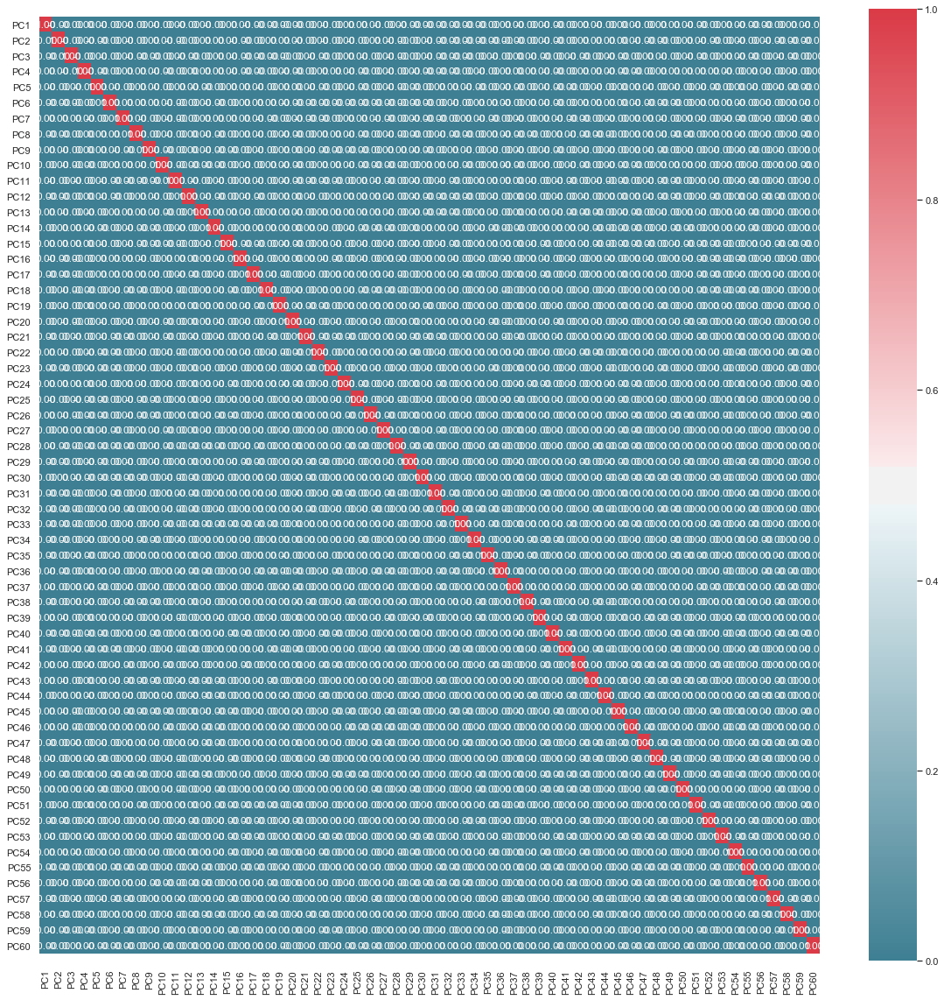

In [114]:
# Check the correlation with 3 PC's
plt.figure(figsize=(20,20))
colormap =  colormap = sns.diverging_palette(220, 10, as_cmap=True)
ax = sns.heatmap(round(pca_m1_trn.corr(),2), cmap=colormap, annot=True, fmt=".2f")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

In [115]:
# add churn label to df with  PC's
m1_pc_trn_df = pd.concat([pca_m1_trn,my1_train.reset_index(drop=True)],axis=1)
display(m1_pc_trn_df)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,Churn
0,-1.602503,4.107676,4.827443,-2.155074,-1.342072,0.926798,0.065354,0.731825,-1.710732,-0.246127,-0.154972,-0.764122,0.159110,-0.911863,-1.204773,-0.565080,-0.904645,-0.253937,0.263698,1.311713,-1.068735,0.380944,0.330117,0.031421,0.175135,0.191491,-0.325101,-0.178120,0.609851,-0.828142,-0.155309,0.230019,-0.807324,-0.578795,0.256398,-0.254353,0.078945,-0.022422,-0.160875,-0.054560,-0.441059,-0.544984,0.109578,0.050311,0.192408,0.940700,0.312750,-0.483000,-0.449208,-0.154526,-0.111096,0.115695,0.276290,0.144839,0.093633,0.274222,-0.294688,0.054937,0.234563,0.203060,0
1,3.161451,0.334494,2.328151,-3.490652,0.013157,-2.037981,1.775867,-2.416869,0.662633,-0.644072,0.058090,-0.569151,-0.539088,0.199521,-1.891954,1.461774,0.006327,-1.043075,-0.484405,0.926826,-1.272310,0.011436,0.687918,-1.402417,0.572791,0.382890,0.265016,-0.679093,0.068278,0.016049,0.464822,-0.854426,0.396871,0.457838,-0.135942,-0.793681,0.507550,0.047970,0.022467,0.529002,1.244359,0.791616,-1.771500,-0.202943,0.060363,-0.540419,0.621650,-0.599181,-0.304241,0.490819,0.538749,-0.673458,0.288702,0.350791,-0.214626,-0.603002,0.181902,0.546380,-1.287822,0.137223,0
2,-1.298719,7.618749,6.305965,-1.736101,3.711897,1.751391,-1.599264,0.544676,-0.295130,2.434438,14.999870,21.050486,0.241514,-0.211564,-3.583813,0.599451,-5.334594,-1.148132,2.297168,-20.335548,-7.229676,2.879191,0.040016,1.798059,0.352650,-0.320219,-1.644944,0.880912,-1.571946,0.103639,0.528769,2.730493,-0.217724,1.310154,0.241888,-0.380296,0.635571,-0.413523,0.683161,-1.545650,-0.361427,-0.542859,0.164165,-0.514595,0.644466,0.050374,0.366620,1.499205,0.331686,-0.030687,0.189476,-1.842459,0.746918,0.233699,0.235826,-0.116298,-3.855185,-1.076562,-1.345726,0.101477,0
3,5.199789,-0.872012,1.228041,-0.874018,0.210060,0.048323,1.562827,-3.166816,0.135608,-2.194811,0.444629,-0.586129,0.760219,1.618230,0.052052,1.466604,0.780067,-2.455636,-0.108604,-0.456319,0.727861,0.046648,-0.395531,-3.514077,1.102616,0.124875,1.283041,-0.830754,0.639340,0.270117,-0.421286,-0.338361,0.173942,-0.778237,-0.864109,-0.499106,0.757201,-1.545157,-0.808848,-0.586103,0.218868,0.229266,0.634730,-0.374220,0.160517,1.631725,0.887514,0.903340,-0.711298,0.495752,0.247345,-0.202327,-0.420302,-0.736653,-0.426014,0.264377,0.424480,0.733748,-0.360952,-0.909919,0
4,5.119989,-7.568499,3.668114,8.005075,0.091484,-2.360611,0.174558,1.471623,2.397882,-0.418209,0.239586,0.163176,-1.023455,-2.708348,0.576599,-2.226831,-0.771499,1.520611,0.904828,0.441114,-0.684443,0.063566,0.538230,-0.889282,0.268968,-0.404884,-0.116623,0.423701,0.210418,-0.179418,0.141465,-0.032719,-0.254798,-0.031202,0.345047,-0.194411,-0.450729,-0.293187,-0.167024,-0.612866,0.070852,0.078890,-0.314816,0.399696,-0.092110,0.269196,0.436823,0.499054,-0.405522,0.154665,-0.409341,0.073581,0.139138,0.074040,-0.191004,0.262348,-0.088806,-0.109890,-0.081955,-0.183965,0
5,3.154922,-2.350735,0.516709,1.234975,0.203940,-4.164915,1.675854,-1.601437,-0.752407,-0.802516,0.277257,0.124119,-0.534033,-0.814821,0.397677,1.810410,-0.464583,-0.577881,-0.198943,0.408465,0.344641,-0.022122,-1.077660,3.178935,-0.155298,0.265890,1.566651,2.947269,0.627970,0.364764,-0.127201,-1.273126,0.781257,-3.017244,-1.902718,1.180278,2.172705,0.292816,0.706836,-0.691600,-0.387337,0.310625,-0.078923,-0.537058,0.488264,0.644489,0.131809,-0.390398,0.258508,-0.159598,1.223095,-0.161325,0.307451,-2.194884,-0.355978,0.022428,0.444558,0.273830,-0.335466,1.496019,0
6,1.841925,0.104126,1.259321,-0.497222,-1.133552,-3.842597,1.500055,-1.913500,-0.750582,-0.553425,-1.898507,1.003431,-0.212208,0.637887,0.160641,1.085986,0.695462,-2.051614,-1.386054,-0.128406,0.197405,0.176133,-0.296847,-0.354934,0.593728,-0.220849,-0.143863,-0.207385,0.

### Visualize the PC's in eigen space

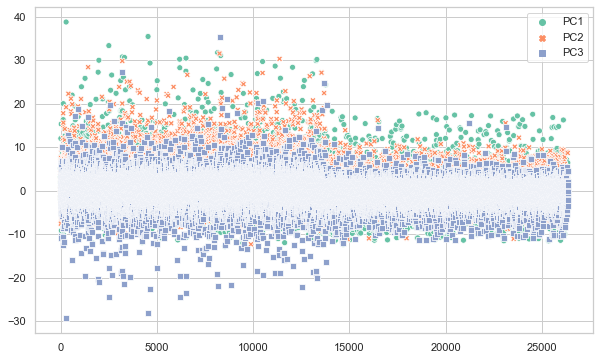

In [116]:
plt.figure(1,figsize=(10,6))
sns.scatterplot(data=m1_pc_trn_df[["PC1","PC2","PC3"]],hue=m1_pc_trn_df["Churn"])
plt.show()

### Map the PC's in eigen space to original column names

In [117]:
# Map the PC's in eigen space to original column names

# get number of component
n_pcs= pca_m1_90.n_components_ 

# get the index of the most important feature on EACH component
mst_imp = [np.abs(pca_m1_90.components_[i]).argmax() for i in range(n_pcs)]

# 
fr_cols = MX1_train.columns

# get the most important feature names
pc_cols_1 = [fr_cols[mst_imp[i]] for i in range(n_pcs)]

In [118]:
# Print the top PC'contributing to 95% variance 
print(color.BOLD+"PC's contributing to 95% variance \n"+color.END,pc_cols_1)

PC's contributing to 95% variance 
 ['av_rech_amt_data_7', 'loc_og_mou_8', 'std_og_mou_7', 'total_rech_num_8', 'std_ic_mou_7', 'offnet_mou_8', 'onnet_mou_8', 'roam_og_mou_7', 'total_rech_amt_6', 'roam_og_mou_7', 'loc_og_t2t_mou_7', 'isd_ic_mou_7', 'std_ic_t2f_mou_7', 'spl_og_mou_7', 'sachet_3g_6', 'sachet_3g_8', 'isd_og_mou_7', 'monthly_3g_7', 'spl_og_mou_8', 'isd_ic_mou_6', 'isd_og_mou_7', 'std_ic_t2t_mou_7', 'std_og_t2f_mou_8', 'vol_2g_mb_7', 'std_og_t2f_mou_8', 'spl_ic_mou_6', 'spl_ic_mou_7', 'count_rech_2g_6', 'og_others_6', 'roam_ic_mou_8', 'og_others_8', 'roam_ic_mou_8', 'loc_ic_t2m_mou_7', 'vol_2g_mb_8', 'spl_ic_mou_8', 'spl_ic_mou_8', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_6', 'og_others_7', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'aon', 'aon', 'loc_og_t2c_mou_7', 'last_day_rch_amt_7', 'date_of_last_rech_6', 'og_others_6', 'last_day_rch_amt_6', 'date_of_last_rech_7', 'og_others_6', 'last_day_rch_amt_6', 'spl_ic_mou_6', 'spl_ic_mou_6', 'date_of_last_rech_6', 'date_of_last_rech_7', 

### Transform using the PC's using the no of components selected on Test Data

In [119]:
# Create a DF with Principal Components which explains variance of 90%
pca_m1_tst = pd.DataFrame(pca_m1_90.transform(MX1_test),columns=pc_name)

In [120]:
# add churn label to df with  PC's
m1_pc_tst_df = pd.concat([pca_m1_tst,my1_test.reset_index(drop=True)],axis=1)
display(m1_pc_tst_df)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,Churn
0,-3.940017,10.011463,-2.863915,1.890789,0.948469,-5.834666,-6.072047,8.593893,8.251058,-0.074787,21.896679,35.507853,-13.551395,6.710169,5.789599,7.212116,-76.290528,-19.982465,-18.620836,14.299705,55.004948,-15.609665,18.443101,-7.969714,-4.595486,-0.682219,-4.187763,-1.208006,-18.236550,9.274738,5.797748,12.699967,-2.980647,-1.936484,-5.510410,-4.359297,-3.121230,1.167580,0.708045,-2.641626,-0.823937,-0.370085,-6.729575,-0.705673,0.937082,-1.566730,-2.814950,-1.975233,-4.140956,-3.747940,4.376226,2.715926,-1.767745,3.189724,-2.109834,-2.763335,-0.553359,3.334347,1.472621,0.935735,0
1,-3.497077,12.714097,6.588434,4.924957,-5.400560,1.270914,5.613587,1.942607,-3.548536,-1.440567,-5.574170,1.759696,7.298024,0.931861,-3.211866,-2.406948,-2.013817,0.083678,4.491427,-0.246863,3.157827,0.652048,-0.891572,0.443995,0.612385,1.211828,-1.054014,0.636090,-0.151256,-1.178198,0.431063,-1.052165,1.695587,-1.837437,1.729771,-0.466948,-3.219214,1.053007,0.070844,1.296675,0.229671,0.967900,0.628823,-2.404740,0.207278,-0.612238,1.935724,-1.508581,-2.945038,0.195005,0.473372,-2.755744,1.104731,0.225315,0.179615,-0.042462,0.052251,-1.693841,0.606224,0.285005,0
2,11.074831,6.955622,-4.517328,-3.266762,-1.456140,2.191578,0.732329,-0.182572,0.327521,-1.325615,-0.519056,-0.252281,0.934429,-2.349844,-1.545615,-1.303984,-1.972929,1.970521,1.061947,2.089555,-1.583803,0.130503,0.481751,2.026378,-0.371747,-0.491618,-0.545648,0.723680,0.407550,1.587458,0.159829,-2.963267,0.282386,1.478381,0.693614,0.351537,0.275883,-0.154708,-0.109632,-0.634337,0.071189,-0.404191,-0.555544,0.193484,-0.557164,0.166170,1.081988,1.823873,-0.794380,0.636741,1.619605,-0.599967,0.134753,0.878610,-1.028870,-0.641059,-0.164187,1.476775,0.917882,-0.390434,0
3,-2.510392,5.862019,2.903783,-0.965970,11.503864,-0.066607,0.023020,2.502635,3.384331,8.331443,-0.571119,-2.894236,12.279912,-2.783730,6.197821,-1.464018,1.219229,-2.371400,-3.586436,-0.655361,1.215227,-3.766361,7.881476,3.943413,7.674763,-0.326098,1.936074,-0.918823,1.454906,0.433116,-1.099915,1.194095,0.547236,0.597112,-0.907073,-0.209859,0.154462,-0.197937,0.386780,-1.009989,-1.084723,0.547687,0.336508,-1.567123,-0.698086,0.112296,1.254107,-0.133316,-0.360319,-0.464591,-0.239052,-0.582313,0.922630,-0.284235,0.166999,0.294395,0.038616,-0.760649,-0.572279,0.488643,0
4,-3.640062,5.198179,0.898331,3.069597,-3.574317,0.922715,0.346581,0.351044,3.881390,-0.688908,-2.918928,0.992161,-0.210230,-2.017539,0.075245,0.815462,1.010575,0.312271,-0.456439,-0.550600,-0.241536,-0.249217,0.818192,-0.509373,-0.241613,0.185440,-0.750926,0.124517,-1.109704,1.239996,-0.312780,-0.376116,-2.120853,0.172602,-0.194720,-0.035343,0.167615,0.480087,0.242365,0.330006,-0.202146,-0.567782,-0.935529,-0.188633,0.423350,0.458177,-1.062816,-0.544891,0.800394,0.216742,-0.491800,1.230534,-0.558854,-0.089456,0.073617,-0.158562,-0.155143,-0.171859,-0.495333,0.173338,0
5,-0.412442,-1.720413,1.755426,0.502604,1.326161,-1.114458,-0.515521,-0.314207,-1.124852,1.282139,0.466696,-1.026623,0.778070,-0.659177,-0.526961,-2.116686,-0.062558,0.849559,-0.233064,-0.312316,0.703541,-0.522527,1.627501,0.212829,0.122934,0.798658,-0.591637,-0.042378,0.489374,0.158437,-0.368953,-0.015611,-0.426900,-0.335561,0.063987,-0.176913,0.160240,0.807353,0.042625,1.469708,-0.873674,-1.025327,1.401224,-1.087868,-0.749670,0.689904,0.474272,0.456189,0.535785,-0.650706,-0.083692,0.072244,-0.239565,0.147798,1.287033,-0.836211,-0.081259,-0.471666,1.226485,0.161019,0
6,2.637788,-0.887433,3.620064,2.573123,-0.946174,-1.401957,0.749680,-0.690888,1.210368,-1.384753,-1.052925,0.183552,0.183715,-0.774430,-0.230527,0.315308,-0.420274,0.566704,-1.227891,0.747615,-0.660256,0.065246,-0.112753,2.766927,-0.528397,0.

# ML Modelling with PCA

## Build the Model using Logistic Regression Classifier

### Hyperparameter Tuning and Selection using GrideSearchCV

In [121]:
# list of alphas to tune
params = {'C': [0.001, 0.01, 0.05, 0.1,  0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0],"penalty":['l1','l2'],"class_weight":["Balanced"]}

lr = LogisticRegression()

# cross validation
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = rndm_stat)
lr_cv = GridSearchCV(estimator = lr, 
                        param_grid = params, 
                        return_train_score=True,
                        verbose = 1,
                        scoring='recall',
                        n_jobs=-1)            
lr_cv.fit(pca_m1_trn, my1_train)

Fitting 5 folds for each of 44 candidates, totalling 220 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 220 out of 220 | elapsed:   33.1s finished


GridSearchCV(cv=None, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                               0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0,
                               8.0, 9.0, 10.0],
                         'class_weight': ['Balanced'],
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs'

In [122]:
# explore the results
lcv_results = pd.DataFrame(lr_cv.cv_results_)
lcv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_class_weight,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.053273,0.011741,0.000000,0.000000,0.001,Balanced,l1,"{'C': 0.001, 'class_weight': 'Balanced', 'pena...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.401474,0.025611,0.012886,0.006640,0.001,Balanced,l2,"{'C': 0.001, 'class_weight': 'Balanced', 'pena...",0.823904,0.851394,0.853386,0.861753,0.849004,0.847888,0.012738,22,0.853586,0.848108,0.847410,0.846016,0.846713,0.848367,0.002701
2,0.054670,0.009710,0.000000,0.000000,0.01,Balanced,l1,"{'C': 0.01, 'class_weight': 'Balanced', 'penal...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.600255,0.059972,0.014666,0.005228,0.01,Balanced,l2,"{'C': 0.01, 'class_weight': 'Balanced', 'penal...",0.827888,0.856972,0.859761,0.864143,0.849402,0.851633,0.012805,21,0.855976,0.851394,0.851693,0.850498,0.851394,0.852191,0.001934
4,0.047095,0.007136,0.000000,0.000000,0.05,Balanced,l1,"{'C': 0.05, 'class_weight': 'Balanced', 'penal...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [123]:
# Model best Hyperparams and score
print("Best Hyperparams:", lr_cv.best_params_)
print("Best recall: ", lr_cv.best_score_)

Best Hyperparams: {'C': 1.0, 'class_weight': 'Balanced', 'penalty': 'l2'}
Best recall:  0.8527490039840637


### Build the model using best params

In [124]:
m1_pc_lr = LogisticRegression(C=lr_cv.best_params_["C"],verbose=3,random_state=rndm_stat,penalty=lr_cv.best_params_["penalty"],class_weight=lr_cv.best_params_["class_weight"],n_jobs=-1)

m1_pc_lr.fit(pca_m1_trn, my1_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   12.0s finished


LogisticRegression(C=1.0, class_weight='Balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=-1, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=3,
                   warm_start=False)

In [125]:
my1_lr_prob = m1_pc_lr.predict_proba(pca_m1_trn)[:,1]

In [126]:
m1_trn_df = pd.DataFrame({"Index":my1_train.index,"Churn":my1_train.values,"LR_Pred_Prob":my1_lr_prob})
m1_trn_df

,Index,Churn,LR_Pred_Prob
0,0,0,0.025591
1,1,0,0.068897
2,2,0,0.094004
3,3,0,0.087938
4,4,0,0.211660
5,5,0,0.009297
6,6,0,0.010454
7,7,0,0.254723
8,8,0,0.002632
9,9,0,0.402854


### Model metrics and evaluation

#### Plot the ROC Curve 

* The plot is between Sensitivity on Y-Axis and 1-Specificity on X-Axis
* ROC Curve demonstrates tradeoff between Specificity and Sensitivity

In [127]:
## Function to plot ROC curve
# This function takes y_actual and probability of labels, computes fpr and tpr to plot ROC

def plt_roc(actual,prob):
    fpr,tpr, thresholds = metrics.roc_curve(actual,prob,drop_intermediate = False)
    auc_score = metrics.roc_auc_score(actual,prob)
    plt.figure(1,figsize=(6,6))
    plt.plot(fpr,tpr,color="red",label="ROC Curve (AUC = %0.2f)"%auc_score)
    plt.plot([0,1],[0,1],color="darkblue",linestyle="--")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()
    return None

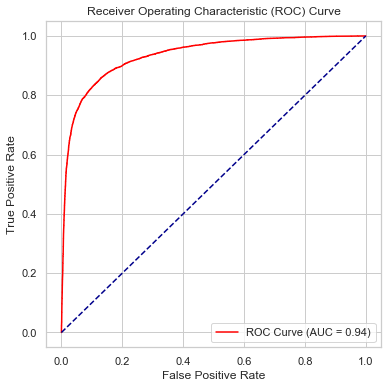

In [128]:
# plot the ROC Curve
plt_roc(m1_trn_df.Churn,m1_trn_df.LR_Pred_Prob)

In [129]:
# Cross Validation Score on RECALL
m1_cvs = cross_val_score(m1_pc_lr,pca_m1_trn, my1_train,cv=5,scoring="recall")
np.mean(m1_cvs)
#m1_cvs.show()

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   10.6s finished


0.8527490039840637

#### Find the optimal cutoff 

In [130]:
def logr_metrics(actual,predict):
    # Confusion Matrix
    l_cm = metrics.confusion_matrix(actual,predict)
    
    # Extract TN,FP,FN,TP from confusion matrix
    tnv,fpv,fnv,tpv = l_cm.ravel()
    
    # Calculate Accuracy, Sensitivity(TPR / Recall), Specificity, FPR, Precision (PPV), NPV
    l_acc = (tnv+tpv) /(tnv+tpv+fnv+fpv)
    l_sen = (tpv) /(tpv+fnv)
    l_spec = (tnv) /(tnv+fpv)
    l_fpr = (fpv) /(tnv+fpv)
    l_prec = (tpv) /(tpv+fpv)
    l_npv = (tnv) /(tnv+fnv)
    l_f1_scr = 2*((l_prec*l_sen)/(l_prec+l_sen))
    return(l_acc,l_sen,l_spec,l_fpr,l_prec,l_npv,l_f1_scr)

In [131]:
# Predictions at different cutoff values
met_cols = ["Prob","Accuracy","Sensitivity","Specificity","FPR","Prcesion","NPV","F1_Scr"]
m1_lr_cut_df = pd.DataFrame( columns = met_cols)
for i in range(10):
    k = i/10
    kloc = str(k)+"LR"
    m1_trn_df[kloc] = m1_trn_df.LR_Pred_Prob.map(lambda x: 1 if x > k else 0)
    ac,se,sp,fpra,prcn,nprv,f1scr = logr_metrics(m1_trn_df.Churn,m1_trn_df[kloc])
    m1_lr_cut_df.loc[k] = [k,ac,se,sp,fpra,prcn,nprv,f1scr]

display(m1_trn_df.head())
display(m1_lr_cut_df)

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR
0,0,0,0.025591,1,0,0,0,0,0,0,0,0,0
1,1,0,0.068897,1,0,0,0,0,0,0,0,0,0
2,2,0,0.094004,1,0,0,0,0,0,0,0,0,0
3,3,0,0.087938,1,0,0,0,0,0,0,0,0,0
4,4,0,0.211660,1,1,1,0,0,0,0,0,0,0


,Prob,Accuracy,Sensitivity,Specificity,FPR,Prcesion,NPV,F1_Scr
0.0,0.0,0.476190,1.000000,0.000000,1.000000,0.476190,NaN,0.645161
0.1,0.1,0.736331,0.974661,0.519667,0.480333,0.648465,0.957555,0.778786
0.2,0.2,0.800266,0.946773,0.667077,0.332923,0.721083,0.932368,0.818658
0.3,0.3,0.834756,0.919044,0.758131,0.241869,0.775499,0.911514,0.841192
0.4,0.4,0.855549,0.889482,0.824701,0.175299,0.821836,0.891403,0.854322
0.5,0.5,0.863935,0.852510,0.874321,0.125679,0.860463,0.867035,0.856468
0.6,0.6,0.864124,0.808446,0.914741,0.085259,0.896052,0.840075,0.849998
0.7,0.7,0.855170,0.756733,0.944658,0.055342,0.925543,0.810302,0.832668
0.8,0.8,0.828458,0.674263,0.968635,0.031365,0.951321,0.765865,0.789182
0.9,0.9,0.756782,0.504223,0.986382,0.013618,0.971148,0.686375,0.663799


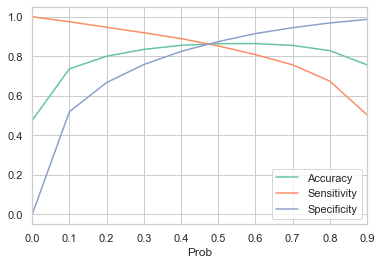

In [132]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
m1_lr_cut_df.plot.line(x='Prob', y=['Accuracy','Sensitivity','Specificity'])
plt.show()

In [133]:
# Precision-Recall is a useful measure of success of prediction when the classes are very imbalanced.
# The precision-recall curve shows the tradeoff between precision and recall for different threshold. 
# A high area under the curve represents both high recall and high precision, where high precision relates 
# to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), 
# as well as returning a majority of all positive results (high recall).

p, r, thresholds = metrics.precision_recall_curve(m1_trn_df.Churn, m1_trn_df.LR_Pred_Prob)

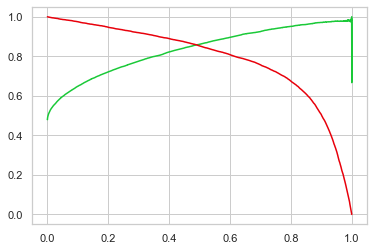

In [134]:
# Plot Precision - Recall Curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [135]:
m1_lr_prob_cut = 0.1
m1_trn_df["LR_Final_Pred"] = m1_trn_df.LR_Pred_Prob.map(lambda x: 1 if x > m1_lr_prob_cut else 0)
m1_trn_df.head()

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR,LR_Final_Pred
0,0,0,0.025591,1,0,0,0,0,0,0,0,0,0,0
1,1,0,0.068897,1,0,0,0,0,0,0,0,0,0,0
2,2,0,0.094004,1,0,0,0,0,0,0,0,0,0,0
3,3,0,0.087938,1,0,0,0,0,0,0,0,0,0,0
4,4,0,0.211660,1,1,1,0,0,0,0,0,0,0,1


Accuracy= 0.7363308670081579,

Sensitivity = 0.9746613545816734,

Specificity = 0.519666787395871,

FPR = 0.4803332126041289,

Precision = 0.6484652494301013,

NPV = 0.9575547250400427,

F1 Score = 0.7787858529908


(2.5, -0.5)

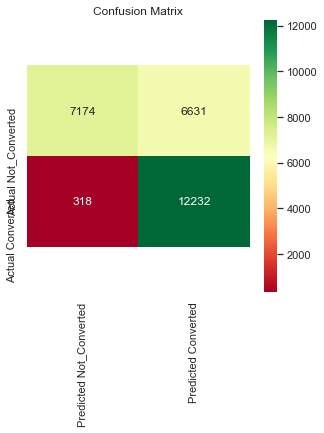

In [136]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m1_trn_df.Churn,m1_trn_df["LR_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m1_trn_df.Churn,m1_trn_df["LR_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [137]:
# Print Classification Report
print(classification_report(m1_trn_df.Churn,m1_trn_df["LR_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.96      0.52      0.67     13805
           1       0.65      0.97      0.78     12550

    accuracy                           0.74     26355
   macro avg       0.80      0.75      0.73     26355
weighted avg       0.81      0.74      0.72     26355



### Build the results DF

In [138]:
# Build the Results df
mod_cols = ["Metrics","PCA_LR_Train"]
r_df = pd.DataFrame(columns = mod_cols)
r_df["Metrics"] = ["Accuracy","Sensitivity(Recall)","Specificity","FPR","Prcesion","NPV","F1_Scr"]
res = logr_metrics(m1_trn_df.Churn,m1_trn_df["LR_Final_Pred"])
r_df["PCA_LR_Train"] = res
r_df

,Metrics,PCA_LR_Train
0,Accuracy,0.736331
1,Sensitivity(Recall),0.974661
2,Specificity,0.519667
3,FPR,0.480333
4,Prcesion,0.648465
5,NPV,0.957555
6,F1_Scr,0.778786


### Apply the Model on the test set

In [139]:
# Predict the Probabilities
my1_test_pred_prob =  m1_pc_lr.predict_proba(pca_m1_tst)[:,1]

# inspect the probabilities
display(my1_test_pred_prob)

array([1.98846612e-03, 3.60714457e-07, 2.59041377e-02, ...,
       2.73976695e-05, 2.75314687e-01, 5.95897279e-01])

In [140]:
my1_lr_prob = m1_pc_lr.predict_proba(pca_m1_trn)[:,1]

In [141]:
m1_tst_df = pd.DataFrame({"Index":my1_test.index,"Churn":my1_test.values,"LR_Pred_Prob":my1_test_pred_prob})
m1_tst_df

,Index,Churn,LR_Pred_Prob
0,48098,0,1.988466e-03
1,69125,0,3.607145e-07
2,12043,0,2.590414e-02
3,39055,0,1.220831e-01
4,37250,0,3.523836e-01
5,84256,0,2.648509e-01
6,30725,0,1.389897e-01
7,4204,0,1.762583e-01
8,94017,0,6.808490e-01
9,8180,0,5.135344e-02


In [142]:
m1_tst_df["LR_Final_Pred"] = m1_tst_df.LR_Pred_Prob.map(lambda x: 1 if x > m1_lr_prob_cut else 0)
m1_tst_df.head()

,Index,Churn,LR_Pred_Prob,LR_Final_Pred
0,48098,0,1.988466e-03,0
1,69125,0,3.607145e-07,0
2,12043,0,2.590414e-02,0
3,39055,0,1.220831e-01,1
4,37250,0,3.523836e-01,1


Accuracy= 0.4790686451924237,

Sensitivity = 0.9479166666666666,

Specificity = 0.4440554907299365,

FPR = 0.5559445092700636,

Precision = 0.11294993793959454,

NPV = 0.9913169319826338,

F1 Score = 0.20184842883548984


(2.5, -0.5)

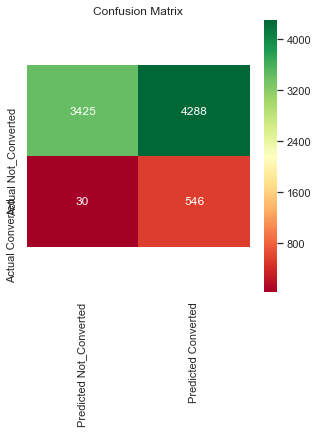

In [143]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m1_tst_df.Churn,m1_tst_df["LR_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m1_tst_df.Churn,m1_tst_df["LR_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [144]:
print(classification_report(m1_tst_df.Churn,m1_tst_df["LR_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.99      0.44      0.61      7713
           1       0.11      0.95      0.20       576

    accuracy                           0.48      8289
   macro avg       0.55      0.70      0.41      8289
weighted avg       0.93      0.48      0.58      8289



### Append the results to DF

In [145]:
# Append the results to DF
res = logr_metrics(m1_tst_df.Churn,m1_tst_df["LR_Final_Pred"])
r_df["PCA_LR_Test"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test
0,Accuracy,0.736331,0.479069
1,Sensitivity(Recall),0.974661,0.947917
2,Specificity,0.519667,0.444055
3,FPR,0.480333,0.555945
4,Prcesion,0.648465,0.112950
5,NPV,0.957555,0.991317
6,F1_Scr,0.778786,0.201848


## Build the Model using Random Forest


### Hyperparameter Tuning and Selection using GrideSearchCV

In [146]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_jobs=-1,random_state=rndm_stat)

# list of hyper params to tune
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4,5,10],'class_weight': ['balanced'],"n_jobs":[-1]}

# cross validation
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = rndm_stat)

rf_cv = GridSearchCV(estimator = rf, 
                        param_grid = params, 
                        return_train_score=True,
                        verbose = 1,
                        n_jobs=-1)            
rf_cv.fit(pca_m1_trn, my1_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed: 10.1min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=-1,
                                              oob_score=False, random_state=42,
                                 

In [147]:
# explore the results
rfcv_results = pd.DataFrame(rf_cv.cv_results_)
rfcv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_class_weight,param_criterion,param_max_features,param_n_jobs,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,46.693263,2.154545,0.887230,0.706978,balanced,gini,auto,-1,"{'class_weight': 'balanced', 'criterion': 'gin...",0.963195,0.966989,0.966799,0.969835,0.967179,0.966799,0.002116,3,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1,139.458780,9.874196,1.245547,0.564674,balanced,gini,0.4,-1,"{'class_weight': 'balanced', 'criterion': 'gin...",0.961108,0.963385,0.965471,0.966610,0.965851,0.964485,0.001998,8,1.0,1.0,1.0,1.0,1.0,1.0,0.0
2,31.889158,1.538796,1.608441,0.289803,balanced,gini,5,-1,"{'class_weight': 'balanced', 'criterion': 'gin...",0.962436,0.967938,0.966989,0.967938,0.965661,0.966192,0.002055,6,1.0,1.0,1.0,1.0,1.0,1.0,0.0
3,39.126606,6.407126,1.266641,0.518435,balanced,gini,10,-1,"{'class_weight': 'balanced', 'criterion': 'gin...",0.962436,0.967558,0.966610,0.968127,0.967938,0.966534,0.002115,5,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,32.990983,0.572929,1.092091,0.488896,balanced,entropy,auto,-1,"{'class_weight': 'balanced', 'criterion': 'ent...",0.961108,0.969076,0.969456,0.968886,0.966989,0.967103,0.003116,2,1.0,1.0,1.0,1.0,1.0,1.0,0.0


In [148]:
# Model best Hyperparams and score
print("Best Hyperparams:", rf_cv.best_params_)
print("Best recall: ", rf_cv.best_score_)

Best Hyperparams: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 5, 'n_jobs': -1}
Best recall:  0.9680895465756023


### Build the model using best params

In [149]:
m1_pc_rf = RandomForestClassifier(criterion=rf_cv.best_params_["criterion"],verbose=3,random_state=rndm_stat,max_features=rf_cv.best_params_["max_features"],class_weight="balanced",n_jobs=-1)

m1_pc_rf.fit(pca_m1_trn, my1_train)

building tree 1 of 100building tree 2 of 100building tree 3 of 100

building tree 4 of 100



[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100


[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    3.0s


building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100building tree 60 of 100

building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.7s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='entropy', max_depth=None, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=3,
                       warm_start=False)

In [150]:
my1_rf_prob = m1_pc_rf.predict_proba(pca_m1_trn)[:,1]

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished


In [151]:
m1_trn_df["RF_Pred_Prob"] = my1_rf_prob
m1_trn_df

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR,LR_Final_Pred,RF_Pred_Prob
0,0,0,0.025591,1,0,0,0,0,0,0,0,0,0,0,0.02
1,1,0,0.068897,1,0,0,0,0,0,0,0,0,0,0,0.00
2,2,0,0.094004,1,0,0,0,0,0,0,0,0,0,0,0.09
3,3,0,0.087938,1,0,0,0,0,0,0,0,0,0,0,0.02
4,4,0,0.211660,1,1,1,0,0,0,0,0,0,0,1,0.01
5,5,0,0.009297,1,0,0,0,0,0,0,0,0,0,0,0.03
6,6,0,0.010454,1,0,0,0,0,0,0,0,0,0,0,0.03
7,7,0,0.254723,1,1,1,0,0,0,0,0,0,0,1,0.02
8,8,0,0.002632,1,0,0,0,0,0,0,0,0,0,0,0.04
9,9,0,0.402854,1,1,1,1,1,0,0,0,0,0,1,0.10


### Model metrics and evaluation

#### Plot the ROC Curve 

* The plot is between Sensitivity on Y-Axis and 1-Specificity on X-Axis
* ROC Curve demonstrates tradeoff between Specificity and Sensitivity

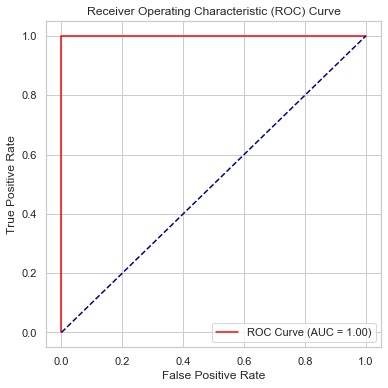

In [152]:
# plot the ROC Curve
plt_roc(m1_trn_df.Churn,m1_trn_df.RF_Pred_Prob)

In [153]:
# Cross Validation Score on Recall
m1_rf_cvs = cross_val_score(m1_pc_rf,pca_m1_trn, my1_train,cv=5,scoring="recall")
np.mean(m1_cvs)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]:

0.8527490039840637

#### Find the optimal cutoff 

In [154]:
# Predictions at different cutoff values
met_cols = ["Prob","Accuracy","Sensitivity","Specificity","FPR","Prcesion","NPV","F1_Scr"]
m1_rf_cut_df = pd.DataFrame( columns = met_cols)
for i in range(10):
    k = i/10
    kcol = str(k)+"_RF"
    m1_trn_df[kcol] = m1_trn_df.RF_Pred_Prob.map(lambda x: 1 if x > k else 0)
    ac,se,sp,fpra,prcn,nprv,f1scr = logr_metrics(m1_trn_df.Churn,m1_trn_df[kcol])
    m1_rf_cut_df.loc[k] = [k,ac,se,sp,fpra,prcn,nprv,f1scr]

display(m1_trn_df.head())
display(m1_rf_cut_df)

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR,LR_Final_Pred,RF_Pred_Prob,0.0_RF,0.1_RF,0.2_RF,0.3_RF,0.4_RF,0.5_RF,0.6_RF,0.7_RF,0.8_RF,0.9_RF
0,0,0,0.025591,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0
1,1,0,0.068897,1,0,0,0,0,0,0,0,0,0,0,0.00,0,0,0,0,0,0,0,0,0,0
2,2,0,0.094004,1,0,0,0,0,0,0,0,0,0,0,0.09,1,0,0,0,0,0,0,0,0,0
3,3,0,0.087938,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0
4,4,0,0.211660,1,1,1,0,0,0,0,0,0,0,1,0.01,1,0,0,0,0,0,0,0,0,0


,Prob,Accuracy,Sensitivity,Specificity,FPR,Prcesion,NPV,F1_Scr
0.0,0.0,0.512730,1.000000,0.069757,0.930243,0.494250,1.000000,0.661536
0.1,0.1,0.929273,1.000000,0.864976,0.135024,0.870681,1.000000,0.930871
0.2,0.2,0.989945,1.000000,0.980804,0.019196,0.979321,1.000000,0.989553
0.3,0.3,0.998786,1.000000,0.997682,0.002318,0.997457,1.000000,0.998727
0.4,0.4,0.999924,1.000000,0.999855,0.000145,0.999841,1.000000,0.999920
0.5,0.5,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000
0.6,0.6,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000
0.7,0.7,0.998938,0.997769,1.000000,0.000000,1.000000,0.997976,0.998883
0.8,0.8,0.988162,0.975139,1.000000,0.000000,1.000000,0.977899,0.987413
0.9,0.9,0.927073,0.846853,1.000000,0.000000,1.000000,0.877790,0.917077


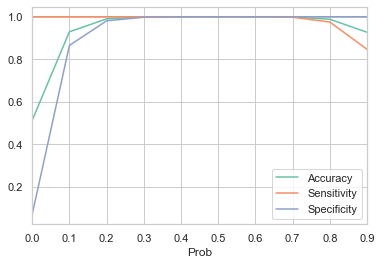

In [155]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
m1_rf_cut_df.plot.line(x='Prob', y=['Accuracy','Sensitivity','Specificity'])
plt.show()

In [156]:
# Precision-Recall is a useful measure of success of prediction when the classes are very imbalanced.
# The precision-recall curve shows the tradeoff between precision and recall for different threshold. 
# A high area under the curve represents both high recall and high precision, where high precision relates 
# to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), 
# as well as returning a majority of all positive results (high recall).

p, r, thresholds = metrics.precision_recall_curve(m1_trn_df.Churn, m1_trn_df.RF_Pred_Prob)

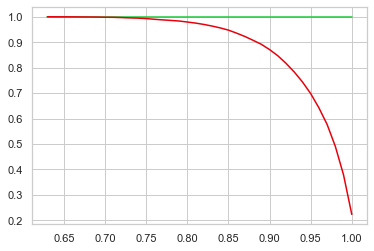

In [157]:
# Plot Precision - Recall Curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [158]:
m1_rf_cut = 0.3
m1_trn_df["RF_Final_Pred"] = m1_trn_df.RF_Pred_Prob.map(lambda x: 1 if x > m1_rf_cut else 0)
m1_trn_df.head()

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR,LR_Final_Pred,RF_Pred_Prob,0.0_RF,0.1_RF,0.2_RF,0.3_RF,0.4_RF,0.5_RF,0.6_RF,0.7_RF,0.8_RF,0.9_RF,RF_Final_Pred
0,0,0,0.025591,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0
1,1,0,0.068897,1,0,0,0,0,0,0,0,0,0,0,0.00,0,0,0,0,0,0,0,0,0,0,0
2,2,0,0.094004,1,0,0,0,0,0,0,0,0,0,0,0.09,1,0,0,0,0,0,0,0,0,0,0
3,3,0,0.087938,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0
4,4,0,0.211660,1,1,1,0,0,0,0,0,0,0,1,0.01,1,0,0,0,0,0,0,0,0,0,0


Accuracy= 0.9987858091443749,

Sensitivity = 1.0,

Specificity = 0.9976819992756247,

FPR = 0.002318000724375226,

Precision = 0.9974566841519631,

NPV = 1.0,

F1 Score = 0.9987267229030717


(2.5, -0.5)

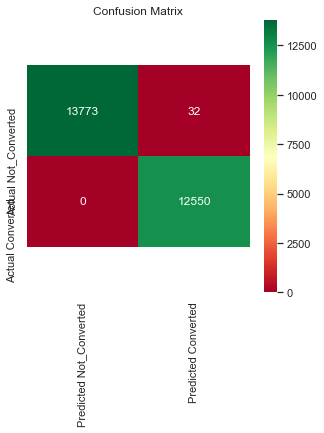

In [159]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m1_trn_df.Churn,m1_trn_df["RF_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m1_trn_df.Churn,m1_trn_df["RF_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [160]:
# Print Classification Report
print(classification_report(m1_trn_df.Churn,m1_trn_df["RF_Final_Pred"]))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13805
           1       1.00      1.00      1.00     12550

    accuracy                           1.00     26355
   macro avg       1.00      1.00      1.00     26355
weighted avg       1.00      1.00      1.00     26355



### Append the results to DF

In [161]:
# Append the results to DF
res = logr_metrics(m1_trn_df.Churn,m1_trn_df["RF_Final_Pred"])
r_df["PCA_RF_Train"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train
0,Accuracy,0.736331,0.479069,0.998786
1,Sensitivity(Recall),0.974661,0.947917,1.000000
2,Specificity,0.519667,0.444055,0.997682
3,FPR,0.480333,0.555945,0.002318
4,Prcesion,0.648465,0.112950,0.997457
5,NPV,0.957555,0.991317,1.000000
6,F1_Scr,0.778786,0.201848,0.998727


### Apply the Model on the test set

In [162]:
# Predict the Probabilities
my1_rf_test_pred_prob =  m1_pc_rf.predict_proba(pca_m1_tst)[:,1]

# inspect the probabilities
display(my1_rf_test_pred_prob)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished


array([0.15, 0.07, 0.11, ..., 0.01, 0.33, 0.28])

In [163]:
m1_tst_df["RF_Pred_Prob"] = my1_rf_test_pred_prob
m1_tst_df

,Index,Churn,LR_Pred_Prob,LR_Final_Pred,RF_Pred_Prob
0,48098,0,1.988466e-03,0,0.15
1,69125,0,3.607145e-07,0,0.07
2,12043,0,2.590414e-02,0,0.11
3,39055,0,1.220831e-01,1,0.04
4,37250,0,3.523836e-01,1,0.23
5,84256,0,2.648509e-01,1,0.18
6,30725,0,1.389897e-01,1,0.22
7,4204,0,1.762583e-01,1,0.09
8,94017,0,6.808490e-01,1,0.25
9,8180,0,5.135344e-02,0,0.15


In [164]:
m1_tst_df["RF_Final_Pred"] = m1_tst_df.RF_Pred_Prob.map(lambda x: 1 if x > m1_rf_cut else 0)
m1_tst_df.head()

,Index,Churn,LR_Pred_Prob,LR_Final_Pred,RF_Pred_Prob,RF_Final_Pred
0,48098,0,1.988466e-03,0,0.15,0
1,69125,0,3.607145e-07,0,0.07,0
2,12043,0,2.590414e-02,0,0.11,0
3,39055,0,1.220831e-01,1,0.04,0
4,37250,0,3.523836e-01,1,0.23,0


Accuracy= 0.8099891422366993,

Sensitivity = 0.7291666666666666,

Specificity = 0.8160248930377285,

FPR = 0.18397510696227148,

Precision = 0.22838499184339314,

NPV = 0.9758139534883721,

F1 Score = 0.3478260869565218


(2.5, -0.5)

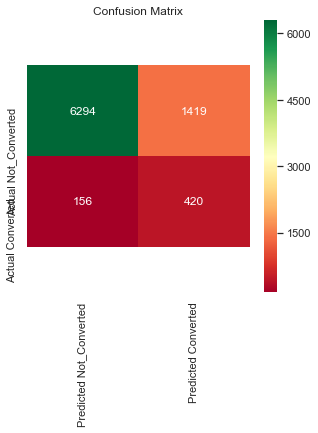

In [165]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m1_tst_df.Churn,m1_tst_df["RF_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m1_tst_df.Churn,m1_tst_df["RF_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [166]:
print(classification_report(m1_tst_df.Churn,m1_tst_df["RF_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.98      0.82      0.89      7713
           1       0.23      0.73      0.35       576

    accuracy                           0.81      8289
   macro avg       0.60      0.77      0.62      8289
weighted avg       0.92      0.81      0.85      8289



### Append the results to DF

In [167]:
# Append the results to DF
res = logr_metrics(m1_tst_df.Churn,m1_tst_df["RF_Final_Pred"])
r_df["PCA_RF_Test"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test
0,Accuracy,0.736331,0.479069,0.998786,0.809989
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167
2,Specificity,0.519667,0.444055,0.997682,0.816025
3,FPR,0.480333,0.555945,0.002318,0.183975
4,Prcesion,0.648465,0.112950,0.997457,0.228385
5,NPV,0.957555,0.991317,1.000000,0.975814
6,F1_Scr,0.778786,0.201848,0.998727,0.347826


## Build the Model using AdaBoost


### Hyperparameter Tuning and Selection using GrideSearchCV

In [168]:
ab = AdaBoostClassifier(random_state=rndm_stat,learning_rate=1)

# list of hyper params to tune
params = {'n_estimators': [50,100,200,300]}

# cross validation
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = rndm_stat)

ab_cv = GridSearchCV(estimator = ab, 
                        param_grid = params, 
                        return_train_score=True,
                        verbose = 1,
                        n_jobs=-1)            
ab_cv.fit(pca_m1_trn, my1_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  5.1min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None, learning_rate=1,
                                          n_estimators=50, random_state=42),
             iid='deprecated', n_jobs=-1,
             param_grid={'n_estimators': [50, 100, 200, 300]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=1)

In [169]:
# explore the results
abcv_results = pd.DataFrame(ab_cv.cv_results_)
abcv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,18.603246,1.189321,0.200435,0.033642,50,{'n_estimators': 50},0.837223,0.859799,0.857333,0.861506,0.848036,0.852779,0.009063,4,0.865775,0.859941,0.859467,0.860368,0.859467,0.861004,0.002409
1,33.314769,0.313667,0.372724,0.029271,100,{'n_estimators': 100},0.843293,0.869095,0.870803,0.873648,0.865870,0.864542,0.010919,3,0.881000,0.872842,0.874455,0.875498,0.875261,0.875811,0.002756
2,70.294553,1.727256,0.735825,0.042730,200,{'n_estimators': 200},0.854677,0.886549,0.881996,0.880288,0.876494,0.876001,0.011141,2,0.896604,0.887782,0.889300,0.891387,0.890296,0.891074,0.003009
3,89.136388,8.474841,0.871587,0.262794,300,{'n_estimators': 300},0.863783,0.893569,0.888067,0.888446,0.881616,0.883096,0.010375,1,0.908367,0.896936,0.898644,0.901347,0.899450,0.900949,0.003971


In [170]:
# Model best Hyperparams and score
print("Best Hyperparams:", ab_cv.best_params_)
print("Best Recall: ", ab_cv.best_score_)

Best Hyperparams: {'n_estimators': 300}
Best Recall:  0.8830961866818441


### Build the model using best params

In [171]:
m1_pc_ab = AdaBoostClassifier(n_estimators=ab_cv.best_params_["n_estimators"],random_state=rndm_stat)

m1_pc_ab.fit(pca_m1_trn, my1_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=300, random_state=42)

In [172]:
my1_ab_prob = m1_pc_ab.predict_proba(pca_m1_trn)[:,1]

In [173]:
m1_trn_df["AB_Pred_Prob"] = my1_ab_prob
m1_trn_df

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR,LR_Final_Pred,RF_Pred_Prob,0.0_RF,0.1_RF,0.2_RF,0.3_RF,0.4_RF,0.5_RF,0.6_RF,0.7_RF,0.8_RF,0.9_RF,RF_Final_Pred,AB_Pred_Prob
0,0,0,0.025591,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0,0.497236
1,1,0,0.068897,1,0,0,0,0,0,0,0,0,0,0,0.00,0,0,0,0,0,0,0,0,0,0,0,0.495574
2,2,0,0.094004,1,0,0,0,0,0,0,0,0,0,0,0.09,1,0,0,0,0,0,0,0,0,0,0,0.498695
3,3,0,0.087938,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0,0.496106
4,4,0,0.211660,1,1,1,0,0,0,0,0,0,0,1,0.01,1,0,0,0,0,0,0,0,0,0,0,0.497672
5,5,0,0.009297,1,0,0,0,0,0,0,0,0,0,0,0.03,1,0,0,0,0,0,0,0,0,0,0,0.497822
6,6,0,0.010454,1,0,0,0,0,0,0,0,0,0,0,0.03,1,0,0,0,0,0,0,0,0,0,0,0.496963
7,7,0,0.254723,1,1,1,0,0,0,0,0,0,0,1,0.02,1,0,0,0,0,0,0,0,0,0,0,0.497188
8,8,0,0.002632,1,0,0,0,0,0,0,0,0,0,0,0.04,1,0,0,0,0,0,0,0,0,0,0,0.497618
9,9,0,0.402854,1,1,1,1,1,0,0,0,0,0,1,0.10,1,0,0,0,0,0,0,0,0,0,0,0.497515


### Model metrics and evaluation

#### Plot the ROC Curve 

* The plot is between Sensitivity on Y-Axis and 1-Specificity on X-Axis
* ROC Curve demonstrates tradeoff between Specificity and Sensitivity

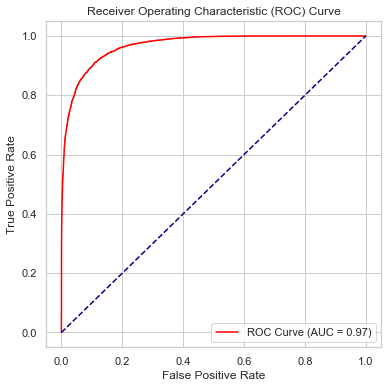

In [174]:
# plot the ROC Curve
plt_roc(m1_trn_df.Churn,m1_trn_df.AB_Pred_Prob)

In [175]:
# Cross Validation Score on Recall
m1_ab_cvs = cross_val_score(m1_pc_ab,pca_m1_trn, my1_train,cv=5,scoring="recall")
np.mean(m1_ab_cvs)

0.8729880478087649

#### Find the optimal cutoff 

In [176]:
# Predictions at different cutoff values
met_cols = ["Prob","Accuracy","Sensitivity","Specificity","FPR","Prcesion","NPV","F1_Scr"]
m1_ab_cut_df = pd.DataFrame( columns = met_cols)
for i in range(10):
    k = i/10
    kcol = str(k)+"_AB"
    m1_trn_df[kcol] = m1_trn_df.AB_Pred_Prob.map(lambda x: 1 if x > k else 0)
    ac,se,sp,fpra,prcn,nprv,f1scr = logr_metrics(m1_trn_df.Churn,m1_trn_df[kcol])
    m1_ab_cut_df.loc[k] = [k,ac,se,sp,fpra,prcn,nprv,f1scr]

display(m1_trn_df.head())
display(m1_ab_cut_df)

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR,LR_Final_Pred,RF_Pred_Prob,0.0_RF,0.1_RF,0.2_RF,0.3_RF,0.4_RF,0.5_RF,0.6_RF,0.7_RF,0.8_RF,0.9_RF,RF_Final_Pred,AB_Pred_Prob,0.0_AB,0.1_AB,0.2_AB,0.3_AB,0.4_AB,0.5_AB,0.6_AB,0.7_AB,0.8_AB,0.9_AB
0,0,0,0.025591,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0,0.497236,1,1,1,1,1,0,0,0,0,0
1,1,0,0.068897,1,0,0,0,0,0,0,0,0,0,0,0.00,0,0,0,0,0,0,0,0,0,0,0,0.495574,1,1,1,1,1,0,0,0,0,0
2,2,0,0.094004,1,0,0,0,0,0,0,0,0,0,0,0.09,1,0,0,0,0,0,0,0,0,0,0,0.498695,1,1,1,1,1,0,0,0,0,0
3,3,0,0.087938,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0,0.496106,1,1,1,1,1,0,0,0,0,0
4,4,0,0.211660,1,1,1,0,0,0,0,0,0,0,1,0.01,1,0,0,0,0,0,0,0,0,0,0,0.497672,1,1,1,1,1,0,0,0,0,0


,Prob,Accuracy,Sensitivity,Specificity,FPR,Prcesion,NPV,F1_Scr
0.0,0.0,0.476190,1.00000,0.000000,1.000000,0.476190,NaN,0.645161
0.1,0.1,0.476190,1.00000,0.000000,1.000000,0.476190,NaN,0.645161
0.2,0.2,0.476190,1.00000,0.000000,1.000000,0.476190,NaN,0.645161
0.3,0.3,0.476190,1.00000,0.000000,1.000000,0.476190,NaN,0.645161
0.4,0.4,0.476190,1.00000,0.000000,1.000000,0.476190,NaN,0.645161
0.5,0.5,0.899298,0.88988,0.907859,0.092141,0.897749,0.900683,0.893798
0.6,0.6,0.523810,0.00000,1.000000,0.000000,NaN,0.523810,NaN
0.7,0.7,0.523810,0.00000,1.000000,0.000000,NaN,0.523810,NaN
0.8,0.8,0.523810,0.00000,1.000000,0.000000,NaN,0.523810,NaN
0.9,0.9,0.523810,0.00000,1.000000,0.000000,NaN,0.523810,NaN


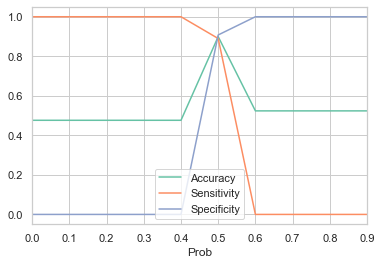

In [177]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
m1_ab_cut_df.plot.line(x='Prob', y=['Accuracy','Sensitivity','Specificity'])
plt.show()

In [178]:
# Precision-Recall is a useful measure of success of prediction when the classes are very imbalanced.
# The precision-recall curve shows the tradeoff between precision and recall for different threshold. 
# A high area under the curve represents both high recall and high precision, where high precision relates 
# to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), 
# as well as returning a majority of all positive results (high recall).

p, r, thresholds = metrics.precision_recall_curve(m1_trn_df.Churn, m1_trn_df.AB_Pred_Prob)

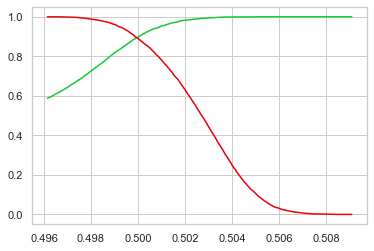

In [179]:
# Plot Precision - Recall Curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [180]:
m1_ab_cut = 0.495
m1_trn_df["AB_Final_Pred"] = m1_trn_df.AB_Pred_Prob.map(lambda x: 1 if x > m1_ab_cut else 0)
m1_trn_df.head()

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR,LR_Final_Pred,RF_Pred_Prob,0.0_RF,0.1_RF,0.2_RF,0.3_RF,0.4_RF,0.5_RF,0.6_RF,0.7_RF,0.8_RF,0.9_RF,RF_Final_Pred,AB_Pred_Prob,0.0_AB,0.1_AB,0.2_AB,0.3_AB,0.4_AB,0.5_AB,0.6_AB,0.7_AB,0.8_AB,0.9_AB,AB_Final_Pred
0,0,0,0.025591,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0,0.497236,1,1,1,1,1,0,0,0,0,0,1
1,1,0,0.068897,1,0,0,0,0,0,0,0,0,0,0,0.00,0,0,0,0,0,0,0,0,0,0,0,0.495574,1,1,1,1,1,0,0,0,0,0,1
2,2,0,0.094004,1,0,0,0,0,0,0,0,0,0,0,0.09,1,0,0,0,0,0,0,0,0,0,0,0.498695,1,1,1,1,1,0,0,0,0,0,1
3,3,0,0.087938,1,0,0,0,0,0,0,0,0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0,0.496106,1,1,1,1,1,0,0,0,0,0,1
4,4,0,0.211660,1,1,1,0,0,0,0,0,0,0,1,0.01,1,0,0,0,0,0,0,0,0,0,0,0.497672,1,1,1,1,1,0,0,0,0,0,1


Accuracy= 0.5938531587933978,

Sensitivity = 1.0,

Specificity = 0.22462875769648677,

FPR = 0.7753712423035132,

Precision = 0.5396920959834867,

NPV = 1.0,

F1 Score = 0.7010389900569769


(2.5, -0.5)

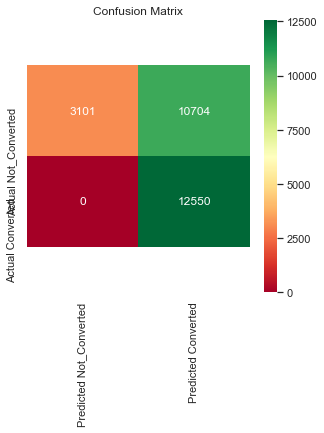

In [181]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m1_trn_df.Churn,m1_trn_df["AB_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m1_trn_df.Churn,m1_trn_df["AB_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [182]:
# Print Classification Report
print(classification_report(m1_trn_df.Churn,m1_trn_df["AB_Final_Pred"]))

              precision    recall  f1-score   support

           0       1.00      0.22      0.37     13805
           1       0.54      1.00      0.70     12550

    accuracy                           0.59     26355
   macro avg       0.77      0.61      0.53     26355
weighted avg       0.78      0.59      0.53     26355



### Append the results to DF

In [183]:
# Append the results to DF
res = logr_metrics(m1_trn_df.Churn,m1_trn_df["AB_Final_Pred"])
r_df["PCA_AB_Train"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039


### Apply the Model on the test set

In [184]:
# Predict the Probabilities
my1_rf_test_pred_prob =  m1_pc_rf.predict_proba(pca_m1_tst)[:,1]

# inspect the probabilities
display(my1_rf_test_pred_prob)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished


array([0.15, 0.07, 0.11, ..., 0.01, 0.33, 0.28])

In [185]:
m1_tst_df["AB_Pred_Prob"] = my1_rf_test_pred_prob
m1_tst_df

,Index,Churn,LR_Pred_Prob,LR_Final_Pred,RF_Pred_Prob,RF_Final_Pred,AB_Pred_Prob
0,48098,0,1.988466e-03,0,0.15,0,0.15
1,69125,0,3.607145e-07,0,0.07,0,0.07
2,12043,0,2.590414e-02,0,0.11,0,0.11
3,39055,0,1.220831e-01,1,0.04,0,0.04
4,37250,0,3.523836e-01,1,0.23,0,0.23
5,84256,0,2.648509e-01,1,0.18,0,0.18
6,30725,0,1.389897e-01,1,0.22,0,0.22
7,4204,0,1.762583e-01,1,0.09,0,0.09
8,94017,0,6.808490e-01,1,0.25,0,0.25
9,8180,0,5.135344e-02,0,0.15,0,0.15


In [186]:
m1_tst_df["AB_Final_Pred"] = m1_tst_df.AB_Pred_Prob.map(lambda x: 1 if x > m1_rf_cut else 0)
m1_tst_df.head()

,Index,Churn,LR_Pred_Prob,LR_Final_Pred,RF_Pred_Prob,RF_Final_Pred,AB_Pred_Prob,AB_Final_Pred
0,48098,0,1.988466e-03,0,0.15,0,0.15,0
1,69125,0,3.607145e-07,0,0.07,0,0.07,0
2,12043,0,2.590414e-02,0,0.11,0,0.11,0
3,39055,0,1.220831e-01,1,0.04,0,0.04,0
4,37250,0,3.523836e-01,1,0.23,0,0.23,0


Accuracy= 0.8099891422366993,

Sensitivity = 0.7291666666666666,

Specificity = 0.8160248930377285,

FPR = 0.18397510696227148,

Precision = 0.22838499184339314,

NPV = 0.9758139534883721,

F1 Score = 0.3478260869565218


(2.5, -0.5)

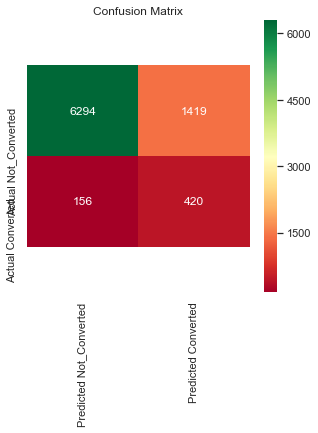

In [187]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m1_tst_df.Churn,m1_tst_df["AB_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m1_tst_df.Churn,m1_tst_df["AB_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [188]:
print(classification_report(m1_tst_df.Churn,m1_tst_df["AB_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.98      0.82      0.89      7713
           1       0.23      0.73      0.35       576

    accuracy                           0.81      8289
   macro avg       0.60      0.77      0.62      8289
weighted avg       0.92      0.81      0.85      8289



### Append the results to DF

In [189]:
# Append the results to DF
res = logr_metrics(m1_tst_df.Churn,m1_tst_df["AB_Final_Pred"])
r_df["PCA_AB_Test"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826


# Part 2 - ML Modelling without PCA

## Build the Model using Stats Model Logistic Regression Classifier

In [190]:
#VIF computation function
def vif_calc(l_df):
    vif = pd.DataFrame()
    vif['Features'] = l_df.columns
    vif['VIF'] = [variance_inflation_factor(l_df.values, i) for i in range(l_df.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False).reset_index(drop=True)
    display(vif)

In [191]:
# Logistic Regression Model
log_m1 = sm.GLM(y1_train,(sm.add_constant(X1_train)),family = sm.families.Binomial())
log_m1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26203
Model Family:                Binomial   Df Model:                          151
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:15:47   Pearson chi2:                 1.26e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     7.863e+14   4.13e+05    1.9e+09      0.000    7.86e+14    7.86e+14
arpu_6                   -1.608e+13   1.72e+06  -9.35e+06      0.000   -1.61e+13   -1.61e+13
arpu_7                   -8.736e+13   1.86e+06  -4.69e+07      0.000   -8.74e+13   -8.74e+13
arpu_8                    5.736e+13   2.04e+06   2.81e+07      0.000    5.74e+13    5.74e+13
onnet_mou_6               3.386e+15   5.86e+07   5.78e+07      0.000    3.39e+15    3.39e+15
onnet_mou_7              -3.169e+14    4.8e+07   -6.6e+06      0.000   -3.17e+14   -3.17e+14
onnet_mou_8              -3.041e+15   2.86e+07  -1.06e+08      0.000   -3.04e+15   -3.04e+15
offnet_mou_6               4.16e+15   5.99e+07   6.95e+07      0.000    4.16e+15    4.16e+15
offnet_mou_7             -6.074e+14   5.03e+07  -1.21e+07      0.000   -6.07e+14   -6.07e+14
offnet_mou_8             -3.238e+15   2.88e+07  -1.13e+08      0.000   -3.24e+15   -3.24e+15
roam_ic_mou_6            -7.856e+12   6.75e+05  -1.16e+07      0.000   -7.86e+12   -7.86e+12
roam_ic_mou_7             4.993e+13   7.73e+05   6.46e+07      0.000    4.99e+13    4.99e+13
roam_ic_mou_8            -1.788e+13   6.83e+05  -2.62e+07      0.000   -1.79e+13   -1.79e+13
roam_og_mou_6            -8.181e+14   1.21e+07  -6.77e+07      0.000   -8.18e+14   -8.18e+14
roam_og_mou_7             4.857e+13   9.42e+06   5.15e+06      0.000    4.86e+13    4.86e+13
roam_og_mou_8             7.804e+14    6.6e+06   1.18e+08      0.000     7.8e+14     7.8e+14
loc_og_t2t_mou_6          9.077e+17    1.3e+10   6.96e+07      0.000    9.08e+17    9.08e+17
loc_og_t2t_mou_7          7.392e+17   1.38e+10   5.36e+07      0.000    7.39e+17    7.39e+17
loc_og_t2t_mou_8         -4.025e+17   1.24e+10  -3.25e+07      0.000   -4.03e+17   -4.03e+17
loc_og_t2m_mou_6           1.19e+18   1.71e+10   6.96e+07      0.000    1.19e+18    1.19e+18
loc_og_t2m_mou_7          8.875e+17   1.66e+10   5.36e+07      0.000    8.88e+17    8.88e+17
loc_og_t2m_mou_8         -5.267e+17   1.62e+10  -3.25e+07      0.000   -5.27e+17   -5.27e+17
loc_og_t2f_mou_6          8.729e+16   1.25e+09   6.96e+07      0.000    8.73e+16    8.73e+16
loc_og_t2f_mou_7          6.577e+16   1.23e+09   5.35e+07      0.000    6.58e+16    6.58e+16
loc_og_t2f_mou_8         -3.727e+16   1.15e+09  -3.25e+07      0.000   -3.73e+16   -3.73e+16
loc_og_t2c_mou_6         -2.458e+13   4.85e+05  -5.07e+07      0.000   -2.46e+13   -2.46e+13
loc_og_t2c_mou_7         -2.304e+13   5.39e+05  -4.28e+07      0.000    -2.3e+13    -2.3e+13
loc_og_t2c_mou_8          3.526e+13   5.15e+05   6.84e+07      0.000    3.53e+13    3.53e+13
loc_og_mou_6             -2.912e+18   3.05e+10  -9.54e+07      0.000   -2.91e+18   -2.91e+18
loc_og_mou_7             -9.293e+17    3.2e+10   -2.9e+07      0.000   -9.29e+17   -9.29e+17
loc_og_mou_8  

In [192]:
# Running RFE with the output number of the variable equal to 30
log_rfe = LogisticRegression()

rfe = RFE(log_rfe, 30)             # running RFE
rfe = rfe.fit(X1_train, y1_train)

In [193]:
# display the features created using RFE 
print(list(zip(X1_train.columns,rfe.support_,rfe.ranking_)))

[('arpu_6', False, 47), ('arpu_7', False, 101), ('arpu_8', False, 97), ('onnet_mou_6', False, 34), ('onnet_mou_7', False, 118), ('onnet_mou_8', False, 62), ('offnet_mou_6', False, 83), ('offnet_mou_7', False, 121), ('offnet_mou_8', False, 6), ('roam_ic_mou_6', False, 86), ('roam_ic_mou_7', False, 59), ('roam_ic_mou_8', False, 78), ('roam_og_mou_6', False, 114), ('roam_og_mou_7', False, 18), ('roam_og_mou_8', False, 7), ('loc_og_t2t_mou_6', False, 106), ('loc_og_t2t_mou_7', False, 96), ('loc_og_t2t_mou_8', False, 32), ('loc_og_t2m_mou_6', False, 35), ('loc_og_t2m_mou_7', False, 95), ('loc_og_t2m_mou_8', False, 112), ('loc_og_t2f_mou_6', False, 108), ('loc_og_t2f_mou_7', False, 60), ('loc_og_t2f_mou_8', False, 61), ('loc_og_t2c_mou_6', False, 79), ('loc_og_t2c_mou_7', False, 53), ('loc_og_t2c_mou_8', False, 52), ('loc_og_mou_6', False, 76), ('loc_og_mou_7', False, 55), ('loc_og_mou_8', False, 69), ('std_og_t2t_mou_6', False, 2), ('std_og_t2t_mou_7', False, 54), ('std_og_t2t_mou_8', False

In [194]:
# create a list of 30 columns created using RFE
rfe_cols = X1_train.columns[rfe.support_]
display(rfe_cols)


Index(['og_others_8', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_mou_7',
       'loc_ic_mou_8', 'date_of_last_rech_8', 'total_rech_data_6',
       'total_rech_data_7', 'total_rech_data_8', 'max_rech_data_8',
       'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
       'av_rech_amt_data_6', 'arpu_2g_6', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8'],
      dtype='object')

In [195]:
# Create a new df with only columns selected by RFE
X1_train_ref = X1_train[rfe_cols]

# Inspect the DF
display(X1_train_ref.head())

,og_others_8,total_og_mou_7,total_og_mou_8,loc_ic_mou_7,loc_ic_mou_8,date_of_last_rech_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,arpu_2g_6,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8
0,-0.010392,-0.159386,0.211049,1.333359,2.093860,0.683983,-0.584977,-0.596848,-0.490239,-0.580907,-0.501835,-0.515035,-0.442921,-0.356623,-0.357578,-0.288712,-0.654035,-0.390454,-0.370933,-0.374629,-0.330222,-0.417121,-0.432031,-0.364908,-0.286785,-0.288914,-0.27561,-0.201160,-0.209259,-0.156528
1,-0.010392,-0.684960,-0.230087,0.171362,0.828313,2.355808,-0.219744,-0.252996,-0.110648,1.102362,-0.093533,-0.128672,0.006822,-0.356623,-0.357578,-0.288712,0.286766,-0.303394,2.210639,2.186549,2.523252,-0.417121,-0.432031,-0.364908,-0.286785,-0.288914,-0.27561,-0.201160,-0.209259,-0.156528
2,-0.010392,-0.093701,0.137237,0.648172,0.864568,-0.244809,-0.584977,-0.596848,-0.490239,-0.580907,-0.501835,-0.515035,-0.442921,-0.356623,-0.357578,-0.288712,-0.654035,-0.390454,-0.370933,-0.374629,-0.330222,-0.417121,-0.432031,-0.364908,-0.286785,-0.288914,-0.27561,-0.201160,-0.209259,-0.156528
3,-0.010392,-0.847602,-0.598228,0.295506,-0.111155,0.498224,0.510723,-0.252996,0.268942,1.102362,0.314770,-0.128672,0.456564,0.600559,-0.357578,-0.288712,1.966769,0.185982,2.210639,2.186549,5.376726,0.000999,-0.432031,-0.364908,-0.286785,-0.288914,-0.27561,0.987003,-0.209259,-0.156528
4,-0.010392,-0.952005,-0.763084,-0.647439,-0.517389,-0.802084,3.432588,3.529382,3.685257,-0.307649,3.989491,4.121321,4.504246,-0.356623,-0.357578,-0.288712,1.025967,-0.308266,-0.370933,-0.374629,-0.330222,4.182206,4.290886,4.641184,-0.286785,-0.288914,-0.27561,-0.201160,-0.209259,-0.156528


In [196]:
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26327
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:16:47   Pearson chi2:                 1.54e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                    3e+13   4.13e+05   7.26e+07      0.000       3e+13       3e+13
og_others_8         -3.649e+13   4.13e+05  -8.82e+07      0.000   -3.65e+13   -3.65e+13
total_og_mou_7       4.479e+14   6.09e+05   7.36e+08      0.000    4.48e+14    4.48e+14
total_og_mou_8      -4.944e+14   6.07e+05  -8.15e+08      0.000   -4.94e+14   -4.94e+14
loc_ic_mou_7         1.869e+14   7.72e+05   2.42e+08      0.000    1.87e+14    1.87e+14
loc_ic_mou_8        -7.216e+14   8.03e+05  -8.99e+08      0.000   -7.22e+14   -7.22e+14
date_of_last_rech_8  1.558e+14   4.48e+05   3.48e+08      0.000    1.56e+14    1.56e+14
total_rech_data_6    2.749e+15   2.58e+06   1.07e+09      0.000    2.75e+15    2.75e+15
total_rech_data_7    2.339e+15   2.71e+06   8.63e+08      0.000    2.34e+15    2.34e+15
total_rech_data_8    3.177e+15   2.48e+06   1.28e+09      0.000    3.18e+15    3.18e+15
max_rech_data_8      -9.18e+13   7.23e+05  -1.27e+08      0.000   -9.18e+13   -9.18e+13
count_rech_2g_6      2.721e+15   3.44e+06   7.91e+08      0.000    2.72e+15    2.72e+15
count_rech_2g_7      2.205e+15   3.64e+06   6.06e+08      0.000    2.21e+15    2.21e+15
count_rech_2g_8      3.608e+15   3.47e+06   1.04e+09      0.000    3.61e+15    3.61e+15
count_rech_3g_6      8.265e+14   2.79e+06   2.96e+08      0.000    8.27e+14    8.27e+14
count_rech_3g_7      9.708e+14   2.98e+06   3.26e+08      0.000    9.71e+14    9.71e+14
count_rech_3g_8      3.272e+14   3.54e+06   9.24e+07      0.000    3.27e+14    3.27e+14
av_rech_amt_data_6   -9.15e+13   1.19e+06  -7.67e+07      0.000   -9.15e+13   -9.15e+13
arpu_2g_6            3.241e+13   1.35e+06   2.39e+07      0.000    3.24e+13    3.24e+13
monthly_2g_6        -8.156e+14   1.09e+06  -7.47e+08      0.000   -8.16e+14   -8.16e+14
monthly_2g_7        -6.851e+14   1.05e+06  -6.55e+08      0.000   -6.85e+14   -6.85e+14
monthly_2g_8        -9.431e+14   1.02e+06   -9.2e+08      0.000   -9.43e+14   -9.43e+14
sachet_2g_6         -5.063e+15   5.61e+06  -9.02e+08      0.000   -5.06e+15   -5.06e+15
sachet_2g_7         -4.276e+15   5.95e+06  -7.18e+08      0.000   -4.28e+15   -4.28e+15
sachet_2g_8         -6.265e+15   5.37e+06  -1.17e+09      0.000   -6.27e+15   -6.27e+15
monthly_3g_6        -9.086e+14    1.4e+06  -6.49e+08      0.000   -9.09e+14   -9.09e+14
monthly_3g_7         -9.44e+14   1.51e+06  -6.27e+08      0.000   -9.44e+14   -9.44e+14
monthly_3g_8         -7.48e+14   1.75e+06  -4.27e+08      0.000   -7.48e+14   -7.48e+14
sachet_3g_6         -1.509e+15   2.17e+06  -6.94e+08      0.000   -1.51e+15   -1.51e+15
sachet_3g_7         -1.531e+15   2.44e+06  -6.28e+08      0.000   -1.53e+15   -1.53e+15
sachet_3g_8         -1.444e+15   3.11e+06  -4.65e+08      0.000   -1.44e+15   -1.44e+15
=======================================================================================
"""

,Features,VIF
0,sachet_2g_7,207.37
1,sachet_2g_6,184.18
2,sachet_2g_8,168.61
3,sachet_3g_8,56.46
4,sachet_3g_7,34.79
5,sachet_3g_6,27.66
6,monthly_3g_8,17.98
7,monthly_3g_7,13.26
8,monthly_3g_6,11.47
9,arpu_2g_6,10.72


In [197]:
# ### Drop the columns based on below thumb rules

# * Significance levels and VIF are 2 important things that will make us in deciding to drop our features
#   - High P-Value(above 0.05) and High VIF(above 5%)__ - They can be dropped 
#   - Low P-Value(below 0.05) and Low VIF(below 5%)__ - They can be retained

# #### Dropping  column sachet_2g_7

# In[112]:


X1_train_ref = X1_train_ref.drop("sachet_2g_7",axis=1)
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26328
Model Family:                Binomial   Df Model:                           26
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:16:53   Pearson chi2:                 8.21e+05
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                6.326e+04    1.7e+05      0.371      0.710   -2.71e+05    3.97e+05
og_others_8           -27.0533     15.974     -1.694      0.090     -58.363       4.256
total_og_mou_7          1.2139      0.051     23.631      0.000       1.113       1.315
total_og_mou_8         -1.5777      0.053    -29.569      0.000      -1.682      -1.473
loc_ic_mou_7            0.7435      0.072     10.350      0.000       0.603       0.884
loc_ic_mou_8           -3.3053      0.114    -28.978      0.000      -3.529      -3.082
date_of_last_rech_8     0.5612      0.028     19.771      0.000       0.506       0.617
total_rech_data_6     3.25e+05   2.23e+06      0.145      0.884   -4.05e+06     4.7e+06
total_rech_data_7    1231.3020   3.73e+05      0.003      0.997   -7.31e+05    7.33e+05
total_rech_data_8    5.538e+05   2.25e+06      0.246      0.806   -3.86e+06    4.97e+06
max_rech_data_8        -1.1189      0.101    -11.070      0.000      -1.317      -0.921
count_rech_2g_6      4.123e+05   2.97e+06      0.139      0.890   -5.41e+06    6.24e+06
count_rech_2g_7     -1095.9828   3.32e+05     -0.003      0.997   -6.53e+05     6.5e+05
count_rech_2g_8      7.623e+05   3.11e+06      0.245      0.807   -5.34e+06    6.86e+06
count_rech_3g_6     -1.148e+05   2.02e+06     -0.057      0.955   -4.07e+06    3.84e+06
count_rech_3g_7      5698.0306   1.73e+06      0.003      0.997   -3.38e+06    3.39e+06
count_rech_3g_8     -2.221e+05   1.25e+06     -0.177      0.859   -2.68e+06    2.24e+06
av_rech_amt_data_6     -0.7554      0.110     -6.863      0.000      -0.971      -0.540
arpu_2g_6               0.3863      0.106      3.628      0.000       0.178       0.595
monthly_2g_6        -1.112e+05    7.8e+05     -0.143      0.887   -1.64e+06    1.42e+06
monthly_2g_7           -0.1952      0.040     -4.911      0.000      -0.273      -0.117
monthly_2g_8        -1.938e+05   7.89e+05     -0.246      0.806   -1.74e+06    1.35e+06
sachet_2g_6         -6.865e+05   4.81e+06     -0.143      0.887   -1.01e+07    8.75e+06
sachet_2g_8         -1.215e+06   4.94e+06     -0.246      0.806   -1.09e+07    8.48e+06
monthly_3g_6        -4487.2192   8.84e+05     -0.005      0.996   -1.74e+06    1.73e+06
monthly_3g_7        -2965.2572   8.99e+05     -0.003      0.997   -1.77e+06    1.76e+06
monthly_3g_8         -543.7510    4.3e+05     -0.001      0.999   -8.44e+05    8.43e+05
sachet_3g_6         -7452.8848   1.47e+06     -0.005      0.996   -2.89e+06    2.87e+06
sachet_3g_7         -4985.4770   1.51e+06     -0.003      0.997   -2.97e+06    2.96e+06
sachet_3g_8          -978.2026   7.74e+05     -0.001      0.999   -1.52e+06    1.52e+06
=======================================================================================
"""

,Features,VIF
0,sachet_2g_6,165.39
1,sachet_2g_8,156.24
2,sachet_3g_8,56.42
3,sachet_3g_7,34.13
4,sachet_3g_6,27.65
5,monthly_3g_8,17.97
6,monthly_3g_7,13.02
7,monthly_3g_6,11.46
8,arpu_2g_6,10.72
9,av_rech_amt_data_6,8.33


In [198]:
# #### Dropping  column sachet_2g_6

# In[113]:


X1_train_ref = X1_train_ref.drop("sachet_2g_6",axis=1)
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26329
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:16:58   Pearson chi2:                 2.29e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                5.427e+04   1.48e+05      0.368      0.713   -2.35e+05    3.43e+05
og_others_8           -29.2145     17.171     -1.701      0.089     -62.869       4.440
total_og_mou_7          1.2378      0.050     24.652      0.000       1.139       1.336
total_og_mou_8         -1.6189      0.053    -30.797      0.000      -1.722      -1.516
loc_ic_mou_7            0.6684      0.070      9.557      0.000       0.531       0.806
loc_ic_mou_8           -3.2754      0.110    -29.862      0.000      -3.490      -3.060
date_of_last_rech_8     0.5758      0.028     20.850      0.000       0.522       0.630
total_rech_data_6    1718.7611   3.55e+05      0.005      0.996   -6.93e+05    6.97e+05
total_rech_data_7    1213.9118   3.57e+05      0.003      0.997   -6.99e+05    7.02e+05
total_rech_data_8    7.954e+05   2.01e+06      0.395      0.693   -3.15e+06    4.74e+06
max_rech_data_8        -1.1552      0.100    -11.578      0.000      -1.351      -0.960
count_rech_2g_6     -1537.1425   3.17e+05     -0.005      0.996   -6.23e+05     6.2e+05
count_rech_2g_7     -1080.4157   3.18e+05     -0.003      0.997   -6.25e+05    6.22e+05
count_rech_2g_8      1.095e+06   2.78e+06      0.393      0.694   -4.36e+06    6.55e+06
count_rech_3g_6      8107.9551   1.67e+06      0.005      0.996   -3.27e+06    3.29e+06
count_rech_3g_7      5617.3525   1.65e+06      0.003      0.997   -3.24e+06    3.25e+06
count_rech_3g_8     -3.196e+05   1.17e+06     -0.273      0.785   -2.62e+06    1.98e+06
av_rech_amt_data_6     -0.7488      0.104     -7.231      0.000      -0.952      -0.546
arpu_2g_6               0.4150      0.103      4.038      0.000       0.214       0.616
monthly_2g_6            0.0777      0.047      1.650      0.099      -0.015       0.170
monthly_2g_7           -0.1892      0.037     -5.147      0.000      -0.261      -0.117
monthly_2g_8        -2.784e+05   7.04e+05     -0.395      0.693   -1.66e+06     1.1e+06
sachet_2g_8         -1.746e+06   4.42e+06     -0.395      0.693   -1.04e+07    6.91e+06
monthly_3g_6        -4250.7861   8.77e+05     -0.005      0.996   -1.72e+06    1.71e+06
monthly_3g_7        -2923.3244   8.61e+05     -0.003      0.997   -1.69e+06    1.68e+06
monthly_3g_8         -542.6974   4.18e+05     -0.001      0.999    -8.2e+05    8.18e+05
sachet_3g_6         -7060.1416   1.46e+06     -0.005      0.996   -2.86e+06    2.85e+06
sachet_3g_7         -4914.9437   1.45e+06     -0.003      0.997   -2.84e+06    2.83e+06
sachet_3g_8          -976.3012   7.52e+05     -0.001      0.999   -1.47e+06    1.47e+06
=======================================================================================
"""

,Features,VIF
0,sachet_2g_8,138.63
1,sachet_3g_8,56.36
2,sachet_3g_7,34.05
3,sachet_3g_6,27.01
4,monthly_3g_8,17.96
5,monthly_3g_7,12.98
6,monthly_3g_6,11.21
7,arpu_2g_6,10.72
8,av_rech_amt_data_6,8.33
9,monthly_2g_8,5.42


In [199]:
# #### Dropping  column sachet_2g_8

# In[114]:


X1_train_ref = X1_train_ref.drop("sachet_2g_8",axis=1)
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26330
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:17:03   Pearson chi2:                 1.38e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                3759.2969   1.25e+05      0.030      0.976   -2.41e+05    2.49e+05
og_others_8            -3.9734      2.995     -1.327      0.185      -9.843       1.897
total_og_mou_7          1.2737      0.046     27.613      0.000       1.183       1.364
total_og_mou_8         -1.5770      0.048    -32.564      0.000      -1.672      -1.482
loc_ic_mou_7            0.6865      0.065     10.586      0.000       0.559       0.814
loc_ic_mou_8           -3.1189      0.098    -31.841      0.000      -3.311      -2.927
date_of_last_rech_8     0.5978      0.026     22.953      0.000       0.547       0.649
total_rech_data_6    3063.4891   4.43e+05      0.007      0.994   -8.64e+05     8.7e+05
total_rech_data_7    1.147e+04   5.07e+05      0.023      0.982   -9.81e+05       1e+06
total_rech_data_8     206.6233   2612.397      0.079      0.937   -4913.581    5326.828
max_rech_data_8        -0.9135      0.087    -10.486      0.000      -1.084      -0.743
count_rech_2g_6     -2740.0676   3.96e+05     -0.007      0.994   -7.79e+05    7.73e+05
count_rech_2g_7     -1.021e+04   4.51e+05     -0.023      0.982   -8.94e+05    8.73e+05
count_rech_2g_8      -175.0471   2204.909     -0.079      0.937   -4496.590    4146.496
count_rech_3g_6      1.445e+04   2.09e+06      0.007      0.994   -4.08e+06    4.11e+06
count_rech_3g_7      5.307e+04   2.34e+06      0.023      0.982   -4.54e+06    4.65e+06
count_rech_3g_8       878.9053   1.11e+04      0.079      0.937   -2.09e+04    2.26e+04
av_rech_amt_data_6     -0.6674      0.092     -7.282      0.000      -0.847      -0.488
arpu_2g_6               0.3482      0.094      3.708      0.000       0.164       0.532
monthly_2g_6            0.0927      0.041      2.249      0.024       0.012       0.173
monthly_2g_7           -0.1847      0.032     -5.714      0.000      -0.248      -0.121
monthly_2g_8           -0.0782      0.057     -1.368      0.171      -0.190       0.034
monthly_3g_6        -7576.8680   1.09e+06     -0.007      0.994   -2.15e+06    2.14e+06
monthly_3g_7        -2.762e+04   1.22e+06     -0.023      0.982   -2.42e+06    2.36e+06
monthly_3g_8         -454.4543   5732.996     -0.079      0.937   -1.17e+04    1.08e+04
sachet_3g_6         -1.258e+04   1.82e+06     -0.007      0.994   -3.58e+06    3.55e+06
sachet_3g_7         -4.643e+04   2.05e+06     -0.023      0.982   -4.07e+06    3.97e+06
sachet_3g_8          -817.3238   1.03e+04     -0.079      0.937    -2.1e+04    1.94e+04
=======================================================================================
"""

,Features,VIF
0,sachet_3g_8,55.51
1,sachet_3g_7,33.84
2,sachet_3g_6,26.72
3,monthly_3g_8,17.69
4,monthly_3g_7,12.90
5,monthly_3g_6,11.12
6,arpu_2g_6,10.72
7,av_rech_amt_data_6,8.33
8,loc_ic_mou_8,3.76
9,loc_ic_mou_7,3.49


In [200]:
# #### Dropping  column sachet_3g_8
X1_train_ref = X1_train_ref.drop("sachet_3g_8",axis=1)
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26331
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:17:08   Pearson chi2:                 4.79e+05
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                3720.8373   1.25e+05      0.030      0.976   -2.42e+05    2.49e+05
og_others_8            -4.1785      3.041     -1.374      0.169     -10.138       1.781
total_og_mou_7          1.2076      0.045     27.117      0.000       1.120       1.295
total_og_mou_8         -1.4949      0.046    -32.200      0.000      -1.586      -1.404
loc_ic_mou_7            0.7522      0.062     12.069      0.000       0.630       0.874
loc_ic_mou_8           -3.1802      0.095    -33.347      0.000      -3.367      -2.993
date_of_last_rech_8     0.5921      0.025     23.477      0.000       0.543       0.642
total_rech_data_6    3117.2533   4.44e+05      0.007      0.994   -8.68e+05    8.74e+05
total_rech_data_7    1.135e+04   5.06e+05      0.022      0.982   -9.81e+05       1e+06
total_rech_data_8      -0.3673      0.025    -14.932      0.000      -0.415      -0.319
max_rech_data_8        -0.4836      0.076     -6.393      0.000      -0.632      -0.335
count_rech_2g_6     -2788.1490   3.97e+05     -0.007      0.994   -7.82e+05    7.76e+05
count_rech_2g_7      -1.01e+04    4.5e+05     -0.022      0.982   -8.93e+05    8.73e+05
count_rech_2g_8        -0.3799      0.029    -13.160      0.000      -0.437      -0.323
count_rech_3g_6      1.471e+04    2.1e+06      0.007      0.994   -4.09e+06    4.12e+06
count_rech_3g_7      5.253e+04   2.34e+06      0.022      0.982   -4.54e+06    4.64e+06
count_rech_3g_8        -0.1155      0.069     -1.683      0.092      -0.250       0.019
av_rech_amt_data_6     -0.8007      0.088     -9.120      0.000      -0.973      -0.629
arpu_2g_6               0.3916      0.091      4.319      0.000       0.214       0.569
monthly_2g_6            0.1175      0.040      2.937      0.003       0.039       0.196
monthly_2g_7           -0.1861      0.031     -5.929      0.000      -0.248      -0.125
monthly_2g_8           -0.2874      0.054     -5.291      0.000      -0.394      -0.181
monthly_3g_6        -7709.7490    1.1e+06     -0.007      0.994   -2.16e+06    2.15e+06
monthly_3g_7        -2.734e+04   1.22e+06     -0.022      0.982   -2.42e+06    2.36e+06
monthly_3g_8           -0.6672      0.102     -6.547      0.000      -0.867      -0.467
sachet_3g_6         -1.281e+04   1.82e+06     -0.007      0.994   -3.59e+06    3.56e+06
sachet_3g_7         -4.596e+04   2.05e+06     -0.022      0.982   -4.06e+06    3.97e+06
=======================================================================================
"""

,Features,VIF
0,sachet_3g_7,30.62
1,sachet_3g_6,26.09
2,monthly_3g_7,11.97
3,monthly_3g_6,10.94
4,arpu_2g_6,10.72
5,av_rech_amt_data_6,8.30
6,loc_ic_mou_8,3.75
7,loc_ic_mou_7,3.48
8,monthly_3g_8,3.15
9,max_rech_data_8,2.94


In [201]:
# #### Dropping  column sachet_3g_7

X1_train_ref = X1_train_ref.drop("sachet_3g_7",axis=1)
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26332
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:17:12   Pearson chi2:                 1.33e+05
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                 931.5160    1.1e+05      0.008      0.993   -2.14e+05    2.16e+05
og_others_8            -4.9294      3.326     -1.482      0.138     -11.448       1.589
total_og_mou_7          1.1696      0.043     27.058      0.000       1.085       1.254
total_og_mou_8         -1.4845      0.045    -32.928      0.000      -1.573      -1.396
loc_ic_mou_7            0.7695      0.060     12.739      0.000       0.651       0.888
loc_ic_mou_8           -3.1696      0.092    -34.628      0.000      -3.349      -2.990
date_of_last_rech_8     0.5833      0.024     24.191      0.000       0.536       0.631
total_rech_data_6    3297.6487   3.88e+05      0.008      0.993   -7.57e+05    7.64e+05
total_rech_data_7       0.1108      0.018      6.176      0.000       0.076       0.146
total_rech_data_8      -0.3656      0.021    -17.259      0.000      -0.407      -0.324
max_rech_data_8        -0.2938      0.063     -4.687      0.000      -0.417      -0.171
count_rech_2g_6     -2949.5244   3.47e+05     -0.008      0.993   -6.83e+05    6.77e+05
count_rech_2g_7         0.0526      0.023      2.256      0.024       0.007       0.098
count_rech_2g_8        -0.3721      0.026    -14.375      0.000      -0.423      -0.321
count_rech_3g_6      1.556e+04   1.83e+06      0.008      0.993   -3.57e+06     3.6e+06
count_rech_3g_7         0.1651      0.045      3.684      0.000       0.077       0.253
count_rech_3g_8        -0.1280      0.055     -2.316      0.021      -0.236      -0.020
av_rech_amt_data_6     -0.8040      0.082     -9.844      0.000      -0.964      -0.644
arpu_2g_6               0.4423      0.084      5.296      0.000       0.279       0.606
monthly_2g_6            0.1291      0.037      3.501      0.000       0.057       0.201
monthly_2g_7           -0.1541      0.029     -5.343      0.000      -0.211      -0.098
monthly_2g_8           -0.3498      0.047     -7.425      0.000      -0.442      -0.257
monthly_3g_6        -8155.9572    9.6e+05     -0.008      0.993   -1.89e+06    1.87e+06
monthly_3g_7           -0.2192      0.051     -4.315      0.000      -0.319      -0.120
monthly_3g_8           -0.8476      0.090     -9.462      0.000      -1.023      -0.672
sachet_3g_6         -1.355e+04   1.59e+06     -0.008      0.993   -3.14e+06    3.11e+06
=======================================================================================
"""

,Features,VIF
0,sachet_3g_6,21.37
1,arpu_2g_6,10.71
2,monthly_3g_6,9.54
3,av_rech_amt_data_6,8.30
4,loc_ic_mou_8,3.74
5,loc_ic_mou_7,3.48
6,monthly_3g_8,3.15
7,max_rech_data_8,2.94
8,monthly_3g_7,2.91
9,monthly_2g_6,2.27


In [202]:
# #### Dropping  column sachet_3g_6

X1_train_ref = X1_train_ref.drop("sachet_3g_6",axis=1)
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26333
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:17:16   Pearson chi2:                 5.98e+04
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.6476      0.038    -17.213      0.000      -0.721      -0.574
og_others_8            -6.6983      2.865     -2.338      0.019     -12.314      -1.082
total_og_mou_7          1.2008      0.042     28.891      0.000       1.119       1.282
total_og_mou_8         -1.5224      0.044    -34.979      0.000      -1.608      -1.437
loc_ic_mou_7            0.7622      0.054     14.004      0.000       0.656       0.869
loc_ic_mou_8           -2.8166      0.079    -35.716      0.000      -2.971      -2.662
date_of_last_rech_8     0.5744      0.022     26.316      0.000       0.532       0.617
total_rech_data_6       0.0563      0.016      3.543      0.000       0.025       0.087
total_rech_data_7       0.1054      0.016      6.781      0.000       0.075       0.136
total_rech_data_8      -0.3224      0.016    -20.537      0.000      -0.353      -0.292
max_rech_data_8        -0.5172      0.045    -11.484      0.000      -0.605      -0.429
count_rech_2g_6         0.1127      0.020      5.719      0.000       0.074       0.151
count_rech_2g_7         0.0525      0.020      2.570      0.010       0.012       0.092
count_rech_2g_8        -0.3537      0.021    -16.584      0.000      -0.395      -0.312
count_rech_3g_6        -0.1166      0.033     -3.547      0.000      -0.181      -0.052
count_rech_3g_7         0.1517      0.034      4.449      0.000       0.085       0.218
count_rech_3g_8        -0.0593      0.035     -1.701      0.089      -0.128       0.009
av_rech_amt_data_6     -0.3147      0.056     -5.658      0.000      -0.424      -0.206
arpu_2g_6               1.0142      0.064     15.798      0.000       0.888       1.140
monthly_2g_6            0.0211      0.028      0.739      0.460      -0.035       0.077
monthly_2g_7           -0.1051      0.025     -4.207      0.000      -0.154      -0.056
monthly_2g_8           -0.2518      0.036     -7.083      0.000      -0.321      -0.182
monthly_3g_6           -0.6710      0.051    -13.142      0.000      -0.771      -0.571
monthly_3g_7           -0.0211      0.034     -0.613      0.540      -0.088       0.046
monthly_3g_8           -0.5523      0.057     -9.626      0.000      -0.665      -0.440
=======================================================================================
"""

,Features,VIF
0,arpu_2g_6,10.36
1,av_rech_amt_data_6,8.28
2,monthly_3g_6,5.22
3,loc_ic_mou_8,3.73
4,loc_ic_mou_7,3.47
5,monthly_3g_8,3.15
6,max_rech_data_8,2.92
7,monthly_3g_7,2.90
8,monthly_2g_6,2.27
9,total_og_mou_7,2.14


In [203]:
# #### Dropping  column arpu_2g_6

X1_train_ref = X1_train_ref.drop("arpu_2g_6",axis=1)
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26334
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:17:19   Pearson chi2:                 6.03e+04
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.6332      0.036    -17.552      0.000      -0.704      -0.563
og_others_8            -6.2674      2.696     -2.325      0.020     -11.551      -0.984
total_og_mou_7          1.2018      0.041     29.029      0.000       1.121       1.283
total_og_mou_8         -1.5227      0.043    -35.097      0.000      -1.608      -1.438
loc_ic_mou_7            0.7783      0.054     14.486      0.000       0.673       0.884
loc_ic_mou_8           -2.7988      0.078    -35.798      0.000      -2.952      -2.646
date_of_last_rech_8     0.5640      0.022     26.034      0.000       0.522       0.606
total_rech_data_6       0.0220      0.015      1.436      0.151      -0.008       0.052
total_rech_data_7       0.1108      0.015      7.191      0.000       0.081       0.141
total_rech_data_8      -0.3292      0.016    -21.174      0.000      -0.360      -0.299
max_rech_data_8        -0.4842      0.046    -10.624      0.000      -0.573      -0.395
count_rech_2g_6         0.0003      0.018      0.019      0.985      -0.035       0.036
count_rech_2g_7         0.0549      0.020      2.717      0.007       0.015       0.095
count_rech_2g_8        -0.3642      0.021    -17.300      0.000      -0.405      -0.323
count_rech_3g_6         0.0568      0.028      2.002      0.045       0.001       0.112
count_rech_3g_7         0.1599      0.033      4.882      0.000       0.096       0.224
count_rech_3g_8        -0.0541      0.033     -1.626      0.104      -0.119       0.011
av_rech_amt_data_6      0.1994      0.044      4.507      0.000       0.113       0.286
monthly_2g_6           -0.1231      0.027     -4.638      0.000      -0.175      -0.071
monthly_2g_7           -0.1084      0.025     -4.372      0.000      -0.157      -0.060
monthly_2g_8           -0.2782      0.036     -7.760      0.000      -0.348      -0.208
monthly_3g_6           -0.2545      0.041     -6.246      0.000      -0.334      -0.175
monthly_3g_7           -0.0129      0.034     -0.382      0.702      -0.079       0.053
monthly_3g_8           -0.5618      0.056     -9.983      0.000      -0.672      -0.452
=======================================================================================
"""

,Features,VIF
0,av_rech_amt_data_6,4.73
1,monthly_3g_6,3.81
2,loc_ic_mou_8,3.72
3,loc_ic_mou_7,3.47
4,monthly_3g_8,3.14
5,max_rech_data_8,2.90
6,monthly_3g_7,2.90
7,total_og_mou_7,2.14
8,total_og_mou_8,2.13
9,monthly_2g_8,2.05


In [204]:
# #### Dropping  column av_rech_amt_data_6

X1_train_ref = X1_train_ref.drop("av_rech_amt_data_6",axis=1)
# LR Modeling using Statsmodel
X1_train_sm = sm.add_constant(X1_train_ref)
m1_log_sm = sm.GLM(y1_train,X1_train_sm,family=sm.families.Binomial())
m1_log_sm_model = m1_log_sm.fit()
display(m1_log_sm_model.summary())
vif_calc(X1_train_ref)


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26335
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:17:23   Pearson chi2:                 6.18e+04
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.6301      0.043    -14.718      0.000      -0.714      -0.546
og_others_8            -5.9597      3.501     -1.703      0.089     -12.821       0.901
total_og_mou_7          1.1920      0.042     28.439      0.000       1.110       1.274
total_og_mou_8         -1.5253      0.044    -34.709      0.000      -1.611      -1.439
loc_ic_mou_7            0.7756      0.054     14.352      0.000       0.670       0.882
loc_ic_mou_8           -2.7894      0.079    -35.413      0.000      -2.944      -2.635
date_of_last_rech_8     0.5677      0.021     26.453      0.000       0.526       0.610
total_rech_data_6       0.0604      0.013      4.765      0.000       0.036       0.085
total_rech_data_7       0.1057      0.015      6.884      0.000       0.076       0.136
total_rech_data_8      -0.3288      0.016    -21.024      0.000      -0.359      -0.298
max_rech_data_8        -0.4194      0.043     -9.818      0.000      -0.503      -0.336
count_rech_2g_6         0.0265      0.017      1.562      0.118      -0.007       0.060
count_rech_2g_7         0.0517      0.020      2.556      0.011       0.012       0.091
count_rech_2g_8        -0.3635      0.021    -17.123      0.000      -0.405      -0.322
count_rech_3g_6         0.0960      0.027      3.496      0.000       0.042       0.150
count_rech_3g_7         0.1542      0.033      4.695      0.000       0.090       0.219
count_rech_3g_8        -0.0546      0.034     -1.616      0.106      -0.121       0.012
monthly_2g_6           -0.0646      0.023     -2.801      0.005      -0.110      -0.019
monthly_2g_7           -0.1092      0.025     -4.430      0.000      -0.158      -0.061
monthly_2g_8           -0.3044      0.035     -8.616      0.000      -0.374      -0.235
monthly_3g_6           -0.1467      0.033     -4.479      0.000      -0.211      -0.083
monthly_3g_7           -0.0099      0.033     -0.295      0.768      -0.075       0.056
monthly_3g_8           -0.6053      0.056    -10.865      0.000      -0.714      -0.496
=======================================================================================
"""

,Features,VIF
0,loc_ic_mou_8,3.72
1,loc_ic_mou_7,3.47
2,monthly_3g_8,3.10
3,monthly_3g_7,2.90
4,max_rech_data_8,2.63
5,monthly_3g_6,2.47
6,total_og_mou_7,2.13
7,total_og_mou_8,2.13
8,monthly_2g_8,2.03
9,monthly_2g_7,1.69


### Predicting on the train set

In [205]:
y1_train_pred = m1_log_sm_model.predict(X1_train_sm)

In [206]:
y1_train_pred = y1_train_pred.values.reshape(-1)
y1_train_pred[:10]

array([8.43384386e-03, 3.34808860e-02, 9.92151135e-02, 8.76303045e-02,
       1.72099319e-01, 8.97895321e-02, 5.70130294e-02, 3.64234124e-01,
       2.73657503e-05, 6.24534539e-01])

In [207]:
j1_trn_df = pd.DataFrame({"Churn":y1_train.values,"SM_LR_Pred_Prob":y1_train_pred})
j1_trn_df["Cust_id"] = y1_train.index
j1_trn_df.head(10)

,Churn,SM_LR_Pred_Prob,Cust_id
0,0,0.008434,0
1,0,0.033481,1
2,0,0.099215,2
3,0,0.087630,3
4,0,0.172099,4
5,0,0.089790,5
6,0,0.057013,6
7,0,0.364234,7
8,0,0.000027,8
9,0,0.624535,9


#### Plot the ROC Curve 

* The plot is between Sensitivity on Y-Axis and 1-Specificity on X-Axis
* ROC Curve demonstrates tradeoff between Specificity and Sensitivity

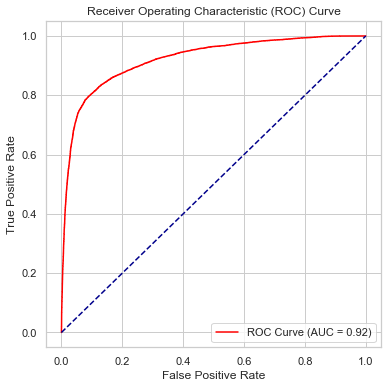

In [208]:
# plot the ROC Curve
plt_roc(j1_trn_df.Churn,j1_trn_df.SM_LR_Pred_Prob)

#### Find the optimal cutoff 

In [209]:
# Predictions at different cutoff values
met_cols = ["Prob","Accuracy","Sensitivity","Specificity","FPR","Prcesion","NPV","F1_Scr"]
j1_sm_lr_cut_df = pd.DataFrame( columns = met_cols)
for i in range(10):
    k = i/10
    kcol = str(k)+"_SM_LR"
    j1_trn_df[kcol] = j1_trn_df.SM_LR_Pred_Prob.map(lambda x: 1 if x > k else 0)
    ac,se,sp,fpra,prcn,nprv,f1scr = logr_metrics(j1_trn_df.Churn,j1_trn_df[kcol])
    j1_sm_lr_cut_df.loc[k] = [k,ac,se,sp,fpra,prcn,nprv,f1scr]

display(j1_trn_df.head())
display(j1_sm_lr_cut_df)

,Churn,SM_LR_Pred_Prob,Cust_id,0.0_SM_LR,0.1_SM_LR,0.2_SM_LR,0.3_SM_LR,0.4_SM_LR,0.5_SM_LR,0.6_SM_LR,0.7_SM_LR,0.8_SM_LR,0.9_SM_LR
0,0,0.008434,0,1,0,0,0,0,0,0,0,0,0
1,0,0.033481,1,1,0,0,0,0,0,0,0,0,0
2,0,0.099215,2,1,0,0,0,0,0,0,0,0,0
3,0,0.087630,3,1,0,0,0,0,0,0,0,0,0
4,0,0.172099,4,1,1,0,0,0,0,0,0,0,0


,Prob,Accuracy,Sensitivity,Specificity,FPR,Prcesion,NPV,F1_Scr
0.0,0.0,0.476228,1.000000,0.000072,0.999928,0.476209,1.000000,0.645178
0.1,0.1,0.703206,0.967490,0.462948,0.537052,0.620884,0.939991,0.756370
0.2,0.2,0.767065,0.945100,0.605216,0.394784,0.685171,0.923817,0.794414
0.3,0.3,0.805919,0.914024,0.707642,0.292358,0.739730,0.900535,0.817693
0.4,0.4,0.831455,0.882151,0.785368,0.214632,0.788870,0.879961,0.832907
0.5,0.5,0.848947,0.847570,0.850199,0.149801,0.837229,0.859853,0.842368
0.6,0.6,0.855397,0.802390,0.903586,0.096414,0.883256,0.834158,0.840883
0.7,0.7,0.847733,0.740956,0.944803,0.055197,0.924262,0.800479,0.822520
0.8,0.8,0.797230,0.606454,0.970663,0.029337,0.949476,0.730683,0.740154
0.9,0.9,0.696111,0.373625,0.989279,0.010721,0.969403,0.634678,0.539368


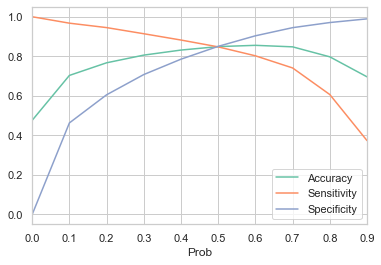

In [210]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
j1_sm_lr_cut_df.plot.line(x='Prob', y=['Accuracy','Sensitivity','Specificity'])
plt.show()

In [211]:
# Precision-Recall is a useful measure of success of prediction when the classes are very imbalanced.
# The precision-recall curve shows the tradeoff between precision and recall for different threshold. 
# A high area under the curve represents both high recall and high precision, where high precision relates 
# to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), 
# as well as returning a majority of all positive results (high recall).

p, r, thresholds = metrics.precision_recall_curve(j1_trn_df.Churn, j1_trn_df.SM_LR_Pred_Prob)

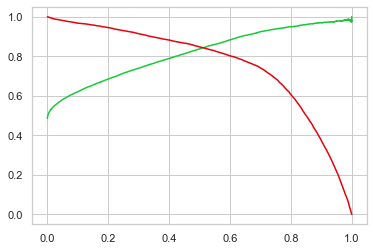

In [212]:
# Plot Precision - Recall Curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [213]:
j1_sm_lr_cut = 0.5
j1_trn_df["SM_LR_Final_Pred"] = j1_trn_df.SM_LR_Pred_Prob.map(lambda x: 1 if x > j1_sm_lr_cut else 0)
j1_trn_df.head()

,Churn,SM_LR_Pred_Prob,Cust_id,0.0_SM_LR,0.1_SM_LR,0.2_SM_LR,0.3_SM_LR,0.4_SM_LR,0.5_SM_LR,0.6_SM_LR,0.7_SM_LR,0.8_SM_LR,0.9_SM_LR,SM_LR_Final_Pred
0,0,0.008434,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.033481,1,1,0,0,0,0,0,0,0,0,0,0
2,0,0.099215,2,1,0,0,0,0,0,0,0,0,0,0
3,0,0.087630,3,1,0,0,0,0,0,0,0,0,0,0
4,0,0.172099,4,1,1,0,0,0,0,0,0,0,0,0


Accuracy= 0.8489470688673876,

Sensitivity = 0.8475697211155379,

Specificity = 0.850199203187251,

FPR = 0.149800796812749,

Precision = 0.8372294372294372,

NPV = 0.8598534798534798,

F1 Score = 0.8423678479509008


(2.5, -0.5)

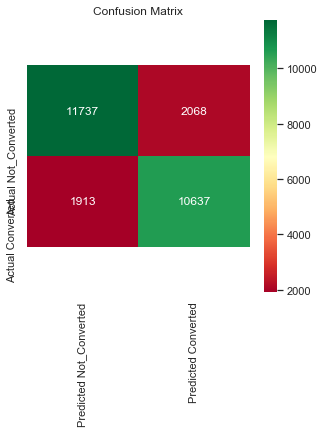

In [214]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(j1_trn_df.Churn,j1_trn_df["SM_LR_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(j1_trn_df.Churn,j1_trn_df["SM_LR_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [215]:
# Print Classification Report
print(classification_report(j1_trn_df.Churn,j1_trn_df["SM_LR_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.86      0.85      0.85     13805
           1       0.84      0.85      0.84     12550

    accuracy                           0.85     26355
   macro avg       0.85      0.85      0.85     26355
weighted avg       0.85      0.85      0.85     26355



### Append the results to DF

In [216]:
# Append the results to DF
res = logr_metrics(j1_trn_df.Churn,j1_trn_df["SM_LR_Final_Pred"])
r_df["Stats_LR_Train"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368


### Apply the Model on the test set

In [217]:
# drop the columns from test set
X1_test = X1_test[X1_train_ref.columns]
# add cons for X_test set
X1_test_sm = sm.add_constant(X1_test)
# predict y_test_pred based on our model
y1_test_pred = m1_log_sm_model.predict(X1_test_sm)
y1_test_pred[:10]

48098    3.494951e-01
69125    9.743730e-10
12043    2.294060e-03
39055    5.670300e-01
37250    6.934791e-01
84256    1.493865e-01
30725    5.237717e-02
4204     2.881476e-01
94017    6.369535e-01
8180     1.412699e-02
dtype: float64

In [218]:
y1_test_pred = y1_test_pred.values.reshape(-1)
y1_test_pred[:10]

array([3.49495109e-01, 9.74372972e-10, 2.29406009e-03, 5.67029956e-01,
       6.93479115e-01, 1.49386476e-01, 5.23771721e-02, 2.88147568e-01,
       6.36953482e-01, 1.41269892e-02])

In [219]:
j1_tst_df = pd.DataFrame({"Churn":y1_test.values,"SM_LR_Pred_Prob":y1_test_pred})
j1_tst_df["Cust_id"] = y1_test.index
j1_tst_df.head()

,Churn,SM_LR_Pred_Prob,Cust_id
0,0,3.494951e-01,48098
1,0,9.743730e-10,69125
2,0,2.294060e-03,12043
3,0,5.670300e-01,39055
4,0,6.934791e-01,37250


In [220]:
j1_tst_df["SM_LR_Final_Pred"] = j1_tst_df.SM_LR_Pred_Prob.map(lambda x: 1 if x > j1_sm_lr_cut else 0)
j1_tst_df.head()

,Churn,SM_LR_Pred_Prob,Cust_id,SM_LR_Final_Pred
0,0,3.494951e-01,48098,0
1,0,9.743730e-10,69125,0
2,0,2.294060e-03,12043,0
3,0,5.670300e-01,39055,1
4,0,6.934791e-01,37250,1


Accuracy= 0.7709011943539631,

Sensitivity = 0.7847222222222222,

Specificity = 0.769869052249449,

FPR = 0.230130947750551,

Precision = 0.20296362819937136,

NPV = 0.9795447047179149,

F1 Score = 0.32251159471994295


(2.5, -0.5)

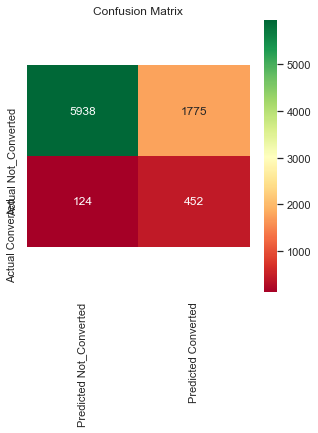

In [221]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(j1_tst_df.Churn,j1_tst_df["SM_LR_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(j1_tst_df.Churn,j1_tst_df["SM_LR_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [222]:
print(classification_report(j1_tst_df.Churn,j1_tst_df["SM_LR_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.98      0.77      0.86      7713
           1       0.20      0.78      0.32       576

    accuracy                           0.77      8289
   macro avg       0.59      0.78      0.59      8289
weighted avg       0.93      0.77      0.82      8289



### Append the results to DF

In [223]:
# Append the results to DF
res = logr_metrics(j1_tst_df.Churn,j1_tst_df["SM_LR_Final_Pred"])
r_df["Stats_LR_Test"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train,Stats_LR_Test
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947,0.770901
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570,0.784722
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199,0.769869
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801,0.230131
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229,0.202964
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853,0.979545
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368,0.322512


### Important Predictors using Logistic Regression (StatsModel)

In [224]:
display(m1_log_sm_model.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                26355
Model:                            GLM   Df Residuals:                    26335
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 28 Jan 2020   Deviance:                          nan
Time:                        09:17:29   Pearson chi2:                 6.18e+04
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.6301      0.043    -14.718      0.000      -0.714      -0.546
og_others_8            -5.9597      3.501     -1.703      0.089     -12.821       0.901
total_og_mou_7          1.1920      0.042     28.439      0.000       1.110       1.274
total_og_mou_8         -1.5253      0.044    -34.709      0.000      -1.611      -1.439
loc_ic_mou_7            0.7756      0.054     14.352      0.000       0.670       0.882
loc_ic_mou_8           -2.7894      0.079    -35.413      0.000      -2.944      -2.635
date_of_last_rech_8     0.5677      0.021     26.453      0.000       0.526       0.610
total_rech_data_6       0.0604      0.013      4.765      0.000       0.036       0.085
total_rech_data_7       0.1057      0.015      6.884      0.000       0.076       0.136
total_rech_data_8      -0.3288      0.016    -21.024      0.000      -0.359      -0.298
max_rech_data_8        -0.4194      0.043     -9.818      0.000      -0.503      -0.336
count_rech_2g_6         0.0265      0.017      1.562      0.118      -0.007       0.060
count_rech_2g_7         0.0517      0.020      2.556      0.011       0.012       0.091
count_rech_2g_8        -0.3635      0.021    -17.123      0.000      -0.405      -0.322
count_rech_3g_6         0.0960      0.027      3.496      0.000       0.042       0.150
count_rech_3g_7         0.1542      0.033      4.695      0.000       0.090       0.219
count_rech_3g_8        -0.0546      0.034     -1.616      0.106      -0.121       0.012
monthly_2g_6           -0.0646      0.023     -2.801      0.005      -0.110      -0.019
monthly_2g_7           -0.1092      0.025     -4.430      0.000      -0.158      -0.061
monthly_2g_8           -0.3044      0.035     -8.616      0.000      -0.374      -0.235
monthly_3g_6           -0.1467      0.033     -4.479      0.000      -0.211      -0.083
monthly_3g_7           -0.0099      0.033     -0.295      0.768      -0.075       0.056
monthly_3g_8           -0.6053      0.056    -10.865      0.000      -0.714      -0.496
=======================================================================================
"""

## Build Model using Tree Model

In [225]:
# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [226]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred_default = dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred_default))


              precision    recall  f1-score   support

           0       0.97      0.86      0.91      7713
           1       0.27      0.70      0.39       576

    accuracy                           0.85      8289
   macro avg       0.62      0.78      0.65      8289
weighted avg       0.93      0.85      0.88      8289



In [227]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test,y_pred_default))
print(accuracy_score(y_test,y_pred_default))

[[6606 1107]
 [ 172  404]]
0.8456991193147545


In [228]:
# Import libraries needed for tree model
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [229]:
# Putting features
features = list(Balanced_df.columns[1:])

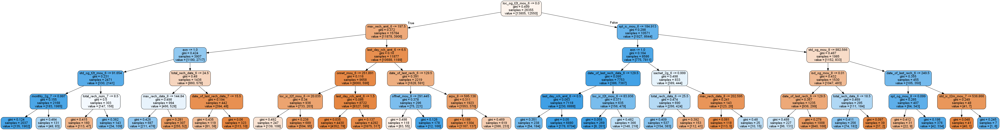

In [230]:
# plotting tree with max_depth=5
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Hyperparameter tuning for DT

In [231]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

In [232]:
# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1,n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)


Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   42.5s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:  1.1min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                     

In [233]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,3.342058,0.135289,0.114495,0.011892,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.863593,0.905521,0.900968,0.908936,0.896794,0.895162,0.016309,9
1,3.525635,0.113760,0.100132,0.003601,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.863593,0.905521,0.900968,0.908936,0.896794,0.895162,0.016309,9
2,3.295072,0.087195,0.091585,0.012108,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.862265,0.901537,0.898501,0.910453,0.897742,0.894100,0.016546,11
3,2.705196,0.288232,0.090603,0.006248,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.862265,0.901537,0.898501,0.910453,0.897742,0.894100,0.016546,11
4,4.417224,0.150976,0.097674,0.019765,entropy,10,50,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.878960,0.914248,0.921078,0.921267,0.916714,0.910453,0.015970,2
5,4.423614,0.283040,0.097559,0.011588,entropy,10,50,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.879340,0.914248,0.921078,0.921267,0.916714,0.910529,0.015820,1
6,3.709137,0.116431,0.093728,0.017112,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.864921,0.910643,0.915007,0.913679,0.908177,0.902485,0.018932,5
7,3.635125,0.075946,0.084356,0.007654,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.864921,0.910643,0.915007,0.913679,0.908177,0.902485,0.018932,5
8,1.884607,0.059902,0.087151,0.011929,gini,5,50,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.860368,0.897932,0.894897,0.907987,0.895086,0.891254,0.016165,13
9,1.951701,0.036760,0.090975,0.012099,gini,5,50,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.860368,0.897932,0.894897,0.907987,0.895086,0.891254,0.016165,13


In [234]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.9105293113261241
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [235]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = rndm_stat,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [236]:
# Caputuring the coefficients of the learnt model
coef_dict = {}
for coef, feat in zip(clf_gini.feature_importances_,X_train.columns):
    coef_dict[feat] = coef
coef_dict

{'arpu_6': 0.00164896692847165,
 'arpu_7': 0.005251883958901371,
 'arpu_8': 0.0003580123959770677,
 'onnet_mou_6': 0.0,
 'onnet_mou_7': 0.0,
 'onnet_mou_8': 0.0,
 'offnet_mou_6': 0.0011043908928662434,
 'offnet_mou_7': 0.0004055898237144775,
 'offnet_mou_8': 0.0,
 'roam_ic_mou_6': 0.0,
 'roam_ic_mou_7': 0.0011900959005976622,
 'roam_ic_mou_8': 0.0007218520362777961,
 'roam_og_mou_6': 0.0,
 'roam_og_mou_7': 0.0,
 'roam_og_mou_8': 0.3127326892248021,
 'loc_og_t2t_mou_6': 0.0005696844192521752,
 'loc_og_t2t_mou_7': 0.0,
 'loc_og_t2t_mou_8': 0.0,
 'loc_og_t2m_mou_6': 0.0,
 'loc_og_t2m_mou_7': 0.0,
 'loc_og_t2m_mou_8': 0.0006077240875746251,
 'loc_og_t2f_mou_6': 0.0,
 'loc_og_t2f_mou_7': 0.0013070895283521628,
 'loc_og_t2f_mou_8': 0.0017031013125385678,
 'loc_og_t2c_mou_6': 0.0024102011882782323,
 'loc_og_t2c_mou_7': 0.000302257224948102,
 'loc_og_t2c_mou_8': 0.0,
 'loc_og_mou_6': 0.0020484659853631775,
 'loc_og_mou_7': 0.0,
 'loc_og_mou_8': 0.01989284709885658,
 'std_og_t2t_mou_6': 0.00057

Accuracy= 0.9301460823373174,

Sensitivity = 0.9227091633466136,

Specificity = 0.9369069177834118,

FPR = 0.06309308221658819,

Precision = 0.9300457794554654,

NPV = 0.9302359033371692,

F1 Score = 0.9263629454821807


(2.5, -0.5)

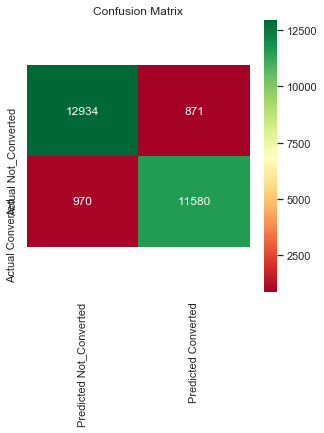

In [237]:
y_train_pred = clf_gini.predict(X_train)

# Calculate metrics
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(y_train,y_train_pred)
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(y_train,y_train_pred).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

### Append the results to DF

In [238]:
# Append the results to DF
res = logr_metrics(y_train,y_train_pred)
r_df["DT_Train"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train,Stats_LR_Test,DT_Train
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947,0.770901,0.930146
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570,0.784722,0.922709
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199,0.769869,0.936907
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801,0.230131,0.063093
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229,0.202964,0.930046
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853,0.979545,0.930236
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368,0.322512,0.926363


### Predicting on Test Set

In [239]:
# accuracy score
clf_gini.score(X_test,y_test)


0.865846302328387

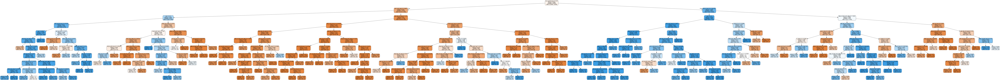

In [240]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Accuracy= 0.865846302328387,

Sensitivity = 0.6979166666666666,

Specificity = 0.8783871385971737,

FPR = 0.1216128614028264,

Precision = 0.3,

NPV = 0.9749604259605699,

F1 Score = 0.4196242171189979


(2.5, -0.5)

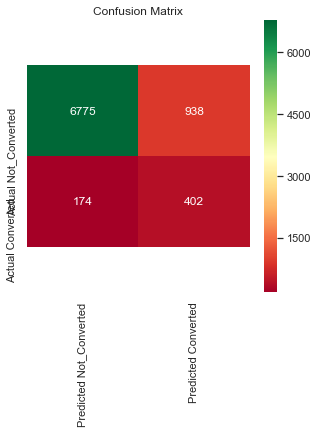

In [241]:
y_test_pred = clf_gini.predict(X_test)

# Calculate metrics
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(y_test,y_test_pred)
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(y_test,y_test_pred).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [242]:
# classification metrics
y_pred = clf_gini.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.88      0.92      7713
           1       0.30      0.70      0.42       576

    accuracy                           0.87      8289
   macro avg       0.64      0.79      0.67      8289
weighted avg       0.93      0.87      0.89      8289



### Append the results to DF

In [243]:
# Append the results to DF
res = logr_metrics(y_test,y_test_pred)
r_df["DT_Test"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train,Stats_LR_Test,DT_Train,DT_Test
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947,0.770901,0.930146,0.865846
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570,0.784722,0.922709,0.697917
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199,0.769869,0.936907,0.878387
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801,0.230131,0.063093,0.121613
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229,0.202964,0.930046,0.300000
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853,0.979545,0.930236,0.974960
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368,0.322512,0.926363,0.419624


### Important Features wrt Tree Model

In [244]:
## Feature Importance
pd.concat((pd.DataFrame(X_train.columns, columns = ['Variables']), 
           pd.DataFrame(clf_gini.feature_importances_, columns=['Importance'])), 
          axis=1).sort_values(by='Importance', ascending=False)

,Variables,Importance
14,roam_og_mou_8,0.312733
95,total_rech_amt_8,0.193193
149,fb_user_8,0.088537
80,total_ic_mou_8,0.083442
101,date_of_last_rech_8,0.054968
104,last_day_rch_amt_8,0.029952
29,loc_og_mou_8,0.019893
113,max_rech_data_8,0.016646
148,fb_user_7,0.015772
116,count_rech_2g_8,0.014245


## Build the Model using Random Forest


### Hyperparameter Tuning and Selection using GrideSearchCV

In [245]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_jobs=-1)

# list of hyper params to tune
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4,5,10],'class_weight': ['balanced'],"n_jobs":[-1]}

# cross validation
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = rndm_stat)

rf_cv = GridSearchCV(estimator = rf, 
                        param_grid = params, 
                        return_train_score=True,
                        verbose = 1,
                        n_jobs=-1)            
rf_cv.fit(MX2_train, my2_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:  7.9min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=-1,
                                              oob_score=False,
                                              rand

In [246]:
# explore the results
rfcv_results = pd.DataFrame(rf_cv.cv_results_)
rfcv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_class_weight,param_criterion,param_max_features,param_n_jobs,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,23.775346,0.429402,1.007059,0.796440,balanced,gini,auto,-1,"{'class_weight': 'balanced', 'criterion': 'gin...",0.951053,0.980649,0.980080,0.979700,0.978183,0.973933,0.011469,4,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1,122.515208,12.551862,1.114048,0.188134,balanced,gini,0.4,-1,"{'class_weight': 'balanced', 'criterion': 'gin...",0.949345,0.976854,0.978941,0.977234,0.973060,0.971087,0.011039,7,1.0,1.0,1.0,1.0,1.0,1.0,0.0
2,10.566821,0.753048,1.413560,0.334407,balanced,gini,5,-1,"{'class_weight': 'balanced', 'criterion': 'gin...",0.954278,0.980839,0.982167,0.981408,0.980839,0.975906,0.010825,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0
3,18.773655,0.545759,1.663010,0.532900,balanced,gini,10,-1,"{'class_weight': 'balanced', 'criterion': 'gin...",0.953519,0.979511,0.978372,0.981028,0.978562,0.974198,0.010382,3,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,24.595496,1.053162,1.719139,0.633342,balanced,entropy,auto,-1,"{'class_weight': 'balanced', 'criterion': 'ent...",0.945741,0.979511,0.979890,0.980080,0.979131,0.972870,0.013569,6,1.0,1.0,1.0,1.0,1.0,1.0,0.0


In [247]:
# Model best Hyperparams and score
print("Best Hyperparams:", rf_cv.best_params_)
print("Best Recall: ", rf_cv.best_score_)

Best Hyperparams: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 5, 'n_jobs': -1}
Best Recall:  0.975905900208689


### Build the model using best params

In [249]:
m2_rf = RandomForestClassifier(criterion=rf_cv.best_params_["criterion"],verbose=3,random_state=rndm_stat,max_features=rf_cv.best_params_["max_features"],class_weight="balanced",n_jobs=-1)

m2_rf.fit(MX2_train, my2_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 100building tree 2 of 100building tree 3 of 100

building tree 4 of 100

building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100


[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.9s


building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100building tree 34 of 100

building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.0s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=3,
                       warm_start=False)

In [252]:
my2_rf_prob = m2_rf.predict_proba(MX2_train)[:,1]

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished


In [264]:
m2_trn_df = pd.DataFrame({"Index":my2_train.index,"Churn":my2_train.values,"RF_Pred_Prob":my2_rf_prob})
m2_trn_df["RF_Pred_Prob"] = my2_rf_prob
m2_trn_df

,Index,Churn,RF_Pred_Prob
0,0,0,0.02
1,1,0,0.00
2,2,0,0.01
3,3,0,0.01
4,4,0,0.02
5,5,0,0.01
6,6,0,0.02
7,7,0,0.05
8,8,0,0.04
9,9,0,0.01


### Model metrics and evaluation

#### Plot the ROC Curve 

* The plot is between Sensitivity on Y-Axis and 1-Specificity on X-Axis
* ROC Curve demonstrates tradeoff between Specificity and Sensitivity

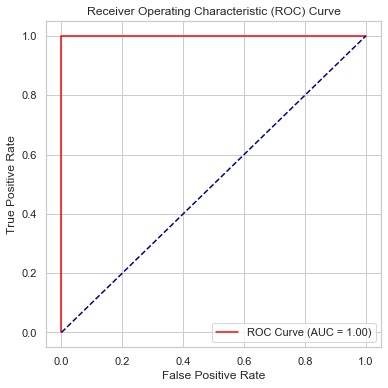

In [265]:
# plot the ROC Curve
plt_roc(m2_trn_df.Churn,m2_trn_df.RF_Pred_Prob)

In [266]:
# Cross Validation Score on Recall
m2_rf_cvs = cross_val_score(m2_rf,MX2_train, my1_train,cv=5,scoring="recall")
np.mean(m2_rf_cvs)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]:

0.9717131474103585

#### Find the optimal cutoff 

In [268]:
# Predictions at different cutoff values
met_cols = ["Prob","Accuracy","Sensitivity","Specificity","FPR","Prcesion","NPV","F1_Scr"]
m2_rf_cut_df = pd.DataFrame( columns = met_cols)
for i in range(10):
    k = i/10
    kcol = str(k)+"_RF"
    m2_trn_df[kcol] = m2_trn_df.RF_Pred_Prob.map(lambda x: 1 if x > k else 0)
    ac,se,sp,fpra,prcn,nprv,f1scr = logr_metrics(m2_trn_df.Churn,m2_trn_df[kcol])
    m2_rf_cut_df.loc[k] = [k,ac,se,sp,fpra,prcn,nprv,f1scr]

display(m2_trn_df.head())
display(m2_rf_cut_df)

,Index,Churn,RF_Pred_Prob,0.0_RF,0.1_RF,0.2_RF,0.3_RF,0.4_RF,0.5_RF,0.6_RF,0.7_RF,0.8_RF,0.9_RF
0,0,0,0.02,1,0,0,0,0,0,0,0,0,0
1,1,0,0.00,0,0,0,0,0,0,0,0,0,0
2,2,0,0.01,1,0,0,0,0,0,0,0,0,0
3,3,0,0.01,1,0,0,0,0,0,0,0,0,0
4,4,0,0.02,1,0,0,0,0,0,0,0,0,0


,Prob,Accuracy,Sensitivity,Specificity,FPR,Prcesion,NPV,F1_Scr
0.0,0.0,0.564447,1.000000,0.168490,0.831510,0.522286,1.000000,0.686186
0.1,0.1,0.958262,1.000000,0.920319,0.079681,0.919414,1.000000,0.958015
0.2,0.2,0.991197,1.000000,0.983194,0.016806,0.981849,1.000000,0.990842
0.3,0.3,0.998103,1.000000,0.996378,0.003622,0.996032,1.000000,0.998012
0.4,0.4,0.999924,1.000000,0.999855,0.000145,0.999841,1.000000,0.999920
0.5,0.5,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000
0.6,0.6,0.999924,0.999841,1.000000,0.000000,1.000000,0.999855,0.999920
0.7,0.7,0.999051,0.998008,1.000000,0.000000,1.000000,0.998192,0.999003
0.8,0.8,0.991007,0.981116,1.000000,0.000000,1.000000,0.983122,0.990468
0.9,0.9,0.946082,0.886773,1.000000,0.000000,1.000000,0.906673,0.939989


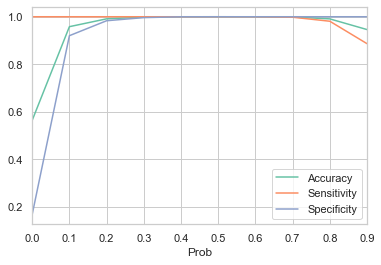

In [269]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
m2_rf_cut_df.plot.line(x='Prob', y=['Accuracy','Sensitivity','Specificity'])
plt.show()

In [270]:
# Precision-Recall is a useful measure of success of prediction when the classes are very imbalanced.
# The precision-recall curve shows the tradeoff between precision and recall for different threshold. 
# A high area under the curve represents both high recall and high precision, where high precision relates 
# to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), 
# as well as returning a majority of all positive results (high recall).

p, r, thresholds = metrics.precision_recall_curve(m2_trn_df.Churn, m2_trn_df.RF_Pred_Prob)

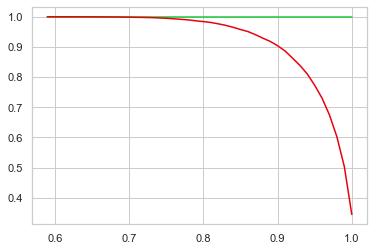

In [271]:
# Plot Precision - Recall Curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [272]:
m2_rf_cut = 0.5
m2_trn_df["RF_Final_Pred"] = m2_trn_df.RF_Pred_Prob.map(lambda x: 1 if x > m2_rf_cut else 0)
m2_trn_df.head()

,Index,Churn,RF_Pred_Prob,0.0_RF,0.1_RF,0.2_RF,0.3_RF,0.4_RF,0.5_RF,0.6_RF,0.7_RF,0.8_RF,0.9_RF,RF_Final_Pred
0,0,0,0.02,1,0,0,0,0,0,0,0,0,0,0
1,1,0,0.00,0,0,0,0,0,0,0,0,0,0,0
2,2,0,0.01,1,0,0,0,0,0,0,0,0,0,0
3,3,0,0.01,1,0,0,0,0,0,0,0,0,0,0
4,4,0,0.02,1,0,0,0,0,0,0,0,0,0,0


Accuracy= 1.0,

Sensitivity = 1.0,

Specificity = 1.0,

FPR = 0.0,

Precision = 1.0,

NPV = 1.0,

F1 Score = 1.0


(2.5, -0.5)

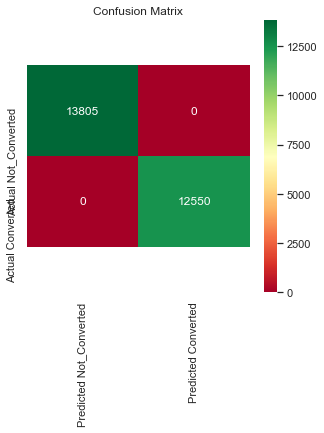

In [273]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m2_trn_df.Churn,m2_trn_df["RF_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m2_trn_df.Churn,m2_trn_df["RF_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [274]:
# Print Classification Report
print(classification_report(m2_trn_df.Churn,m2_trn_df["RF_Final_Pred"]))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13805
           1       1.00      1.00      1.00     12550

    accuracy                           1.00     26355
   macro avg       1.00      1.00      1.00     26355
weighted avg       1.00      1.00      1.00     26355



### Append the results to DF

In [275]:
# Append the results to DF
res = logr_metrics(m2_trn_df.Churn,m2_trn_df["RF_Final_Pred"])
r_df["RF_Train"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train,Stats_LR_Test,DT_Train,DT_Test,RF_Train
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947,0.770901,0.930146,0.865846,1.0
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570,0.784722,0.922709,0.697917,1.0
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199,0.769869,0.936907,0.878387,1.0
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801,0.230131,0.063093,0.121613,0.0
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229,0.202964,0.930046,0.300000,1.0
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853,0.979545,0.930236,0.974960,1.0
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368,0.322512,0.926363,0.419624,1.0


### Apply the Model on the test set

In [276]:
# Predict the Probabilities
my2_rf_test_pred_prob =  m2_rf.predict_proba(MX1_test)[:,1]

# inspect the probabilities
display(my2_rf_test_pred_prob)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished


array([0.59, 0.5 , 0.61, ..., 0.58, 0.58, 0.76])

In [278]:
m2_tst_df = pd.DataFrame({"Index":my2_test.index,"Churn":my2_test.values,"RF_Pred_Prob":my2_rf_test_pred_prob})
m2_tst_df

,Index,Churn,RF_Pred_Prob
0,48098,0,0.59
1,69125,0,0.50
2,12043,0,0.61
3,39055,0,0.62
4,37250,0,0.62
5,84256,0,0.57
6,30725,0,0.57
7,4204,0,0.48
8,94017,0,0.62
9,8180,0,0.65


In [279]:
m2_tst_df["RF_Final_Pred"] = m2_tst_df.RF_Pred_Prob.map(lambda x: 1 if x > m2_rf_cut else 0)
m2_tst_df.head()

,Index,Churn,RF_Pred_Prob,RF_Final_Pred
0,48098,0,0.59,1
1,69125,0,0.50,0
2,12043,0,0.61,1
3,39055,0,0.62,1
4,37250,0,0.62,1


Accuracy= 0.27735553142719266,

Sensitivity = 0.9236111111111112,

Specificity = 0.22909373784519643,

FPR = 0.7709062621548036,

Precision = 0.08212411238036431,

NPV = 0.9757040309221424,

F1 Score = 0.15083640487666572


(2.5, -0.5)

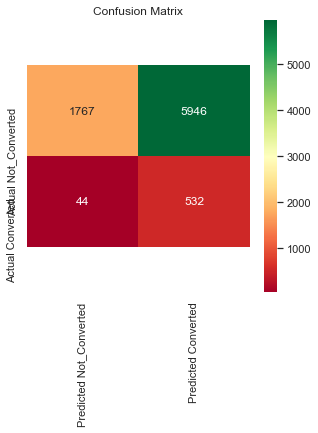

In [281]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m2_tst_df.Churn,m2_tst_df["RF_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m2_tst_df.Churn,m2_tst_df["RF_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [282]:
print(classification_report(m2_tst_df.Churn,m2_tst_df["RF_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.98      0.23      0.37      7713
           1       0.08      0.92      0.15       576

    accuracy                           0.28      8289
   macro avg       0.53      0.58      0.26      8289
weighted avg       0.91      0.28      0.36      8289



### Append the results to DF

In [283]:
# Append the results to DF
res = logr_metrics(m2_tst_df.Churn,m2_tst_df["RF_Final_Pred"])
r_df["RF_Test"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train,Stats_LR_Test,DT_Train,DT_Test,RF_Train,RF_Test
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947,0.770901,0.930146,0.865846,1.0,0.277356
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570,0.784722,0.922709,0.697917,1.0,0.923611
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199,0.769869,0.936907,0.878387,1.0,0.229094
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801,0.230131,0.063093,0.121613,0.0,0.770906
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229,0.202964,0.930046,0.300000,1.0,0.082124
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853,0.979545,0.930236,0.974960,1.0,0.975704
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368,0.322512,0.926363,0.419624,1.0,0.150836


In [287]:
## Feature Importance using Random Forest
pd.concat((pd.DataFrame(MX2_train.columns, columns = ['Variables']), 
           pd.DataFrame(m2_rf.feature_importances_, columns=['Importance'])), 
          axis=1).sort_values(by='Importance', ascending=False)

,Variables,Importance
14,roam_og_mou_8,0.045468
11,roam_ic_mou_8,0.041330
2,arpu_8,0.028657
65,loc_ic_mou_8,0.027166
101,date_of_last_rech_8,0.026903
29,loc_og_mou_8,0.026831
95,total_rech_amt_8,0.025865
80,total_ic_mou_8,0.025675
20,loc_og_t2m_mou_8,0.025082
149,fb_user_8,0.024849


## Build the Model using Scikit Learn Logistic Regression Classifier

### Hyperparameter Tuning and Selection using GrideSearchCV

In [288]:
# list of alphas to tune
params = {'C': [0.001, 0.01, 0.05, 0.1,  0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0],"penalty":['l1','l2'],"class_weight":["Balanced"]}

lr = LogisticRegression()

# cross validation
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = rndm_stat)
lr_cv = GridSearchCV(estimator = lr, 
                        param_grid = params, 
                        return_train_score=True,
                        verbose = 1,
                        scoring='recall',
                        n_jobs=-1)            
lr_cv.fit(MX3_train, my3_train)

Fitting 5 folds for each of 44 candidates, totalling 220 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 220 out of 220 | elapsed:   55.8s finished


GridSearchCV(cv=None, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                               0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0,
                               8.0, 9.0, 10.0],
                         'class_weight': ['Balanced'],
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs'

In [289]:
# explore the results
lcv_results = pd.DataFrame(lr_cv.cv_results_)
lcv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_class_weight,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.175051,0.014805,0.000000,0.000000,0.001,Balanced,l1,"{'C': 0.001, 'class_weight': 'Balanced', 'pena...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.577734,0.048726,0.011168,0.011637,0.001,Balanced,l2,"{'C': 0.001, 'class_weight': 'Balanced', 'pena...",0.826295,0.867331,0.865339,0.870916,0.861753,0.858327,0.016288,22,0.865339,0.857371,0.858068,0.858267,0.857171,0.859243,0.003075
2,0.190291,0.048423,0.000000,0.000000,0.01,Balanced,l1,"{'C': 0.01, 'class_weight': 'Balanced', 'penal...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.199632,0.085697,0.012984,0.006560,0.01,Balanced,l2,"{'C': 0.01, 'class_weight': 'Balanced', 'penal...",0.823904,0.892430,0.896414,0.902390,0.893625,0.881753,0.029128,21,0.893426,0.883068,0.882072,0.881474,0.882171,0.884442,0.004521
4,0.180879,0.028138,0.000000,0.000000,0.05,Balanced,l1,"{'C': 0.05, 'class_weight': 'Balanced', 'penal...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [290]:
# Model best Hyperparams and score
print("Best Hyperparams:", lr_cv.best_params_)
print("Best Recall: ", lr_cv.best_score_)

Best Hyperparams: {'C': 3.0, 'class_weight': 'Balanced', 'penalty': 'l2'}
Best Recall:  0.9110756972111554


### Build the model using best params

In [291]:
m2_lr = LogisticRegression(C=lr_cv.best_params_["C"],verbose=3,random_state=rndm_stat,penalty=lr_cv.best_params_["penalty"],class_weight=lr_cv.best_params_["class_weight"],n_jobs=-1)

m2_lr.fit(MX3_train, my3_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   14.2s finished


LogisticRegression(C=3.0, class_weight='Balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=-1, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=3,
                   warm_start=False)

In [292]:
my2_lr_prob = m2_lr.predict_proba(MX3_train)[:,1]

In [293]:
m3_trn_df = pd.DataFrame({"Index":my3_train.index,"Churn":my3_train.values,"LR_Pred_Prob":my2_lr_prob})
m3_trn_df

,Index,Churn,LR_Pred_Prob
0,0,0,0.005670
1,1,0,0.018744
2,2,0,0.119415
3,3,0,0.017381
4,4,0,0.027280
5,5,0,0.001675
6,6,0,0.003587
7,7,0,0.235517
8,8,0,0.000009
9,9,0,0.316259


### Model metrics and evaluation

#### Plot the ROC Curve 

* The plot is between Sensitivity on Y-Axis and 1-Specificity on X-Axis
* ROC Curve demonstrates tradeoff between Specificity and Sensitivity

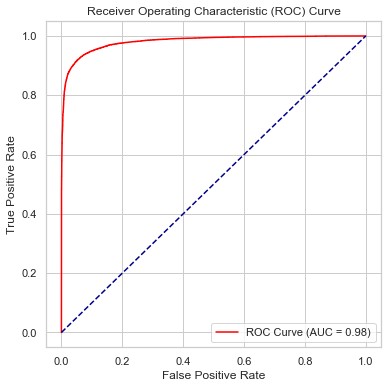

In [294]:
# plot the ROC Curve
plt_roc(m3_trn_df.Churn,m3_trn_df.LR_Pred_Prob)

In [295]:
# Cross Validation Score on Recall
m2_cvs = cross_val_score(m2_lr,MX3_train, my3_train,cv=5,scoring="recall")
np.mean(m2_cvs)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   11.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   11.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:   11.8s finished


0.9110756972111554

#### Find the optimal cutoff 

In [296]:
# Predictions at different cutoff values
met_cols = ["Prob","Accuracy","Sensitivity","Specificity","FPR","Prcesion","NPV","F1_Scr"]
m2_lr_cut_df = pd.DataFrame( columns = met_cols)
for i in range(10):
    k = i/10
    kloc = str(k)+"LR"
    m3_trn_df[kloc] = m3_trn_df.LR_Pred_Prob.map(lambda x: 1 if x > k else 0)
    ac,se,sp,fpra,prcn,nprv,f1scr = logr_metrics(m3_trn_df.Churn,m3_trn_df[kloc])
    m2_lr_cut_df.loc[k] = [k,ac,se,sp,fpra,prcn,nprv,f1scr]

display(m3_trn_df.head())
display(m2_lr_cut_df)

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR
0,0,0,0.005670,1,0,0,0,0,0,0,0,0,0
1,1,0,0.018744,1,0,0,0,0,0,0,0,0,0
2,2,0,0.119415,1,1,0,0,0,0,0,0,0,0
3,3,0,0.017381,1,0,0,0,0,0,0,0,0,0
4,4,0,0.027280,1,0,0,0,0,0,0,0,0,0


,Prob,Accuracy,Sensitivity,Specificity,FPR,Prcesion,NPV,F1_Scr
0.0,0.0,0.476190,1.000000,0.000000,1.000000,0.476190,NaN,0.645161
0.1,0.1,0.853766,0.983347,0.735965,0.264035,0.771988,0.979844,0.864943
0.2,0.2,0.899715,0.970837,0.835060,0.164940,0.842542,0.969228,0.902151
0.3,0.3,0.919788,0.953865,0.888808,0.111192,0.886347,0.954938,0.918867
0.4,0.4,0.929994,0.938725,0.922057,0.077943,0.916310,0.943029,0.927382
0.5,0.5,0.933637,0.920558,0.945527,0.054473,0.938887,0.929039,0.929632
0.6,0.6,0.932499,0.898645,0.963274,0.036726,0.956979,0.912697,0.926895
0.7,0.7,0.927869,0.871713,0.978921,0.021079,0.974090,0.893547,0.920062
0.8,0.8,0.910947,0.825657,0.988482,0.011518,0.984887,0.861816,0.898271
0.9,0.9,0.873496,0.740000,0.994857,0.005143,0.992413,0.808025,0.847818


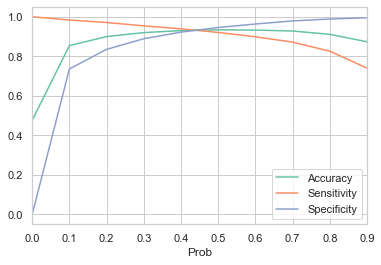

In [297]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
m2_lr_cut_df.plot.line(x='Prob', y=['Accuracy','Sensitivity','Specificity'])
plt.show()

In [298]:
# Precision-Recall is a useful measure of success of prediction when the classes are very imbalanced.
# The precision-recall curve shows the tradeoff between precision and recall for different threshold. 
# A high area under the curve represents both high recall and high precision, where high precision relates 
# to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), 
# as well as returning a majority of all positive results (high recall).

p, r, thresholds = metrics.precision_recall_curve(m3_trn_df.Churn, m3_trn_df.LR_Pred_Prob)

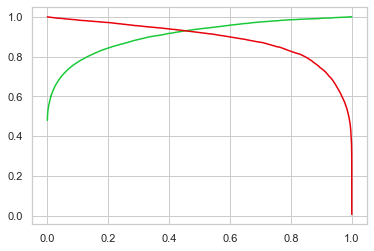

In [299]:
# Plot Precision - Recall Curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [301]:
m2_lr_prob_cut = 0.45
m3_trn_df["LR_Final_Pred"] = m3_trn_df.LR_Pred_Prob.map(lambda x: 1 if x > m2_lr_prob_cut else 0)
m3_trn_df.head()

,Index,Churn,LR_Pred_Prob,0.0LR,0.1LR,0.2LR,0.3LR,0.4LR,0.5LR,0.6LR,0.7LR,0.8LR,0.9LR,LR_Final_Pred
0,0,0,0.005670,1,0,0,0,0,0,0,0,0,0,0
1,1,0,0.018744,1,0,0,0,0,0,0,0,0,0,0
2,2,0,0.119415,1,1,0,0,0,0,0,0,0,0,0
3,3,0,0.017381,1,0,0,0,0,0,0,0,0,0,0
4,4,0,0.027280,1,0,0,0,0,0,0,0,0,0,0


Accuracy= 0.9326882944412825,

Sensitivity = 0.9299601593625498,

Specificity = 0.9351684172401303,

FPR = 0.06483158275986961,

Precision = 0.9287760623905778,

NPV = 0.9362535354267895,

F1 Score = 0.9293677337155598


(2.5, -0.5)

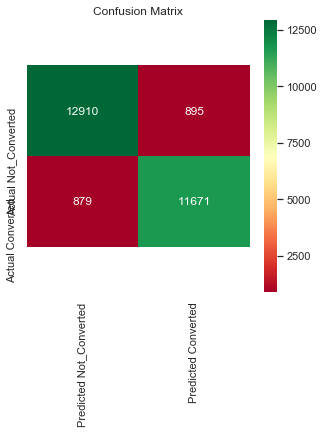

In [302]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m3_trn_df.Churn,m3_trn_df["LR_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m3_trn_df.Churn,m3_trn_df["LR_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [303]:
# Print Classification Report
print(classification_report(m3_trn_df.Churn,m3_trn_df["LR_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     13805
           1       0.93      0.93      0.93     12550

    accuracy                           0.93     26355
   macro avg       0.93      0.93      0.93     26355
weighted avg       0.93      0.93      0.93     26355



### Append the results to DF

In [304]:
# Append the results to DF
res = logr_metrics(m3_trn_df.Churn,m3_trn_df["LR_Final_Pred"])
r_df["LR_Train"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train,Stats_LR_Test,DT_Train,DT_Test,RF_Train,RF_Test,LR_Train
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947,0.770901,0.930146,0.865846,1.0,0.277356,0.932688
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570,0.784722,0.922709,0.697917,1.0,0.923611,0.929960
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199,0.769869,0.936907,0.878387,1.0,0.229094,0.935168
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801,0.230131,0.063093,0.121613,0.0,0.770906,0.064832
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229,0.202964,0.930046,0.300000,1.0,0.082124,0.928776
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853,0.979545,0.930236,0.974960,1.0,0.975704,0.936254
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368,0.322512,0.926363,0.419624,1.0,0.150836,0.929368


### Apply the Model on the test set

In [306]:
# Predict the Probabilities
my3_test_pred_prob =  m2_lr.predict_proba(MX3_test)[:,1]

# inspect the probabilities
display(my3_test_pred_prob)

array([2.53691404e-06, 5.11163016e-09, 4.25210909e-04, ...,
       3.11084161e-07, 3.57277233e-01, 8.66037816e-02])

In [307]:
m3_tst_df = pd.DataFrame({"Index":my3_test.index,"Churn":my3_test.values,"LR_Pred_Prob":my3_test_pred_prob})
m3_tst_df

,Index,Churn,LR_Pred_Prob
0,48098,0,2.536914e-06
1,69125,0,5.111630e-09
2,12043,0,4.252109e-04
3,39055,0,3.774857e-03
4,37250,0,1.239798e-01
5,84256,0,1.097605e-01
6,30725,0,7.349607e-03
7,4204,0,4.033079e-02
8,94017,0,4.776572e-01
9,8180,0,3.502114e-03


In [308]:
m3_tst_df["LR_Final_Pred"] = m3_tst_df.LR_Pred_Prob.map(lambda x: 1 if x > m2_lr_prob_cut else 0)
m3_tst_df.head()

,Index,Churn,LR_Pred_Prob,LR_Final_Pred
0,48098,0,2.536914e-06,0
1,69125,0,5.111630e-09,0
2,12043,0,4.252109e-04,0
3,39055,0,3.774857e-03,0
4,37250,0,1.239798e-01,0


Accuracy= 0.8557123899143443,

Sensitivity = 0.6684027777777778,

Specificity = 0.8697005056398288,

FPR = 0.13029949436017113,

Precision = 0.27697841726618705,

NPV = 0.9723148282359763,

F1 Score = 0.39165818921668366


(2.5, -0.5)

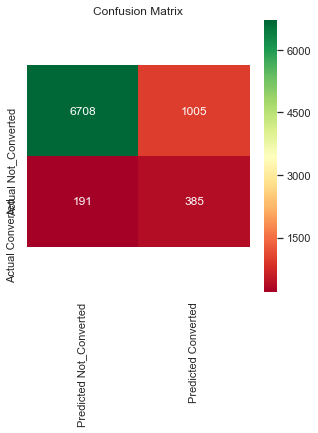

In [310]:
# Calculate metrics for final cutoff
acc,sen,spec,fpr,prec,npv,f1_scr = logr_metrics(m3_tst_df.Churn,m3_tst_df["LR_Final_Pred"])
print("Accuracy= {},\n\nSensitivity = {},\n\nSpecificity = {},\n\nFPR = {},\n\nPrecision = {},\n\nNPV = {},\n\nF1 Score = {}".format(acc,sen,spec,fpr,prec,npv,f1_scr))

# Visualize the confusion matrix
plt.figure(figsize = (5,5))
tn, fp, fn, tp = confusion_matrix(m3_tst_df.Churn,m3_tst_df["LR_Final_Pred"]).ravel()
ax = sns.heatmap([[tn,fp],[fn,tp]],yticklabels=["Actual Not_Converted","Actual Converted"],\
                 xticklabels=["Predicted Not_Converted","Predicted Converted"],annot = True,fmt='d',cmap='RdYlGn')
ax.set_title('Confusion Matrix')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [311]:
print(classification_report(m3_tst_df.Churn,m3_tst_df["LR_Final_Pred"]))

              precision    recall  f1-score   support

           0       0.97      0.87      0.92      7713
           1       0.28      0.67      0.39       576

    accuracy                           0.86      8289
   macro avg       0.62      0.77      0.65      8289
weighted avg       0.92      0.86      0.88      8289



### Append the results to DF

In [312]:
# Append the results to DF
res = logr_metrics(m3_tst_df.Churn,m3_tst_df["LR_Final_Pred"])
r_df["LR_Test"] = res
r_df

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train,Stats_LR_Test,DT_Train,DT_Test,RF_Train,RF_Test,LR_Train,LR_Test
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947,0.770901,0.930146,0.865846,1.0,0.277356,0.932688,0.855712
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570,0.784722,0.922709,0.697917,1.0,0.923611,0.929960,0.668403
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199,0.769869,0.936907,0.878387,1.0,0.229094,0.935168,0.869701
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801,0.230131,0.063093,0.121613,0.0,0.770906,0.064832,0.130299
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229,0.202964,0.930046,0.300000,1.0,0.082124,0.928776,0.276978
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853,0.979545,0.930236,0.974960,1.0,0.975704,0.936254,0.972315
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368,0.322512,0.926363,0.419624,1.0,0.150836,0.929368,0.391658


# Final Conclusions

## Model Evaluation

In [313]:
# Explore the Model results both on test and train data
display(r_df)

,Metrics,PCA_LR_Train,PCA_LR_Test,PCA_RF_Train,PCA_RF_Test,PCA_AB_Train,PCA_AB_Test,Stats_LR_Train,Stats_LR_Test,DT_Train,DT_Test,RF_Train,RF_Test,LR_Train,LR_Test
0,Accuracy,0.736331,0.479069,0.998786,0.809989,0.593853,0.809989,0.848947,0.770901,0.930146,0.865846,1.0,0.277356,0.932688,0.855712
1,Sensitivity(Recall),0.974661,0.947917,1.000000,0.729167,1.000000,0.729167,0.847570,0.784722,0.922709,0.697917,1.0,0.923611,0.929960,0.668403
2,Specificity,0.519667,0.444055,0.997682,0.816025,0.224629,0.816025,0.850199,0.769869,0.936907,0.878387,1.0,0.229094,0.935168,0.869701
3,FPR,0.480333,0.555945,0.002318,0.183975,0.775371,0.183975,0.149801,0.230131,0.063093,0.121613,0.0,0.770906,0.064832,0.130299
4,Prcesion,0.648465,0.112950,0.997457,0.228385,0.539692,0.228385,0.837229,0.202964,0.930046,0.300000,1.0,0.082124,0.928776,0.276978
5,NPV,0.957555,0.991317,1.000000,0.975814,1.000000,0.975814,0.859853,0.979545,0.930236,0.974960,1.0,0.975704,0.936254,0.972315
6,F1_Scr,0.778786,0.201848,0.998727,0.347826,0.701039,0.347826,0.842368,0.322512,0.926363,0.419624,1.0,0.150836,0.929368,0.391658


We Choose the model __PCA_LR (PCA for dimensionality reduction and Logistic Regression for LR modelling __ as our final model to predict the churners.

1) __The Recall / Sensitivity score both on train (0.97) and test (0.94) is high suggesting that the model is able to predict true churners correctly__

2)  __The Precision Score on train is 0.64 and test is 0.11. high Recall and low Precision is ok model which suggest that model is able to predict True churners along with some non churners in it.__ We should have a higher precision aswell to have better model. Here we observe that model prediction have non churners  in to it.

3) Test and Train Recall scores are close enough suggesting that its not overfit. This model has underfit wrt Accuracy but this can be lived with it.

## Important Features that can be used to predict the Churn

__EDA of Important Features w.r.t Churn__

___The most important predictors as predicted by LR Model are -___
* og_others_8
* total_ic_mou_8
* total_og_mou_8
* monthly_3g_8
* monthly_2g_8
* count_rech_2g_8
* total_rech_data_8
* std_og_mou_7
* loc_ic_mou_7
* fb_user_8

___The most important predictors as predicted by DT Model are -___
* 'roam_og_mou_8'
* 'total_rech_amt_8'
* 'fb_user_8'
* 'date_of_last_rech_8'
* 'last_day_rch_amt_8'
* 'date_of_last_rech_data_8'
* 'total_ic_mou_8'
* 'max_rech_amt_8'
* 'max_rech_data_8'
* 'loc_og_mou_8'

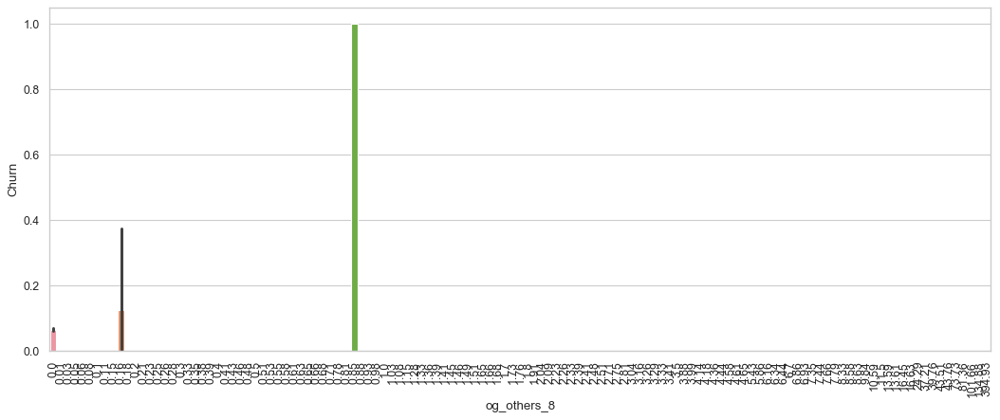

In [314]:
figure(num=None, figsize=(16, 6), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x="og_others_8", y="Churn", data=hvc_df)
plt.xticks(rotation='vertical')
plt.show()

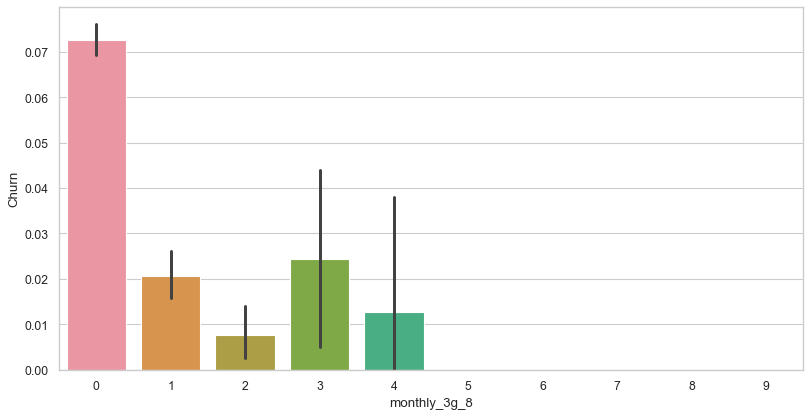

In [315]:
figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x="monthly_3g_8", y="Churn", data=hvc_df)
plt.show()

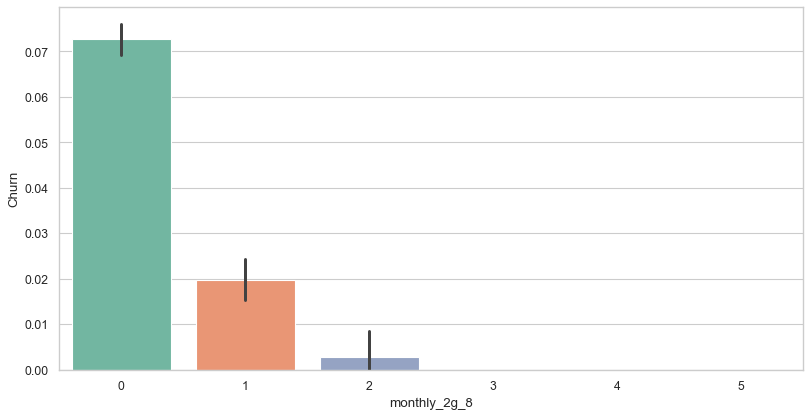

In [316]:
figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x="monthly_2g_8", y="Churn", data=hvc_df)
plt.show()

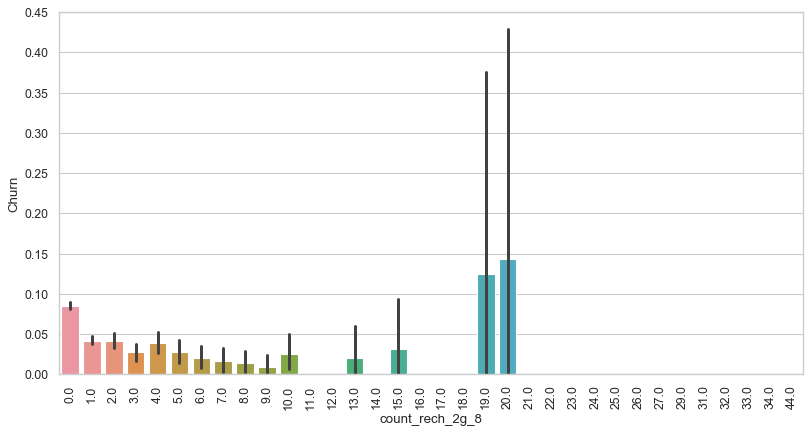

In [317]:
figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x="count_rech_2g_8", y="Churn", data=hvc_df)
plt.xticks(rotation='vertical')
plt.show()

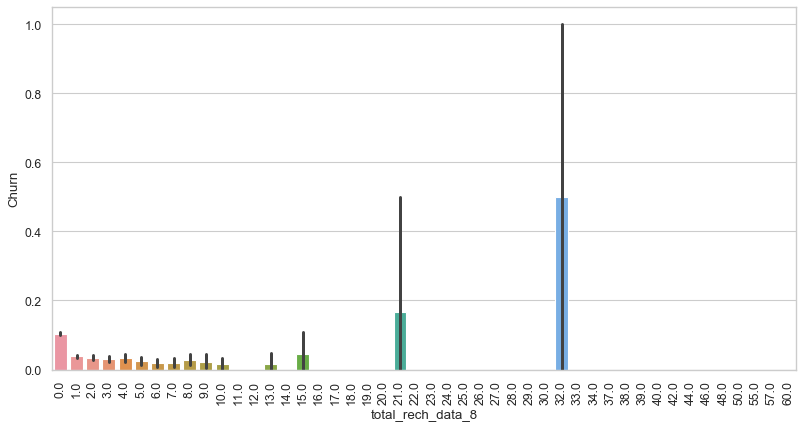

In [318]:
figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x="total_rech_data_8", y="Churn", data=hvc_df)
plt.xticks(rotation='vertical')
plt.show()


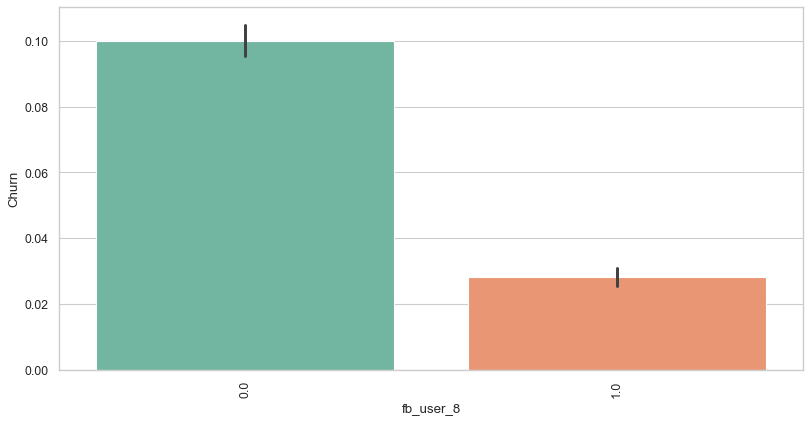

In [319]:
figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x="fb_user_8", y="Churn", data=hvc_df)
plt.xticks(rotation='vertical')
plt.show()

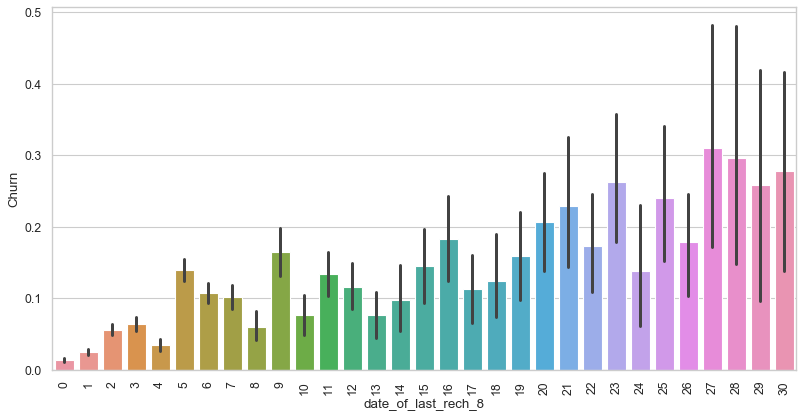

In [320]:
figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x="date_of_last_rech_8", y="Churn", data=hvc_df)
plt.xticks(rotation='vertical')
plt.show()

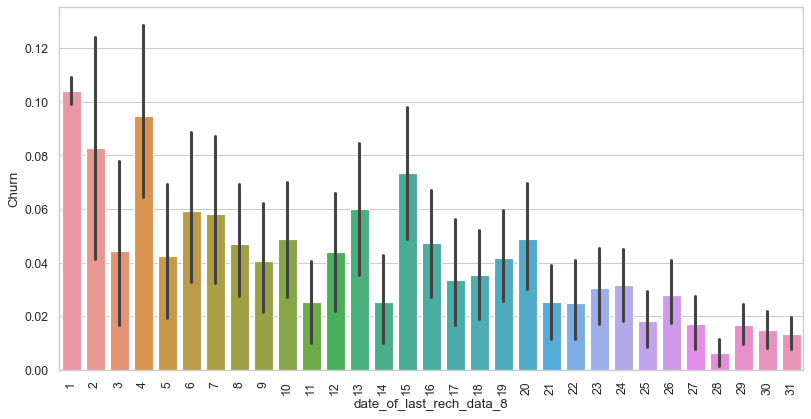

In [321]:
figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x="date_of_last_rech_data_8", y="Churn", data=hvc_df)
plt.xticks(rotation='vertical')
plt.show()

## Recommendations
1) Customers that did not have fb_user package for the Month of August had shown a high rate of churn. There is a high correlation between churn and fb_user. Though this does not guarantee causation but the company could roll out some discounts and offers in their fb_user service pack. It could be a possibility that other competitor offer a better fb_user plan and therefore the customers churn.

2) The Customers that have not availed the monthly_3g_8 or monthly_2g_8 show a high chance of Churn. As a retention measure, this criteria should give a warning that if a customer is not availing the monthly_3g_8/monthly_2g_8 service the risk of churn increases. Therefore monthly_3g/monthly_2g packs should be offered at its best price to keep the customer into the network.

3) High volume of customers that recharge at the month beginning and do not make any recharge in the later period of the month have high probability of churning out. The Telecom company can offer some discount schemes during the end of the month to lure the customer to continue in order to avail the beneficiary offers.